In this iPython notebook, we will featurize MOR ligand binding simulation by pairwise distances between the ligand and different receptor residues. We will then perform tICA and prospectively build an MSM. 

In [5]:
import seaborn as sns

import matplotlib
import matplotlib.pyplot as plt

# changing matplotlib the default style
matplotlib.style.use('ggplot')
#matplotlib.rcParams["figure.facecolor"] = "white"
#matplotlib.rcPar|ams["savefig.transparent"] = "True"


In [6]:
import pandas as pd


from PDB_Order_Fixer import PDB_Order_Fixer
import mdtraj as md
import os
import numpy as np
import h5py

import datetime
import glob
import copy
from functools import partial 
import operator
import time

import random 
import subprocess
from subprocess import Popen
import sys
from custom_clusterer import *
from custom_tica import *
from custom_featurizer import *
from pdb_editing import *
from analysis import *
from io_functions import *
#from topology_fixing import *
from subsampling import *
from conversions import *
from custom_msm import *
from grids import *
from docking_analysis import *

from scipy import stats
import os
from efficacy_scripts import *




/home/enf/anaconda3/lib/python3.5/site-packages/matplotlib/__init__.py:1350: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


In [7]:
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [8]:
from sklearn.preprocessing import scale

In [9]:
from detect_intermediates import *
from interpret_tICs import *

In [10]:
from msmbuilder.utils import verbosedump, verboseload


In [11]:
from mor_h8_feature_types import *
#from b2ar_feature_types import *
from get_variable_names import *
from mor_h8_tica_config import *
from residue import Residue, Atom

tm6_tm3_residues
[R279, R165]
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 273, 274, 275, 276, 277, 278,

In [12]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.preprocessing import scale
from random import shuffle
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc

In [13]:

ori_feature_name = copy.deepcopy(feature_name)

In [14]:
#schemes = ["closest-heavy", "CA"]
#feature_name = "%s-CA" %ori_feature_name

In [15]:
rho = 0.1
rho_string = "0pt1"
lag_time = 5
n_components = 10
n_clusters = 100

rho = 0.01
rho_string = "0pt01"
lag_time=50
ori_feature_name = copy.deepcopy(feature_name)

In [16]:
schemes = ["closest-heavy", "CA"]
feature_name = "%s-CA-py3-far" %ori_feature_name
#feature_name = "%s_phi_psi_chi2" %feature_name
(active_ref_dir, inactive_ref_dir, simulation_ref_dir, scripts_dir,
                    ligand_dir, agonist_dir, inverse_agonist_dir, biased_agonist_dir, ref_receptors_dir, whole_trajectory_pnas,
                    sasa_file) = get_base_files(base)

tica_dir = get_tica_dir(base, is_sparse, lag_time, n_components, feature_name, 
                                                                 wolf_string, shrinkage_string, rho_string)
#tica_dir = "%s-with-inactive" %tica_dir
tica_dir = "%s-backup" %tica_dir
ori_tica_dir = copy.deepcopy(tica_dir)
#tica_dir = "%s-normalized" % ori_tica_dir
features_dir = get_features_dir(base, feature_name)

landmarks_dir = get_landmarks_dir(tica_dir)
analysis_dir = get_analysis_dir(tica_dir, n_clusters, sampling_method)
gmm_dir = get_gmm_dir(tica_dir)
rf_dir = get_rf_dir(tica_dir)


ref_tica_dir, ref_tica_coords = get_ref_tica_dirs(tica_dir)

graph_file = get_graph_file(tica_dir, msm_lag_time, n_clusters)

pnas_titles =    ["tm6_tm3_dist", "rmsd_npxxy_inactive", "rmsd_npxxy_active", "rmsd_connector_inactive", "rmsd_connector_active"]
pnas_features_dir = analysis_dir


(clusterer_dir, msm_model_dir, macrostate_dir, features_known, model_dir, projected_features_dir,
                 projection_operator_dir, ktica_fit_model_filename, ktica_projected_data_filename, nystroem_data_filename,
                 mutual_information_csv, pearson_csv) = get_tica_files(base, tica_dir, n_clusters, msm_lag_time, n_macrostates)

(standardized_features_dir, feature_residues_csv, feature_residues_pkl,
                    contact_csv, ref_features_dir) = get_feature_files(features_dir)

(kmeans_csv, tica_coords_csv, features_csv, active_rmsd_dir, inactive_rmsd_dir, active_pnas_dir, inactive_pnas_joined, active_pnas_joined,
                clusters_map_file, ktica_clusters_map_file, analysis_file, combined_file, docking_summary, docking_joined, docking_z_scores_csv,
                aggregate_docking, aggregate_docking_joined, docking_pnas_joined, aggregate_docking_pnas, aggregate_docking_pnas_joined, docking_multiple_ligands,
                docking_distances_file, docking_pdf, mmgbsa_docking_distances, pnas_coords, mmgbsa_dir, mmgbsa_csv, mmgbsa_pdf, aggregate_mmgbsa,
                aggregate_mmgbsa_joined, aggregate_mmgbsa_pnas_joined, mmgbsa_z_scores_csv, active_clusters_csv, intermediate_clusters_csv,
                inactive_clusters_csv, pnas_clusters_averages, tica_clusters_averages, tica_classes_csv, tica_samples_csv, subgraph_save_base,
                degree_save_base, degree_map_csv, degree_z_map_csv, aggregate_docking_pnas_degree_z_joined, tic_residue_csv, feature_coefs_csv,
                duplicated_feature_coefs_csv) = get_analysis_files(analysis_dir, n_clusters, tica_dir, tica_dir, sampling_method, n_samples, precision,
                                                                                                                     msm_lag_time)

(inactive_pnas_distances_dir, active_pnas_distances_dir, active_pnas_all_distances_dir,
                    inactive_pnas_distances_new_csv, active_pnas_distances_new_csv, active_pnas_joined, active_pnas_means, pnas_coords_dir,
                    pnas_coords_csv, pnas_all_coords_csv, pnas_coords_hexbin_dir, pnas_coords_co_crystallized_docking_dir,
                    pnas_coords_active_colors_dir, user_defined_features_file, reaction_coordinates_trajs_file) = get_pnas_files(whole_trajectory_pnas, pnas_features_dir)

features_dir = get_features_dir(base, feature_name)



graph_file = get_graph_file(tica_dir, msm_lag_time, n_clusters)
(scripts_dir, pymol_fixpdb_dir) = get_script_dir(scripts_dir)
(save_dir, reimaged_dir, mae_dir, combined_reimaged_dir, grid_dir, docking_dir) = get_docking_dirs(tica_dir, n_clusters, n_components, n_samples, sampling_method, precision)



/home/enf/md_simulations/MOR/h8_reimaged/featuresall_residues_4dkl_5c1m_under_cutoff6A-CA-py3-far
/home/enf/md_simulations/MOR/h8_reimaged/featuresall_residues_4dkl_5c1m_under_cutoff6A-CA-py3-far


In [17]:
def normalize_per_ligand(df):
    new_df = copy.deepcopy(df)
    n_df = new_df.ix[:, [i for i in range(0, new_df.shape[1]) if "difference" not in new_df.columns.values[i].lower()]]
    n_df = pd.DataFrame(preprocessing.scale(n_df.values, axis=1), index=n_df.index, columns=n_df.columns.values.tolist())
    new_df = pd.concat([new_df, n_df], axis=1)
    return(new_df)

In [18]:
import multiprocessing as mp
mp.cpu_count()

12

In [33]:
from ipyparallel import Client
rc = Client()
print(len(rc.ids))
dview = rc[:]
dview.map(os.chdir, ['/home/enf/b2ar_analysis/conformation']*len(rc.ids))

319


<AsyncMapResult: chdir>

In [16]:
"""
from imp import reload
import analysis
reload(analysis)
from analysis import *

import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *

precision = "XP"

reference_docking_dir = "/home/enf/md_simulations/MOR/h8_reimaged/reference_docking/docking_%s" %precision

ligand_df = pd.read_excel("/home/enf/md_simulations/MOR/docking/mu_receptor_ligands_1.xlsx")
ligand_df = ligand_df[["smiles", "ligand", "action", "affinity_median"]]

import re
ligand_names = ligand_df["ligand"].values.tolist()
new_ligand_names = [re.sub('[^\w\-_\. ]', '_', name) for name in ligand_names]
new_ligand_names = [n.lower().strip() for n in new_ligand_names]
ligand_df["ligand"] = new_ligand_names
web_ligand_df = copy.deepcopy(ligand_df)
"""

'\nfrom imp import reload\nimport analysis\nreload(analysis)\nfrom analysis import *\n\nimport efficacy_scripts\nreload(efficacy_scripts)\nfrom efficacy_scripts import *\n\nprecision = "XP"\n\nreference_docking_dir = "/home/enf/md_simulations/MOR/h8_reimaged/reference_docking/docking_%s" %precision\n\nligand_df = pd.read_excel("/home/enf/md_simulations/MOR/docking/mu_receptor_ligands_1.xlsx")\nligand_df = ligand_df[["smiles", "ligand", "action", "affinity_median"]]\n\nimport re\nligand_names = ligand_df["ligand"].values.tolist()\nnew_ligand_names = [re.sub(\'[^\\w\\-_\\. ]\', \'_\', name) for name in ligand_names]\nnew_ligand_names = [n.lower().strip() for n in new_ligand_names]\nligand_df["ligand"] = new_ligand_names\nweb_ligand_df = copy.deepcopy(ligand_df)\n'

In [17]:
"""
ligand_df = pd.read_table("/home/enf/md_simulations/MOR/docking/geneid_4988_bioactivity.txt")
#ligand_df = ligand_df.loc[(ligand_df["BioAssay Name"].str.contains("calcium"))]#  ("Agonist activity at human mu opioid receptor expressed in HEK293 cells assessed as inhibition of forskolin-stimulated cAMP accumulation by fluorescence assay")]
ligand_df = ligand_df.loc[(~ligand_df["BioAssay Name"].str.contains("arrestin")) & (~ligand_df["BioAssay Name"].str.contains("Counter"))  & (~ligand_df["BioAssay Name"].str.contains("hetero"))]# &(~ligand_df["BioAssay Name"].str.contains("calcium")) & (~ligand_df["BioAssay Name"].str.contains("recombinant")) & (ligand_df["BioAssay Name"].str.contains("GTP"))].sort("AC Value (micromolar)", ascending=False, inplace=False).iloc[30:]
ligand_df = ligand_df.loc[(ligand_df["Activity"].str.contains("Active")) | ligand_df["Activity"].str.contains("Inactive")]
ligand_df["ligand"] = ["SID_%d" %sid for sid in ligand_df.SID.values.tolist()]
ligand_df["index"] = ligand_df["ligand"]
ligand_df = ligand_df.loc[ligand_df["AC Value (micromolar)"].dropna().index]
print(ligand_df.shape)
#ligand_df
"""

'\nligand_df = pd.read_table("/home/enf/md_simulations/MOR/docking/geneid_4988_bioactivity.txt")\n#ligand_df = ligand_df.loc[(ligand_df["BioAssay Name"].str.contains("calcium"))]#  ("Agonist activity at human mu opioid receptor expressed in HEK293 cells assessed as inhibition of forskolin-stimulated cAMP accumulation by fluorescence assay")]\nligand_df = ligand_df.loc[(~ligand_df["BioAssay Name"].str.contains("arrestin")) & (~ligand_df["BioAssay Name"].str.contains("Counter"))  & (~ligand_df["BioAssay Name"].str.contains("hetero"))]# &(~ligand_df["BioAssay Name"].str.contains("calcium")) & (~ligand_df["BioAssay Name"].str.contains("recombinant")) & (ligand_df["BioAssay Name"].str.contains("GTP"))].sort("AC Value (micromolar)", ascending=False, inplace=False).iloc[30:]\nligand_df = ligand_df.loc[(ligand_df["Activity"].str.contains("Active")) | ligand_df["Activity"].str.contains("Inactive")]\nligand_df["ligand"] = ["SID_%d" %sid for sid in ligand_df.SID.values.tolist()]\nligand_df["index

In [15]:
wiki_mor_df_file = "/home/enf/md_simulations/MOR/docking/wiki_mor_df.pkl"
with open(wiki_mor_df_file, "rb") as f:
    full_ligand_df = pickle.load(f)
full_ligand_df["ligand"] = full_ligand_df["name"]
full_ligand_df.index = full_ligand_df.name

In [363]:
full_ligand_df.iloc[0]

Unnamed: 0             0
name            3-ho-pcp
action           agonist
ligand          3-HO-PCP
Unnamed: 4           NaN
Unnamed: 5           NaN
Edits         not opioid
Unnamed: 7           NaN
smiles               NaN
Name: 3-ho-pcp, dtype: object

In [364]:
wiki_mor_df_file = "/home/enf/md_simulations/MOR/docking/wiki_mor_df_sush.csv"
full_ligand_df = pd.read_csv(wiki_mor_df_file, header=0)
full_ligand_df.name = [n.lower().strip().replace(" ", "_").replace("β", "beta").replace("α", "alpha").replace("Α", "alpha") for n in full_ligand_df.name.values]
full_ligand_df.index = full_ligand_df.name

#full_ligand_df = add_smiles_column(full_ligand_df, names=full_ligand_df.index, cids=None, sids=None, binding_db=None,
#                                                worker_pool=None, parallel=True)

In [362]:
wiki_mor_df_file = "/home/enf/md_simulations/MOR/docking/wiki_mor_df.pkl"
with open(wiki_mor_df_file, "wb") as f:
    pickle.dump(full_ligand_df, f)

In [16]:

drugbank_duds = pd.read_csv("/home/enf/md_simulations/MOR/docking/drugbank_no_MOR.csv")
cids = convert_names_to_cids(drugbank_duds["CAS Number"].values.tolist(), worker_pool=None, parallel=True)
cids = [n for n in cids if n is not None]
dud_cids = ["CID_%d" %c for c in cids]
dud_df = pd.DataFrame(list(zip(["dud" for d in cids], dud_cids)), columns=["action", "name"], index=dud_cids)


aid_ligands = pd.read_csv("/home/enf/md_simulations/MOR/docking/AID_274396_data.csv")
aid_ligands = aid_ligands.loc[aid_ligands["PUBCHEM_ACTIVITY_OUTCOME"] == "Active"]
aid_ligands["CID"] = [int(c) for c in aid_ligands.PUBCHEM_CID.values]
aid_cids = ["CID_%d" %c for c in aid_ligands.CID.values]
aid_df = pd.DataFrame(list(zip(["antagonist" for a in aid_cids], aid_cids)), columns=["action", "name"], index=aid_cids)

full_ligand_df = pd.concat([full_ligand_df, aid_df, dud_df], axis=0)

In [20]:
chembl_df = pd.read_excel("/home/enf/md_simulations/MOR/docking/chembl_ki.xlsx", header=0, index_col=0)#.set_index("CMPD_CHEMBLID")
#chembl_df = pd.read_excel("/home/enf/md_simulations/MOR/docking/chembl_ec50.xlsx", header=0, index_col=0)#.set_index("CMPD_CHEMBLID")

print(chembl_df.shape)
chembl_df["smiles"] = chembl_df["CANONICAL_SMILES"]
compounds = convert_smiles_to_compounds(chembl_df["smiles"].values.tolist(), parallel=True, worker_pool=None)
chembl_df["CID"] = [c[3] for c in compounds]
chembl_df["ligand"] = chembl_df.index
chembl_df["ligand"].loc[chembl_df["CID"] != ""] = ["CID_%d" %cid for cid in chembl_df.loc[chembl_df["CID"] != ""]["CID"].values.tolist()]
chembl_df

#write_smiles_files(chembl_df, "/home/enf/md_simulations/MOR/docking/ligands/32-stereoisomers_6-ring-conf")
#write_smiles_files(chembl_df, "/home/enf/md_simulations/MOR/docking/ligands")


#undone_ligands = list(set(chembl_df.loc[chembl_df["CID"] == ""].index.values.tolist() +  [n for n in chembl_cid_names if n not in get_ligands("/home/enf/b2ar_analysis/all_ligands/32-stereoisomers_6-ring-conf", ".sdf")]))

#print(len(chembl_cids))
#print(len(undone_ligands))

ERROR: Internal Python error in the inspect module.
Below is the traceback from this internal error.


KeyboardInterrupt


In [21]:
import pickle
#with open("/home/enf/md_simulations/MOR/docking/chembl_ki_df.pkl", "wb") as f:
#    pickle.dump(chembl_df, f)

with open("/home/enf/md_simulations/MOR/docking/chembl_ki_df.pkl", "rb") as f:
    chembl_df = pickle.load(f)

In [4]:
full_ligand_df.smiles

NameError: name 'full_ligand_df' is not defined

In [189]:
chembl_df.ligand

CMPD_CHEMBLID
CHEMBL1790045      CID_6602241
CHEMBL2334776    CHEMBL2334776
CHEMBL2334772    CHEMBL2334772
CHEMBL471243      CHEMBL471243
CHEMBL49269        CID_5359966
CHEMBL49269        CID_5359966
CHEMBL2347235    CHEMBL2347235
CHEMBL19019        CID_5360515
CHEMBL495057      CHEMBL495057
CHEMBL511645      CID_44592015
CHEMBL609147        CID_124716
CHEMBL272215      CID_24822630
CHEMBL3086757    CHEMBL3086757
CHEMBL70           CID_5288826
CHEMBL3664523    CHEMBL3664523
CHEMBL514769      CHEMBL514769
CHEMBL3219615     CID_90666479
CHEMBL3085528     CID_10016044
CHEMBL56585        CID_3037926
CHEMBL203251      CHEMBL203251
CHEMBL2048772    CHEMBL2048772
CHEMBL2334771    CHEMBL2334771
CHEMBL578629      CHEMBL578629
CHEMBL2113307    CHEMBL2113307
CHEMBL407466      CID_24822632
CHEMBL146756      CHEMBL146756
CHEMBL438871      CHEMBL438871
CHEMBL19019        CID_5360515
CHEMBL607125      CHEMBL607125
CHEMBL301160       CID_9804450
CHEMBL301160       CID_9804450
CHEMBL301160       CID_98

In [22]:
full_ligand_df = chembl_df.copy()
full_ligand_df.index = full_ligand_df.ligand
full_ligand_df.smiles = full_ligand_df.CANONICAL_SMILES
full_ligand_df = full_ligand_df.loc[full_ligand_df.smiles.dropna().index.values.tolist()]
full_ligand_df = full_ligand_df.groupby(full_ligand_df.index).first()


chembl_inactives = list(set(full_ligand_df.loc[full_ligand_df["ACTIVITY_COMMENT"].fillna('').str.contains("Not Active")].ligand.values.tolist() + full_ligand_df.loc[full_ligand_df["PCHEMBL_VALUE"] < 5.].ligand.values.tolist()))
chembl_actives = full_ligand_df.loc[full_ligand_df["PCHEMBL_VALUE"] > 6.].ligand.values.tolist()
intersection = set(chembl_inactives).intersection(set(chembl_actives))
chembl_inactives = list(set(chembl_inactives).difference(intersection))
chembl_actives = list(set(chembl_actives).difference(intersection))
full_ligand_df = full_ligand_df.loc[chembl_inactives + chembl_actives]
full_ligand_df["class"] = [0. for i in chembl_inactives] + [1. for j in chembl_actives]

#print(full_ligand_df.shape)
#print(len(chembl_inactives + chembl_actives))
full_ligand_df.index = [str(n).lower().strip().replace(" ", "_").replace("β", "beta").replace("α", "alpha").replace("Α", "alpha") for n in full_ligand_df.index]
#full_ligand_df.shape

In [24]:
full_ligand_df.loc[full_ligand_df.smiles != ""].shape

(3207, 62)

In [19]:
chembl_df.ligand

CMPD_CHEMBLID
CHEMBL1790045      CID_6602241
CHEMBL2334776    CHEMBL2334776
CHEMBL2334772    CHEMBL2334772
CHEMBL471243      CHEMBL471243
CHEMBL49269        CID_5359966
CHEMBL49269        CID_5359966
CHEMBL2347235    CHEMBL2347235
CHEMBL19019        CID_5360515
CHEMBL495057      CHEMBL495057
CHEMBL511645      CID_44592015
CHEMBL609147        CID_124716
CHEMBL272215      CID_24822630
CHEMBL3086757    CHEMBL3086757
CHEMBL70           CID_5288826
CHEMBL3664523    CHEMBL3664523
CHEMBL514769      CHEMBL514769
CHEMBL3219615     CID_90666479
CHEMBL3085528     CID_10016044
CHEMBL56585        CID_3037926
CHEMBL203251      CHEMBL203251
CHEMBL2048772    CHEMBL2048772
CHEMBL2334771    CHEMBL2334771
CHEMBL578629      CHEMBL578629
CHEMBL2113307    CHEMBL2113307
CHEMBL407466      CID_24822632
CHEMBL146756      CHEMBL146756
CHEMBL438871      CHEMBL438871
CHEMBL19019        CID_5360515
CHEMBL607125      CHEMBL607125
CHEMBL301160       CID_9804450
                     ...      
CHEMBL63560          CID_

In [173]:
len(chembl_inactives) + len(chembl_actives)

3208

In [563]:
import os
reload(os)
ligand_dir = "/home/enf/md_simulations/MOR/docking/ligands/32-stereoisomers_6-ring-conf"
ligand_files = get_trajectory_files(ligand_dir, ".sdf") + get_trajectory_files(ligand_dir, ".mol")
ligand_files_clean = [n.split(".")[0].split("/")[-1].lower().strip() for n in ligand_files]
ligand_files_clean[100]

'cid_11979494'

In [564]:
#full_ligand_df = pd.concat([sk_ligand_df, full_ligand_df], axis=0)

In [565]:
full_ligand_df["smiles"] = ""
removed_ligands = []
sdf_files = []
sdf_ligands = []

for ligand in full_ligand_df.index:
    print(ligand)
    if (len(str(full_ligand_df["smiles"].loc[ligand])) > 4):
        continue
    else:
        try:
            sdf_file = ligand_files[ligand_files_clean.index(ligand.lower())]
            sdf_files.append(sdf_file)
            sdf_ligands.append(ligand)
        except:
            removed_ligands.append(ligand)

compd01
compd02
compd03
compd04
compd05
compd06
compd12
compd13
compd14
compd15
compd16
compd17
compd18
compd19
compd20
compd23
compd24
compd25
compd26
compd28
compd29
compd30
compd31
compd32
compd33
compd34
compd35
compd36
compd37
compd38
compd39
compd40
compd43
compd44
compd46
compd47
compd48
compd49
compd50
compd51
compd55
compd56
compd57
compd58
compd59
compd60
compd61
compd62
compd63
compd64
compd65
compd66
compd67
compd68
compd69
compd70
compd71
compd72
compd73
compd74
compd75
compd76
compd77
compd78
compd79
compd80
compd81
compd82
compd83
compd84
compd85
compd89
compd91
compd92
compd93
compd94
compd95
compd96
compd97
compd98
compd99
compd100
compd101
compd102
compd103
compd104
compd105
compd106
compd107
compd108
compd109
3-ho-pcp
7-pet
acetorphine
acetoxyketobemidone
acetyldihydrocodeine
acetylfentanyl
acetylmethadol
acetylmorphone
acetylpropionylmorphine
acrylfentanyl
ad-1211
adrenorphin
ah-7921
akuammine
alfentanil
alimadol
3-allylfentanyl
allylnorpethidine
allylprodine
alphac

In [ ]:
smiles_list = convert_sdfs_to_smiles(sdf_files, parallel=True, worker_pool=None)
full_ligand_df["smiles"].loc[sdf_ligands] = smiles_list
#full_ligand_df = full_ligand_df.loc[[n for n in full_ligand_df.index.values if n not in removed_ligands]]

In [567]:
full_ligand_df["smiles"].loc["compd01"]

''

In [25]:
label_df_filename = "/home/enf/md_simulations/MOR/docking/labels_df.pkl"
#if not os.path.exists(label_df_filename):
if 1==1:
    with open(label_df_filename, "wb") as f:
        pickle.dump(full_ligand_df, f, protocol=2)
else:
    with open(label_df_filename, "rb") as f:
        full_ligand_df = pickle.load(f)

In [132]:
full_ligand_df.index

Index(['3-ho-pcp', '7-pet', 'acetorphine', 'acetoxyketobemidone',
       'acetyldihydrocodeine', 'acetylfentanyl', 'acetylmethadol',
       'acetylmorphone', 'acetylpropionylmorphine', 'acrylfentanyl',
       ...
       'CID_13109', 'CID_6439900', 'CID_9290', 'CID_9913767', 'CID_5284529',
       'CID_16684434', 'CID_67683363', 'CID_133017', 'CID_2993', 'CID_450601'],
      dtype='object', name='name', length=2171)

In [133]:
import pybel

fps = []
for x in full_ligand_df.smiles:
    try:
        mol = pybel.readstring("smi", x)
        fps.append(mol.calcfp(fptype='FP4'))
    except:
        fps.append(None)

full_ligand_df["fp"] = fps
print(full_ligand_df.loc["fentanyl"]["fp"] | full_ligand_df.loc["carfentanil"]["fp"])
#ligand_df["ligand"] = ligand_df["name"]

0.9285714285714286


In [22]:
#import grids
#reload(grids)
from grids import *

precision = "SP"

ref_receptors_dir = "/home/enf/md_simulations/MOR/bu72_ref_receptors/conformation"
active_ref_dir = "%s/bu72_ionized_pymol_RL_conformation.pdb" %ref_receptors_dir
inactive_ref_dir = "%s/bu72_aligned_4DKL_R_L_conformation.pdb" %ref_receptors_dir

base_docking_dir = "/home/enf/md_simulations/MOR/h8_reimaged/sparse-tICA_t50_n_components10all_residues_4dkl_5c1m_under_cutoff6A-CA-py3-far_regularization_wolf_autoShrinkage0pt01-backup/docking_100clusters"
ligands_dir = "/home/enf/md_simulations/MOR/docking/ligands/32-stereoisomers_6-ring-conf"
grid_dir = "%s/grids" %base_docking_dir
docking_dir = "%s/docking_%s" %(base_docking_dir, precision)
docking_dir = "/home/enf/md_simulations/MOR/h8_reimaged/sparse-tICA_t50_n_components2all_residues_4dkl_5c1m_under_cutoff6A-CA-py3-far_2_regularization_wolf_autoShrinkage0pt01-backup/all_clusterer_25clusters_1samples_samples_kdtree/docking_SP_32-stereoisomers_6-ring-conf"
#docking_dir = "/home/enf/md_simulations/MOR/h8_reimaged/sparse-tICA_t50_n_components2all_residues_4dkl_5c1m_under_cutoff6A-CA-py3-far_2_regularization_wolf_autoShrinkage0pt01-backup/all_clusterer_25clusters_1samples_samples_kdtree/docking_XP"

In [23]:

%load_ext autoreload
%autoreload 2

In [24]:
"""
from importlib import reload
import analysis
reload(analysis)
from analysis import *

precision = "XP"
ref_df, poses_df = analyze_docking_results_multiple("/home/enf/md_simulations/MOR/docking/reference_docking_%s" %precision, precision, "/home/enf/md_simulations/MOR/docking/reference_docking_%s/summary.pkl" %precision, worker_pool=dview, 
ligands=None, poses_summary=None, redo=True, reread=True,
write_to_disk=True)

ref_df = ref_df[[n for n in ref_df.columns if "cluster" not in n]]
ref_df[ref_df.columns] = np.nan_to_num(ref_df[ref_df.columns].values)
"""

'\nfrom importlib import reload\nimport analysis\nreload(analysis)\nfrom analysis import *\n\nprecision = "XP"\nref_df, poses_df = analyze_docking_results_multiple("/home/enf/md_simulations/MOR/docking/reference_docking_%s" %precision, precision, "/home/enf/md_simulations/MOR/docking/reference_docking_%s/summary.pkl" %precision, worker_pool=dview, \nligands=None, poses_summary=None, redo=True, reread=True,\nwrite_to_disk=True)\n\nref_df = ref_df[[n for n in ref_df.columns if "cluster" not in n]]\nref_df[ref_df.columns] = np.nan_to_num(ref_df[ref_df.columns].values)\n'

In [25]:
import analysis
from importlib import reload
reload(analysis)
from analysis import *

docking_df, poses_df = analyze_docking_results_multiple(docking_dir, precision, "%s/summary.pkl" %docking_dir, 
ligands=[n for n in get_ligands(ligands_dir, ".mae") if "_" != n[0]], poses_summary=None, redo=False, reread=False,
write_to_disk=True, worker_pool=None, parallel=True)

#docking_df, poses_df = analyze_docking_results_in_dir(docking_dir, ligands_dir, write_to_disk=True, redo=True)
docking_df[docking_df.columns] = np.nan_to_num(docking_df[docking_df.columns].values)
zeros_per_row = (docking_df == 0).sum(axis=1)
docking_df = docking_df.loc[zeros_per_row < 5]
#where_zeros = np.where(docking_df.values == 0)
#for row_index in where

#keep_cols = []
#for drug in docking_df.index:
#    if np.where(docking_df.loc[column].values == 0).shape[0] < 3:
#        keep_cols.append(col)
#docking_df = docking_df[keep_cols]


In [26]:
docking_df.shape

(5497, 27)

In [27]:
full_docking_df = copy.deepcopy(docking_df)
#full_docking_df = pd.concat([ref_df, docking_df[[c for c in docking_df.columns.values.tolist() if "cluster" in c]]], axis=1)
full_docking_df[full_docking_df.columns] = np.nan_to_num(full_docking_df[full_docking_df.columns].values)
new_names =  [n.replace("cluster", "State ").replace("_sample0", "") for n in full_docking_df.columns.values.tolist()]
new_names = ["Inactive Crystal", "Active Crystal"] + new_names[2:]
full_docking_df.columns = new_names
full_docking_df.index = [n.lower().strip().replace(" ", "_").replace("β", "beta").replace("α", "alpha").replace("Α", "alpha") for n in full_docking_df.index.values]
full_docking_df = full_docking_df.groupby(full_docking_df.index).first()

In [26]:
full_docking_df.index.values.tolist()

['1-iodomorphine',
 '14-cinnamoyloxycodeinone',
 '14-ethoxymetopon',
 '14-hydroxydihydrocodeine',
 '14-methoxydihydromorphinone',
 '14-methoxymetopon',
 '14-phenylpropoxymetopon',
 '3-allylfentanyl',
 '3-methylbutyrfentanyl',
 '3-methylfentanyl',
 '3-methylthiofentanyl',
 '4-1',
 '4-10',
 '4-11',
 '4-12',
 '4-13',
 '4-14',
 '4-15',
 '4-16',
 '4-17',
 '4-18',
 '4-19',
 '4-2',
 '4-20',
 '4-21',
 '4-22',
 '4-23',
 '4-24',
 '4-25',
 '4-26',
 '4-27',
 '4-28',
 '4-29',
 '4-3',
 '4-30',
 '4-31',
 '4-32',
 '4-33',
 '4-34',
 '4-35',
 '4-36',
 '4-37',
 '4-38',
 '4-39',
 '4-4',
 '4-40',
 '4-41',
 '4-42',
 '4-43',
 '4-44',
 '4-45',
 '4-46',
 '4-47',
 '4-48',
 '4-49',
 '4-5',
 '4-50',
 '4-51',
 '4-52',
 '4-53',
 '4-54',
 '4-6',
 '4-7',
 '4-8',
 '4-9',
 '4-fluorobutyrfentanyl',
 '4-fluoropethidine',
 '4-methoxybutyrfentanyl',
 '4-phenylfentanyl',
 '6-methylenedihydrodesoxymorphine',
 '6-monoacetylmorphine',
 '6beta-naltrexol-d4',
 '7-hydroxymitragynine',
 '7-pet',
 '8-carboxamidocyclazocine',
 'acet

In [561]:
import os
reload(os)
ligand_df_file = "/home/enf/md_simulations/MOR/docking/Machine_Learning_Sush_10.9.2016-edited.xlsx"
ligand_df = pd.read_excel(ligand_df_file, index_col=0)
docked_compounds = [n for n in full_docking_df.index.values if "comp" in n.lower() or "mpd" in n.lower()]
old_index = full_docking_df.index.values.tolist()
old_index = [n.lower().strip() for n in old_index]
sk_compounds = ["compd0%d" %i for i in range(1,10)] + ["compd%d" %i for i in range(10, 110)]
#for i, comp in enumerate(sk_compounds):
#    if comp in [n.lower() for n in docked_compounds]:
#        new_name = ligand_df["Opiates/Opioids"].values[i].lower()
#        old_index[old_index.index(comp)] = comp
#full_docking_df.index = old_index

ligand_df["ligand"] = [str(n).lower().strip() for n in ligand_df["Opiates/Opioids"].values.tolist()]
ligand_df["action"] = [str(n).lower().strip() for n in ligand_df["Unnamed: 7"]]
ligand_df["MOR"] = ligand_df["MOR"].convert_objects(convert_numeric=True)
ligand_df = ligand_df.iloc[0:ligand_df.shape[0]-1]
ligand_df.index = sk_compounds
sk_ligand_df =  ligand_df[np.isfinite(ligand_df['MOR'].values.astype(float))]



In [278]:
"""conc_ligand_df = pd.concat([sk_ligand_df, web_ligand_df.loc[web_ligand_df["action"].str.contains("Antagonist")]], axis=0)
conc_ligand_df
"""

'conc_ligand_df = pd.concat([sk_ligand_df, web_ligand_df.loc[web_ligand_df["action"].str.contains("Antagonist")]], axis=0)\nconc_ligand_df\n'

In [279]:
print(full_docking_df.columns)
print(full_docking_df.shape)

Index(['Inactive Crystal', 'Active Crystal', 'State 0', 'State 10', 'State 11',
       'State 12', 'State 13', 'State 14', 'State 15', 'State 16', 'State 17',
       'State 18', 'State 19', 'State 1', 'State 20', 'State 21', 'State 22',
       'State 23', 'State 24', 'State 2', 'State 3', 'State 4', 'State 5',
       'State 6', 'State 7', 'State 8', 'State 9'],
      dtype='object')
(1104, 27)


In [130]:
docking_dir

'/home/enf/md_simulations/MOR/h8_reimaged/sparse-tICA_t50_n_components2all_residues_4dkl_5c1m_under_cutoff6A-CA-py3-far_2_regularization_wolf_autoShrinkage0pt01-backup/all_clusterer_25clusters_1samples_samples_kdtree/docking_SP_32-stereoisomers_6-ring-conf'

Exception in thread Thread-35:
Traceback (most recent call last):
  File "/home/enf/anaconda3/lib/python3.5/threading.py", line 914, in _bootstrap_inner
    self.run()
  File "/home/enf/anaconda3/lib/python3.5/threading.py", line 862, in run
    self._target(*self._args, **self._kwargs)
  File "/home/enf/anaconda3/lib/python3.5/multiprocessing/pool.py", line 366, in _handle_workers
    pool._maintain_pool()
  File "/home/enf/anaconda3/lib/python3.5/multiprocessing/pool.py", line 240, in _maintain_pool
    self._repopulate_pool()
  File "/home/enf/anaconda3/lib/python3.5/multiprocessing/pool.py", line 233, in _repopulate_pool
    w.start()
  File "/home/enf/anaconda3/lib/python3.5/multiprocessing/process.py", line 105, in start
    self._popen = self._Popen(self)
  File "/home/enf/anaconda3/lib/python3.5/multiprocessing/context.py", line 267, in _Popen
    return Popen(process_obj)
  File "/home/enf/anaconda3/lib/python3.5/multiprocessing/popen_fork.py", line 20, in __init__
    self._l

In [65]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', 10000)

In [119]:
def add_difference_columns(df):
    new_df = copy.deepcopy(df)
    for i, col_i in enumerate(df.columns):
        print(i)
        for j, col_j in enumerate(df.columns):
           if j <= i: continue
    ##        if "crystal" in col_j.lower() or "crystal" in col_i.lower(): continue
           new_df["%s-%s" %(col_j, col_i)] = new_df[col_j].subtract(new_df[col_i])
    #for i, col_i in enumerate(df.columns):
    #    if col_i != "Active Crystal":
    #        new_df["Active Crystal-%s" %col_i] = new_df["Active Crystal"].subtract(new_df[col_i])
    return(new_df)

X_df = copy.deepcopy(full_docking_df)
#X_df["Active Crystal-Inactive Crystal"] = X_df["Active Crystal"].subtract(X_df["Inactive Crystal"])
#X_df = add_difference_columns(X_df)
#X_df = X_df[[n for n in X_df.columns if "difference" not in n]]
X_df = X_df.dropna().reset_index().drop_duplicates(subset='index', keep='first').set_index('index')
#C_df = X_df[[n for n in X_df.columns.values.tolist() if "State" not in n]]
C_df = X_df[["State 1", "State 12", "State 24", "State 17", "State 22"]]

if not os.path.exists("%s/x_df.pkl" %analysis_dir):
    with open("%s/x_df.pkl" %analysis_dir, "wb") as f:
        pickle.dump(X_df, f, protocol=2)

ligand_df = copy.deepcopy(full_ligand_df[[c for c in full_ligand_df.columns.values if "fp" not in c.lower()]])
ligand_df.index = [n.lower() for n in ligand_df.index.values]
ligand_df = ligand_df.loc[[n for n in ligand_df.index.values if n in full_docking_df.index.values]]
print(full_ligand_df.shape)
print(ligand_df.shape)

mols = [pybel.readstring("smi", x) for x in ligand_df.smiles]
fps = [x.calcfp(fptype='FP4') for x in mols] # Calculate their fingerprints
ligand_df["fp"] = fps

similarity_matrix = np.zeros((len(mols), len(mols)))
remove_ligands = []
print("original ligands: %d" %ligand_df.shape[0])

#for i in range(0, len(mols)):
#    for j in range(i, len(mols)):
#        if i == j:
#            continue            
#        similarity_matrix[i][j] = fps[i] | fps[j]
#        if similarity_matrix[i][j] > 0.98:
#            continue
#            #remove_ligands.append(j)

ligand_df = ligand_df.iloc[[i for i in range(0, len(mols)) if i not in remove_ligands]]
print("kept ligands: %d" %ligand_df.shape[0])

ligand_df["label"] = ligand_df["class"]

model_agonists = ligand_df.index.values

y = ligand_df["label"].values.reshape((-1,1))
y_df = pd.DataFrame(y, index=ligand_df.index, columns=["label"]).loc[model_agonists]
y = y_df.values

n_trials = 0
train_test_split_prop = 0.9
model_type = "rfr"
def normalize_per_ligand(df):
    new_df = copy.deepcopy(df)
    n_df = new_df.ix[:, [i for i in range(0, new_df.shape[1]) if "difference" not in new_df.columns.values[i].lower()]]
    n_df = pd.DataFrame(preprocessing.scale(n_df.values, axis=1), index=n_df.index, columns=n_df.columns.values.tolist())
    new_df = pd.concat([new_df, n_df], axis=1)
    return(new_df)

normalize = False
normalize_axis0 = False
if normalize_axis0:
    double_features = 2
    new_df = normalize_per_ligand(X_df)
else: 
    new_df = X_df
    double_features = 1
n_estimators = 1000

features = [C_df.loc[model_agonists], new_df.loc[model_agonists]]#, all_features_df]#, all_features]
feature_names = ["Crystal Structures", "MSM Docking"]
print([f.shape for f in features])
save_name = "actigve_vs_dud_%strials_%d_split%s_normalize%s_normalize-axis0%s_n-estimators%d_precision%s" %(model_type, n_trials, str(train_test_split_prop), str(normalize), str(normalize_axis0), n_estimators, precision)

if not os.path.exists("%s/%s_new_df.pkl" %(analysis_dir, save_name)):
    with open("%s/%s_new_df.pkl" %(analysis_dir, save_name), "wb") as f:
        pickle.dump(new_df, f, protocol=2)

(3207, 62)
(2566, 62)
original ligands: 2566
kept ligands: 2566
[(2566, 5), (2566, 27)]


In [33]:
def add_difference_columns(df):
    new_df = copy.deepcopy(df)
    for i, col_i in enumerate(df.columns):
        print(i)
        for j, col_j in enumerate(df.columns):
           if j <= i: continue
    ##        if "crystal" in col_j.lower() or "crystal" in col_i.lower(): continue
           new_df["%s-%s" %(col_j, col_i)] = new_df[col_j].subtract(new_df[col_i])
    #for i, col_i in enumerate(df.columns):
    #    if col_i != "Active Crystal":
    #        new_df["Active Crystal-%s" %col_i] = new_df["Active Crystal"].subtract(new_df[col_i])
    return(new_df)

X_df = copy.deepcopy(full_docking_df)
#X_df["Active Crystal-Inactive Crystal"] = X_df["Active Crystal"].subtract(X_df["Inactive Crystal"])
#X_df = add_difference_columns(X_df)
#X_df = X_df[[n for n in X_df.columns if "difference" not in n]]
X_df = X_df.dropna().reset_index().drop_duplicates(subset='index', keep='first').set_index('index')
#C_df = X_df[[n for n in X_df.columns.values.tolist() if "State" not in n]]
C_df = X_df[["State 1", "State 12", "State 24", "State 17", "State 22"]]

if not os.path.exists("%s/x_df.pkl" %analysis_dir):
    with open("%s/x_df.pkl" %analysis_dir, "wb") as f:
        pickle.dump(X_df, f, protocol=2)

ligand_df = copy.deepcopy(full_ligand_df[[c for c in full_ligand_df.columns.values if "fp" not in c.lower()]])
ligand_df.index = [n.lower() for n in ligand_df.index.values]
ligand_df = ligand_df.loc[[n for n in ligand_df.index.values if n in full_docking_df.index.values]]
print(full_ligand_df.shape)
print(ligand_df.shape)

mols = [pybel.readstring("smi", x) for x in ligand_df.smiles]
fps = [x.calcfp(fptype='FP4') for x in mols] # Calculate their fingerprints
ligand_df["fp"] = fps

similarity_matrix = np.zeros((len(mols), len(mols)))
remove_ligands = []
print("original ligands: %d" %ligand_df.shape[0])

for i in range(0, len(mols)):
    for j in range(i, len(mols)):
        if i == j:
            continue            
        similarity_matrix[i][j] = fps[i] | fps[j]
        if similarity_matrix[i][j] > 0.98:
            continue
            #remove_ligands.append(j)

ligand_df["label"] = ligand_df["class"]
ligand_df = ligand_df.iloc[[i for i in range(0, len(mols)) if i not in remove_ligands]]
model_agonists = ligand_df.index.values.tolist()

methadone_ligands = [n for n in model_agonists if "fent" in n]
print(methadone_ligands)
base_ligand = "cid_3345"
#methadone_ligands = [n for n in model_agonists if base_ligand in n.lower()]
print(methadone_ligands)
tanimoto_cutoff = 0.7
methadone_ligands = [n for n in model_agonists if n in methadone_ligands or (ligand_df.loc[n]["fp"] | ligand_df.loc[base_ligand]["fp"]) > tanimoto_cutoff]

methadone_agonists = [n for n in ligand_df.loc[ligand_df.label == 1.].index.values.tolist() if n in methadone_ligands]
antagonists = [n for n in ligand_df.loc[ligand_df.label == 0.].index.values.tolist() if n not in methadone_ligands and (ligand_df.loc[n]["fp"] | ligand_df.loc[base_ligand]["fp"]) < (tanimoto_cutoff-.2)]
other_agonists = [n for n in ligand_df.loc[ligand_df.label == 1.].index.values.tolist() if n not in methadone_ligands and (ligand_df.loc[n]["fp"] | ligand_df.loc[base_ligand]["fp"]) < (tanimoto_cutoff-.2)]

random.shuffle(antagonists)
model_agonists = other_agonists + antagonists[:int(len (antagonists)*3/4)]
ligand_df = ligand_df.loc[model_agonists]

y = ligand_df["label"].values.reshape((-1,1))
y_df = pd.DataFrame(y, index=ligand_df.index, columns=["label"]).loc[model_agonists]
y = y_df.values

n_trials = 0
train_test_split_prop = 0.9
model_type = "rfr"
def normalize_per_ligand(df):
    new_df = copy.deepcopy(df)
    n_df = new_df.ix[:, [i for i in range(0, new_df.shape[1]) if "difference" not in new_df.columns.values[i].lower()]]
    n_df = pd.DataFrame(preprocessing.scale(n_df.values, axis=1), index=n_df.index, columns=n_df.columns.values.tolist())
    new_df = pd.concat([new_df, n_df], axis=1)
    return(new_df)

normalize = False
normalize_axis0 = False
if normalize_axis0:
    double_features = 2
    new_df = normalize_per_ligand(X_df)
else: 
    new_df = X_df
    double_features = 1
n_estimators = 1000

features = [C_df.loc[model_agonists], new_df.loc[model_agonists]]#, all_features_df]#, all_features]
feature_names = ["Crystal Structures", "MSM Docking"]
print([f.shape for f in features])
save_name = "actigve_vs_dud_%strials_%d_split%s_normalize%s_normalize-axis0%s_n-estimators%d_precision%s" %(model_type, n_trials, str(train_test_split_prop), str(normalize), str(normalize_axis0), n_estimators, precision)

if not os.path.exists("%s/%s_new_df.pkl" %(analysis_dir, save_name)):
    with open("%s/%s_new_df.pkl" %(analysis_dir, save_name), "wb") as f:
        pickle.dump(new_df, f, protocol=2)

(3207, 62)
(2566, 62)
original ligands: 2566
[]
[]
[(1893, 5), (1893, 27)]


In [30]:
full_docking_df.loc["cid_3345"]

Inactive Crystal    5.70
Active Crystal      6.15
State 0             5.55
State 10            6.25
State 11            6.00
State 12            5.23
State 13            5.54
State 14            6.08
State 15            4.77
State 16            6.16
State 17            5.50
State 18            6.00
State 19            6.16
State 1             5.48
State 20            7.04
State 21            7.42
State 22            7.07
State 23            4.33
State 24            6.44
State 2             4.64
State 3             6.62
State 4             4.93
State 5             5.81
State 6             5.60
State 7             6.30
State 8             5.85
State 9             5.58
Name: cid_3345, dtype: float64

In [262]:
y_true = ligand_df["label"].sort("label", inplace=False, ascending=True)
rocs = [roc_auc_score(y_true.values, new_df.loc[y_true.index.values.tolist()][col].values) for col in new_df.columns]
roc_df = pd.DataFrame(rocs, columns=["aucs"], index=new_df.columns.values).sort("aucs", inplace=False)
roc_df


,aucs
State 2,0.600100
State 14,0.635564
State 20,0.664788
State 23,0.670990
State 4,0.671654
State 15,0.685005
State 21,0.691512
State 13,0.703512
State 18,0.705837
State 5,0.711817


In [247]:
roc_auc_score(y_true.values, new_df.loc[y_true.index.values.tolist()].mean(axis=1).values)

0.77629133065077172

In [249]:
new_df.loc[y_true.loc[y_true == 1.].index]["Active Crystal"].sort(inplace=False)

cid_114876       3.80
chembl3678984    3.88
chembl289320     3.89
chembl1766036    4.03
chembl2381593    4.04
chembl264967     4.28
cid_11358487     4.33
chembl3678962    4.39
chembl3291214    4.41
chembl1081250    4.42
chembl569724     4.44
chembl1081093    4.46
chembl1766043    4.46
chembl3330663    4.47
chembl2179663    4.48
chembl2113307    4.50
chembl1818327    4.51
chembl191014     4.51
chembl170384     4.52
chembl3678971    4.52
chembl1774946    4.55
chembl1818235    4.55
chembl2113302    4.56
chembl1766033    4.57
cid_46879536     4.60
chembl3678977    4.60
chembl3262362    4.61
chembl322875     4.62
cid_44600308     4.63
chembl218706     4.65
cid_73352661     4.66
chembl517567     4.67
chembl289494     4.67
chembl3695759    4.68
cid_53465559     4.69
cid_10184592     4.69
chembl3084637    4.69
cid_10086063     4.69
cid_44248790     4.70
chembl281986     4.71
chembl515257     4.72
chembl1766045    4.72
cid_49796843     4.72
chembl3086306    4.72
cid_44599981     4.73
chembl2179

In [35]:
#results_dict = {}
n_trials=0
results_dict[save_name] = generate_or_load_model(features, y, feature_names,
                                                 n_trials, train_test_split_prop, False,
                                                 model_type, "%s/%s.pkl" %(analysis_dir, save_name),
                                                 redo=True, worker_pool=None, parallel=True, n_estimators=n_estimators, 
                                                 max_depth=None, criterion='gini',
                                                 normalize=normalize, normalize_axis0=False)

Aobut to fit model(s).
Fitting models over all data...
Fitting models over split train data...
Finished fitting models


analyzing precision at full recall:
(100, 2)
                    Median AUC  Median delta AUC       Sign Test 99% CI
Crystal Structures    0.843972          0.000000               (0, 0.0)
MSM Docking           0.875000          0.019447  (0.937779312284, 1.0)


ValueError: list.remove(x): x not in list

analyzing threshold at full recall:
(100, 2)
                    Median AUC  Median delta AUC       Sign Test 99% CI
Crystal Structures       0.354             0.000               (0, 0.0)
MSM Docking              0.448             0.134  (0.937779312284, 1.0)


ValueError: list.remove(x): x not in list

analyzing Accuracy:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.865772          0.000000   
MSM Docking           0.879195          0.013423   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.531463787113, 0.768625592818)  


ValueError: list.remove(x): x not in list

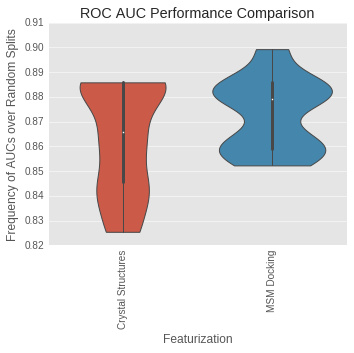

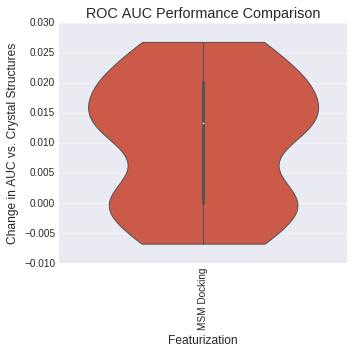

analyzing Recall:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.974790          0.000000   
MSM Docking           0.991597          0.016807   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.657789902424, 0.867366512455)  


ValueError: list.remove(x): x not in list

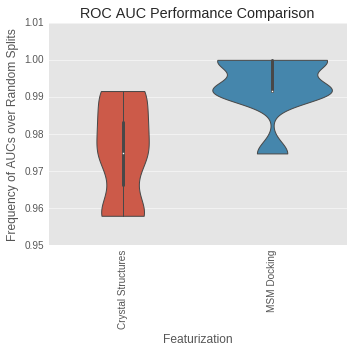

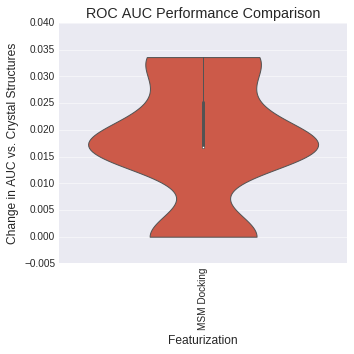

analyzing precision:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.871212               0.0   
MSM Docking           0.868613               0.0   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.32897683787, 0.577245230902)  


ValueError: list.remove(x): x not in list

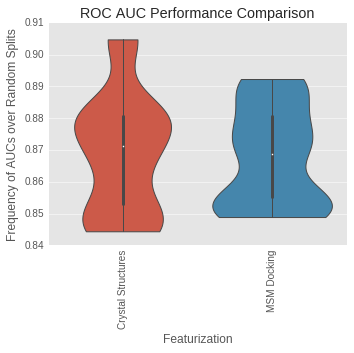

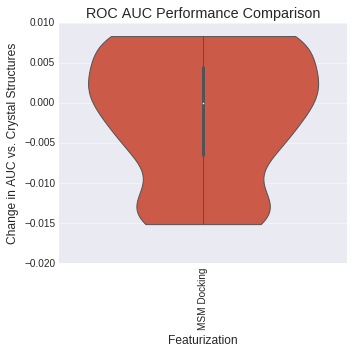

analyzing fdr:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.128788               0.0   
MSM Docking           0.131387               0.0   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.32897683787, 0.577245230902)  


ValueError: list.remove(x): x not in list

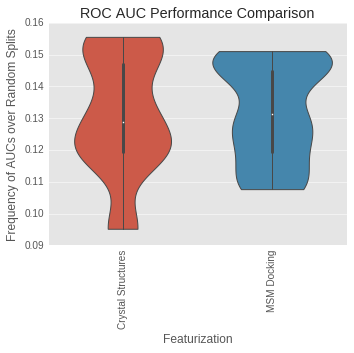

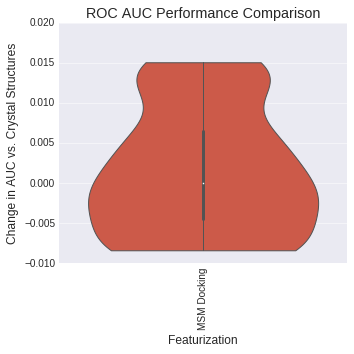

analyzing Recall:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.974790          0.000000   
MSM Docking           0.991597          0.016807   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.657789902424, 0.867366512455)  


ValueError: list.remove(x): x not in list

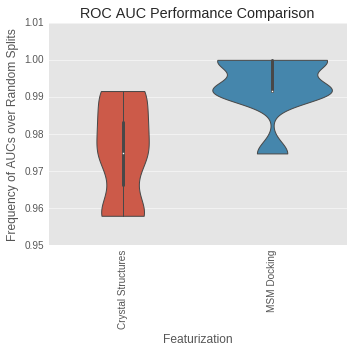

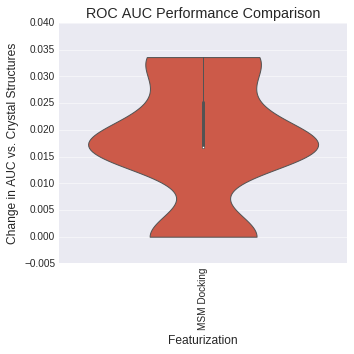

analyzing precision:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.871212               0.0   
MSM Docking           0.868613               0.0   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.32897683787, 0.577245230902)  


ValueError: list.remove(x): x not in list

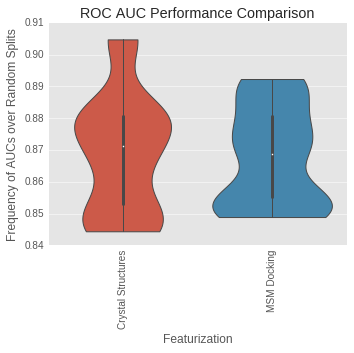

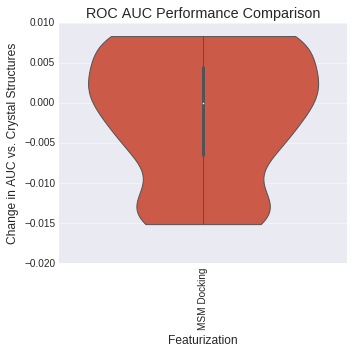

analyzing fdr:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.128788               0.0   
MSM Docking           0.131387               0.0   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.32897683787, 0.577245230902)  


ValueError: list.remove(x): x not in list

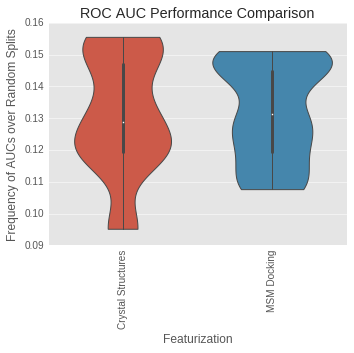

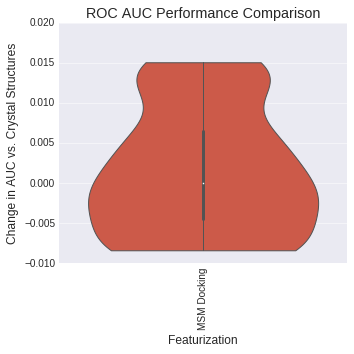

analyzing class B ROC AUC:
(100, 2)
                    Median AUC  Median delta AUC       Sign Test 99% CI
Crystal Structures    0.765966          0.000000               (0, 0.0)
MSM Docking           0.862605          0.078992  (0.937779312284, 1.0)


ValueError: list.remove(x): x not in list

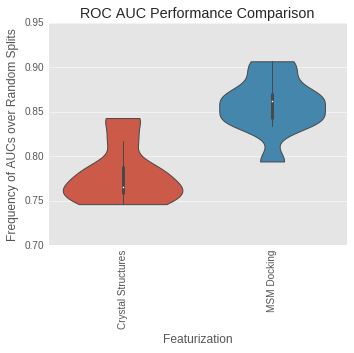

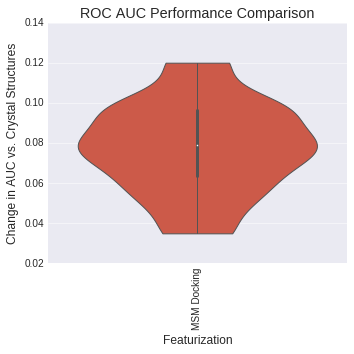

analyzing ROC AUC:
(100, 2)
                    Median AUC  Median delta AUC       Sign Test 99% CI
Crystal Structures    0.765966          0.000000               (0, 0.0)
MSM Docking           0.862605          0.078992  (0.937779312284, 1.0)


ValueError: list.remove(x): x not in list

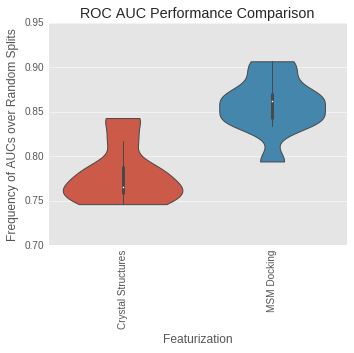

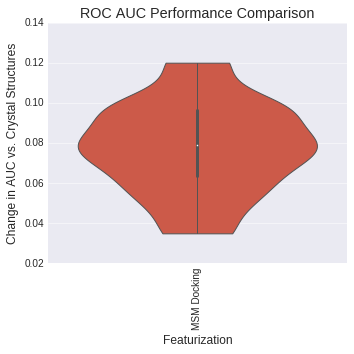

analyzing BedROC
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.987261          0.000000   
MSM Docking           0.997812          0.008705   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.771919554171, 0.940792723165)  


ValueError: list.remove(x): x not in list

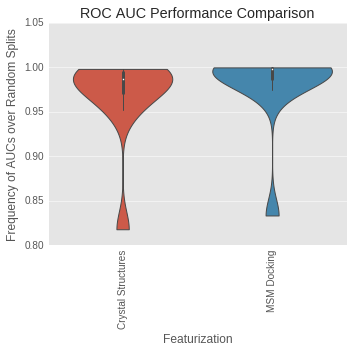

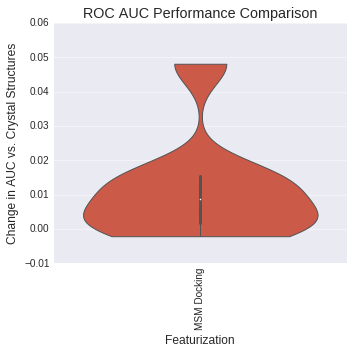

analyzing LogAUC
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.271256          0.000000   
MSM Docking           0.329261          0.054235   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.771919554171, 0.940792723165)  


ValueError: list.remove(x): x not in list

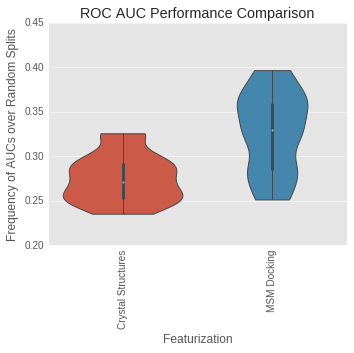

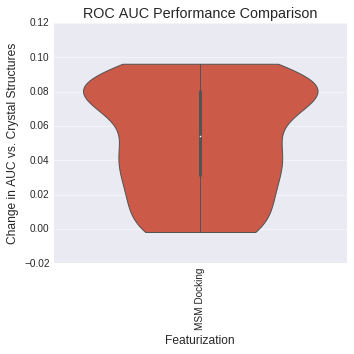

(5,)
(1, 5)


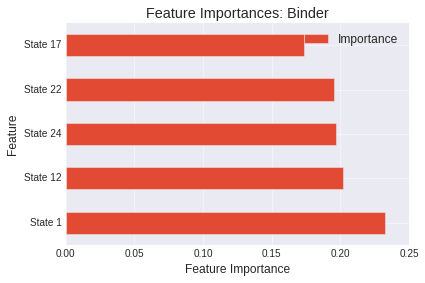

(27,)
(1, 27)


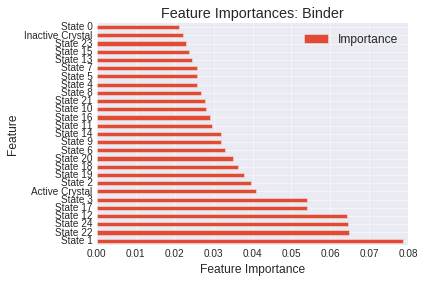

In [219]:
importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Non-Binder", "Binder"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([new_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False, fxn=np.median)

In [67]:
model = results_dict[save_name]['MSM Docking'][0]
y_proba =model.predict_proba(new_df.loc[[n for n in new_df.index if n not in model_agonists and n in full_ligand_df.index]].values)
test_df = pd.DataFrame(y_proba, index=[n for n in new_df.index if n not in model_agonists and n in full_ligand_df.index], columns=["Non-binder", "Binder"]).sort("Binder", ascending=False, inplace=False)

In [69]:
model = results_dict[save_name]['Crystal Structures'][0]
y_proba =model.predict_proba(C_df.loc[[n for n in new_df.index if n not in model_agonists and n in full_ligand_df.index]].values)
test_df = pd.DataFrame(y_proba, index=[n for n in new_df.index if n not in model_agonists and n in full_ligand_df.index], columns=["Non-binder", "Binder"]).sort("Binder", ascending=False, inplace=False)

In [55]:
model_agonists.index('cid_3345')

ValueError: 'cid_3345' is not in list

In [42]:
test_df.loc["cid_3345"]

Non-binder    0.07
Binder        0.93
Name: cid_3345, dtype: float64

In [44]:
test_df.loc["cid_3345"]

Non-binder    0.039
Binder        0.961
Name: cid_3345, dtype: float64

In [56]:
#msm
test_df.index.values.tolist().index('cid_3345')

237

In [59]:
#crystal
test_df.index.values.tolist().index('cid_3345')

441

In [68]:
#msm
test_df["label"] = full_ligand_df.loc[test_df.index.values.tolist()]["class"]
test_df

,Non-binder,Binder,label
chembl577749,0.000,1.000,1.0
chembl1161419,0.000,1.000,1.0
chembl2369407,0.000,1.000,0.0
chembl2171852,0.000,1.000,1.0
chembl575508,0.001,0.999,1.0
cid_44437656,0.001,0.999,1.0
chembl577746,0.001,0.999,1.0
cid_5311081,0.001,0.999,1.0
cid_6918276,0.001,0.999,0.0
chembl2375157,0.001,0.999,1.0


In [70]:
#xtal
test_df["label"] = full_ligand_df.loc[test_df.index.values.tolist()]["class"]
test_df

,Non-binder,Binder,label
chembl450818,0.000,1.000,1.0
chembl577748,0.000,1.000,1.0
cid_44426827,0.000,1.000,1.0
cid_44430040,0.000,1.000,1.0
cid_10116719,0.000,1.000,1.0
cid_6761,0.000,1.000,0.0
chembl2151735,0.000,1.000,1.0
chembl2171852,0.000,1.000,1.0
cid_44430045,0.000,1.000,1.0
chembl2369407,0.000,1.000,0.0


In [63]:
y_df.loc['chembl450818']

KeyError: 'the label [chembl450818] is not in the [index]'

In [281]:
#conc_ligand_df["action"] = [n.lower() for n in conc_ligand_df["action"].values.tolist()]
#ligand_df = copy.deepcopy(sk_ligand_df)
#ligand_df = full_ligand_df.loc[[n for n in full_ligand_df.index.values if str(full_ligand_df.loc[n]["Edits"]) in ["agonist", "antagonist"]]]
#ligand_df = ligand_df.loc[~(ligand_df["Edits"].str.contains("antagonist"))]

common_ligands = [n for n in full_ligand_df.drop_duplicates().index.values if n.lower().strip() in full_docking_df.index.values]
#other_ligands = [n for n in ligand_df.index.values if n.lower().strip() not in full_docking_df.index.values]
print(len(common_ligands))
#ligand_df = ligand_df.loc[common_ligands]
#docking_df = full_docking_df.loc[common_ligands]
classes = []

#vals = np.log10(ligand_df["AC Value (micromolar)"].values)
#for val in vals:
#    if val < 0.5:
##        classes.append("agonist")
#    else:
#        classes.append('antagonist')
#ligand_df["action"] = classes


322


In [282]:
full_ligand_df.drop_duplicates().shape

(2163, 10)

In [283]:
"""
from sklearn.preprocessing import binarize
ligand_df = copy.deepcopy(full_ligand_df)

classes = ligand_df["Edits"].values.tolist()
class_labels = []
indices = []
for i, label in enumerate(classes):
        if "antagonist" in label.lower():
                class_labels.append(0.)
                indices.append(i)
        elif "partial" in label.lower():
                class_labels.append(1.)
                indices.append(i)
        elif "agonist" in label.lower():
                class_labels.append(2.)
                indices.append(i)
ligand_df = ligand_df.iloc[indices]
ligand_df["label"] = class_labels

y = ligand_df["label"].values.reshape((-1,1))

X_df = full_docking_df
C_df = X_df[[n for n in X_df.columns.values.tolist() if "State" not in n]]
C_df["difference"] = C_df[C_df.columns[0]].subtract(C_df[C_df.columns[1]])
C_df[C_df.columns] = np.nan_to_num(C_df.values)
X_df["difference"] = C_df["difference"]
X_df[X_df.columns] = np.nan_to_num(X_df.values)


#C_df = standardize_df(C_df)
#X_df = standardize_df(X_df)

C = C_df.values
X = X_df.values

X_diff = np.zeros((X.shape[0], X.shape[1]**2/2))
k=0
for i in range(0,X.shape[1]):
        for j in range(i+1,X.shape[1]):
                X_diff[:,k] = X[:,i] - X[:,j]
                k+=1
X_diff = np.hstack([X, X_diff, C*-1.0])

features = [C, X]
feature_names = ["Crystal Structures", "MSM Docking"]

results_dict = {}
"""

'\nfrom sklearn.preprocessing import binarize\nligand_df = copy.deepcopy(full_ligand_df)\n\nclasses = ligand_df["Edits"].values.tolist()\nclass_labels = []\nindices = []\nfor i, label in enumerate(classes):\n        if "antagonist" in label.lower():\n                class_labels.append(0.)\n                indices.append(i)\n        elif "partial" in label.lower():\n                class_labels.append(1.)\n                indices.append(i)\n        elif "agonist" in label.lower():\n                class_labels.append(2.)\n                indices.append(i)\nligand_df = ligand_df.iloc[indices]\nligand_df["label"] = class_labels\n\ny = ligand_df["label"].values.reshape((-1,1))\n\nX_df = full_docking_df\nC_df = X_df[[n for n in X_df.columns.values.tolist() if "State" not in n]]\nC_df["difference"] = C_df[C_df.columns[0]].subtract(C_df[C_df.columns[1]])\nC_df[C_df.columns] = np.nan_to_num(C_df.values)\nX_df["difference"] = C_df["difference"]\nX_df[X_df.columns] = np.nan_to_num(X_df.values)\

In [284]:
"""
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *

results_dict = {}
n_trials = 300
train_test_split_prop = 0.75

model_type = "rfr"

save_name = "three_class_sk_%s_trials%d_split%s" %(model_type, n_trials, str(train_test_split_prop))
results_dict[save_name] = generate_or_load_model(features, y, feature_names,
                                                 n_trials, train_test_split_prop, False,
                                                 model_type, "%s/%s.pkl" %(analysis_dir, save_name),
                                                 redo=True, worker_pool=dview, n_estimators=1000, 
                                                 max_depth=None, criterion='gini',
                                                 normalize=True, normalize_axis0=True)


analyze_multiclass_experiment(results_dict[save_name], 
                                                            ["Crystal Structures", "MSM Docking"],
                                                            [[n for n in docking_df.columns if "State" not in n], docking_df.columns], common_ligands, analysis_dir,
                                                            ["Antagonists", "Partial Agonists", "Agonists"], X, 
                                                            exp_title="Ligand Class", coef_name=model_type)
                                                            """

'\nimport efficacy_scripts\nreload(efficacy_scripts)\nfrom efficacy_scripts import *\n\nresults_dict = {}\nn_trials = 300\ntrain_test_split_prop = 0.75\n\nmodel_type = "rfr"\n\nsave_name = "three_class_sk_%s_trials%d_split%s" %(model_type, n_trials, str(train_test_split_prop))\nresults_dict[save_name] = generate_or_load_model(features, y, feature_names,\n                                                 n_trials, train_test_split_prop, False,\n                                                 model_type, "%s/%s.pkl" %(analysis_dir, save_name),\n                                                 redo=True, worker_pool=dview, n_estimators=1000, \n                                                 max_depth=None, criterion=\'gini\',\n                                                 normalize=True, normalize_axis0=True)\n\n\nanalyze_multiclass_experiment(results_dict[save_name], \n                                                            ["Crystal Structures", "MSM Docking"],\n                

In [285]:
#regression_results = do_regression_experiment(features, np.log(ligand_df["MOR"].values), feature_names, 10, train_size=0.8, regularize=False, model="RidgeCV")
#

In [286]:
#analyze_regression_experiment(regression_results["test_r2s"], regression_results["feature_importances"], feature_names,
#                        X, np.log(ligand_df["MOR"].values), X_df, X_df.columns.values.tolist(), common_ligands, "hi", analysis_dir)

In [287]:
"""
model = results_dict[save_name]['MSM Docking'][0]
test_ligands = [n for n in full_docking_df.index.values.tolist()]# if n.lower() not in [m.lower() for m in X_df.index.values.tolist()]]
X_test_df = full_docking_df.loc[test_ligands]
C_test_df = full_docking_df.loc[test_ligands][[n for n in full_docking_df.columns.values.tolist() if "State" not in n]]
C_test_df["difference"] = C_test_df[C_test_df.columns[0]].subtract(C_test_df[C_test_df.columns[1]])
C_test_df[C_test_df.columns] = np.nan_to_num(C_test_df.values)
X_test_df["difference"] = C_test_df["difference"]
X_test_df[X_test_df.columns] = np.nan_to_num(X_test_df.values)
y_test = model.predict_proba(X_test_df.values)
y_test_df = pd.DataFrame(y_test, index=X_test_df.index, columns=["class A", "class B"]).sort("class B", ascending=False, inplace=False)
"""

'\nmodel = results_dict[save_name][\'MSM Docking\'][0]\ntest_ligands = [n for n in full_docking_df.index.values.tolist()]# if n.lower() not in [m.lower() for m in X_df.index.values.tolist()]]\nX_test_df = full_docking_df.loc[test_ligands]\nC_test_df = full_docking_df.loc[test_ligands][[n for n in full_docking_df.columns.values.tolist() if "State" not in n]]\nC_test_df["difference"] = C_test_df[C_test_df.columns[0]].subtract(C_test_df[C_test_df.columns[1]])\nC_test_df[C_test_df.columns] = np.nan_to_num(C_test_df.values)\nX_test_df["difference"] = C_test_df["difference"]\nX_test_df[X_test_df.columns] = np.nan_to_num(X_test_df.values)\ny_test = model.predict_proba(X_test_df.values)\ny_test_df = pd.DataFrame(y_test, index=X_test_df.index, columns=["class A", "class B"]).sort("class B", ascending=False, inplace=False)\n'

In [288]:
#grandisine_df = y_test_df.loc[[n for n in y_test_df.index.values if "4-" in n]]
#grandisine_df.to_csv("%s/grandisine_predictions_%s.csv" %(analysis_dir, save_name))
#grandisine_df

In [72]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *

X_df = full_docking_df
X_df = add_difference_columns(X_df)
#X_df["difference"] = X_df["Active Crystal"].subtract(X_df["Inactive Crystal"]).dropna()
C_df = X_df[[n for n in X_df.columns.values.tolist() if "State" not in n]]

ligand_df = copy.deepcopy(full_ligand_df[[c for c in full_ligand_df.columns.values if "fp" not in c.lower()]]).drop_duplicates(subset=['name'], keep='first')
ligand_df = ligand_df.loc[[n for n in ligand_df.index.values if n in full_docking_df.index.values]]
ligand_df.index = [n.lower() for n in ligand_df.index.values]
mols = [pybel.readstring("smi", x) for x in ligand_df.smiles]
fps = [x.calcfp(fptype='FP4') for x in mols] # Calculate their fingerprints
ligand_df["fp"] = fps


classes = ligand_df["action"].values.tolist()
class_labels = []
indices = []
n_antagonists = 0
n_agonists = 0
for i, label in enumerate(classes):
        if "antagonist" == label.lower():# or "neutral" in label.lower() or "negative" in label.lower():
                class_labels.append(0.)
                indices.append(i)
                n_antagonists += 1
        elif "agonist" == label.lower():# or "positive" in label.lower():
                class_labels.append(1.)
                indices.append(i)
                n_agonists += 1

print("n_antagonists: %d" %n_antagonists)
print("n_agonists: %d" %n_agonists)

ligand_df = ligand_df.iloc[indices]
ligand_df["label"] = class_labels

mols = [pybel.readstring("smi", x) for x in ligand_df.smiles]
fps = [x.calcfp(fptype='FP4') for x in mols] # Calculate their fingerprints
ligand_df["fp"] = fps

similarity_matrix = np.zeros((len(mols), len(mols)))
remove_ligands = []
print("original ligands: %d" %ligand_df.shape[0])

for i in range(0, len(mols)):
    for j in range(i, len(mols)):
        if i == j:
            continue            
        similarity_matrix[i][j] = fps[i] | fps[j]
        if similarity_matrix[i][j] > 1.:
            remove_ligands.append(j)
            #continue

print(len(remove_ligands))
ligand_df = ligand_df.iloc[[i for i in range(0, len(mols)) if i not in remove_ligands]]

model_agonists = [n for n in ligand_df.index.values]

y = ligand_df["label"].values.reshape((-1,1))
y_df = pd.DataFrame(y, index=ligand_df.index)

n_trials = 0
train_test_split_prop = 0.9
model_type = "rfr"

normalize = False
normalize_axis0 = False
if normalize_axis0:
    double_features = 2
    X_df = normalize_per_ligand(X_df)

else: 
    double_features = 1
n_estimators = 1000

methadone_ligands = [n for n in model_agonists if "fent" in n]
print(methadone_ligands)
base_ligand = "fentanyl"
#methadone_ligands = [n for n in model_agonists if base_ligand in n.lower()]
print(methadone_ligands)
tanimoto_cutoff = 0.7
methadone_ligands = [n for n in model_agonists if n in methadone_ligands or (ligand_df.loc[n]["fp"] | ligand_df.loc[base_ligand]["fp"]) > tanimoto_cutoff]

methadone_agonists = [n for n in ligand_df.loc[ligand_df.label == 1.].index.values.tolist() if n in methadone_ligands]
antagonists = [n for n in ligand_df.loc[ligand_df.label == 0.].index.values.tolist() if n not in methadone_ligands and (ligand_df.loc[n]["fp"] | ligand_df.loc["methadone"]["fp"]) < (tanimoto_cutoff-.2)]
other_agonists = [n for n in ligand_df.loc[ligand_df.label == 1.].index.values.tolist() if n not in methadone_ligands and (ligand_df.loc[n]["fp"] | ligand_df.loc["methadone"]["fp"]) < (tanimoto_cutoff-.2)]

random.shuffle(antagonists)
model_agonists = other_agonists + antagonists[:int(len (antagonists)*3/4)]
y_df = y_df.loc[model_agonists]
y = y_df.values


features = [C_df.loc[model_agonists], X_df.loc[model_agonists]]#, all_features_df]#, all_features]
feature_names = ["Crystal Structures", "MSM Docking"]
print([f.shape for f in features])

#methadone_ligands = [n.lower().strip().replace(" ", "_") for n in ["18-Methoxycoronaridine", "7-Acetoxymitragynine", "7-Hydroxymitragynine", "Akuammidine","Akuammine", "Coronaridine", "Eseroline", "Hodgkinsine", "Ibogaine", "Mitragynine", "Mitragynine pseudoindoxyl", "Noribogaine", "Pericine", "Pseudoakuammigine"] if n.lower().strip().replace(" ", "_") in model_agonists]


c_log_aucs = []
c_aucs = []

m_log_aucs = []
m_aucs = []

import random

names = ligand_df.index.values.tolist()
antagonist_inds = [names.index(n) for n in antagonists]
non_methadone_agonist_inds = [names.index(n) for n in other_agonists]
methadone_inds = [names.index(n) for n in methadone_agonists]

splitter = CustomSplitter(antagonist_inds,
                          non_methadone_agonist_inds,
                          methadone_inds)

"""
    random.shuffle(antagonists)
    random.shuffle(other_agonists)

    test_ligands = [n for n in ligand_df.index.values.tolist() if n not in non_methadone_ligands or n in antagonists[:5]]
    train_ligands = [n for n in ligand_df.index.values.tolist() if n not in test_ligands]

    X_train = X_df.loc[train_ligands].values
    C_train = C_df.loc[train_ligands].values
    y_train = ligand_df.loc[train_ligands].label.values.reshape((-1,1))

    X_test = X_df.loc[test_ligands].values
    C_test = C_df.loc[test_ligands].values
    y_test = ligand_df.loc[test_ligands].label.values.reshape((-1,1))

    features = [C_train, X_train]
"""

n_trials = 0
save_name = "two_class_nomethadone_%s_trials%d_tanimoto%s" %(model_type, n_trials, str(tanimoto_cutoff))
results_dict[save_name] = generate_or_load_model([f.values for f in features], y, feature_names, n_trials, train_test_split_prop, False, model_type, 
                                                 "%s/%s.pkl" %(analysis_dir, save_name),redo=True, worker_pool=None,
                                                 parallel=True, n_estimators=n_estimators, max_depth=None, criterion='gini',
                                                 normalize=False, splitter=splitter, normalize_axis0=False)




0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
n_antagonists: 48
n_agonists: 212
original ligands: 260
0
['acetylfentanyl', 'acrylfentanyl', 'alfentanil', '3-allylfentanyl', 'alphamethylthiofentanyl', 'betahydroxyfentanyl', 'betahydroxythiofentanyl', 'brifentanil', 'butyrfentanyl', 'carfentanil', 'fentanyl', '4-fluorobutyrfentanyl', 'furanylfentanyl', '4-methoxybutyrfentanyl', 'alpha-methylacetylfentanyl', '3-methylbutyrfentanyl', 'n-methylcarfentanil', '3-methylfentanyl', 'alpha-methylfentanyl', 'beta-methylfentanyl', '3-methylthiofentanyl', 'mirfentanil', 'ocfentanil', 'ohmefentanyl', 'parafluorofentanyl', '4-phenylfentanyl', 'remifentanil', 'sufentanil', 'thiofentanyl']
['acetylfentanyl', 'acrylfentanyl', 'alfentanil', '3-allylfentanyl', 'alphamethylthiofentanyl', 'betahydroxyfentanyl', 'betahydroxythiofentanyl', 'brifentanil', 'butyrfentanyl', 'carfentanil', 'fentanyl', '4-fluorobutyrfentanyl', 'furanylfentanyl', '4-methoxybutyrfentanyl', 'alpha-methylacetyl

In [138]:
len(methadone_ligands)

42

In [378]:
results_dict[save_name]["MSM Docking"][0].predict_proba(new_df.loc[test_ligands])

array([[ 0.062,  0.938],
       [ 0.178,  0.822],
       [ 0.054,  0.946],
       [ 0.207,  0.793],
       [ 0.018,  0.982],
       [ 0.111,  0.889],
       [ 0.078,  0.922],
       [ 0.124,  0.876],
       [ 0.114,  0.886],
       [ 0.052,  0.948],
       [ 0.057,  0.943],
       [ 0.099,  0.901],
       [ 0.065,  0.935],
       [ 0.052,  0.948],
       [ 0.032,  0.968],
       [ 0.072,  0.928],
       [ 0.061,  0.939],
       [ 0.135,  0.865],
       [ 0.279,  0.721],
       [ 0.049,  0.951],
       [ 0.224,  0.776],
       [ 0.295,  0.705],
       [ 0.236,  0.764],
       [ 0.51 ,  0.49 ],
       [ 0.228,  0.772],
       [ 0.36 ,  0.64 ],
       [ 0.208,  0.792],
       [ 0.124,  0.876],
       [ 0.201,  0.799],
       [ 0.307,  0.693],
       [ 0.266,  0.734],
       [ 0.181,  0.819],
       [ 0.211,  0.789],
       [ 0.314,  0.686],
       [ 0.377,  0.623],
       [ 0.345,  0.655],
       [ 0.323,  0.677],
       [ 0.115,  0.885],
       [ 0.202,  0.798]])

In [379]:
ligand_df.loc[test_ligands]["label"].values.reshape((-1,1))

array([[ 1.],
       [ 1.],
       [ 1.],
       [ 1.],
       [ 1.],
       [ 1.],
       [ 1.],
       [ 1.],
       [ 1.],
       [ 1.],
       [ 1.],
       [ 1.],
       [ 1.],
       [ 1.],
       [ 1.],
       [ 1.],
       [ 1.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.]])

In [404]:
full_ligand_df.columns

Index(['Edits', 'Unnamed: 0', 'Unnamed: 4', 'Unnamed: 5', 'Unnamed: 7',
       'action', 'ligand', 'name', 'smiles', 'fp'],
      dtype='object')

In [149]:
sorted(model_agonists)

['1-iodomorphine',
 '14-cinnamoyloxycodeinone',
 '14-hydroxydihydrocodeine',
 '6-methylenedihydrodesoxymorphine',
 '6-monoacetylmorphine',
 '6beta-naltrexol-d4',
 '7-hydroxymitragynine',
 '7-pet',
 '8-carboxamidocyclazocine',
 'acetorphine',
 'acetylpropionylmorphine',
 'ah-7921',
 'akuammine',
 'alimadol',
 'at-076',
 'axelopran',
 'azidomorphine',
 'bdpc',
 'benzhydrocodone',
 'benzylmorphine',
 'beta-chlornaltrexamine',
 'beta-funaltrexamine',
 'bevenopran',
 'bezitramide',
 'bromadoline',
 'buprenorphine',
 'bw373u86',
 'c-8813',
 'catechin',
 'cebranopadol',
 'chloromorphide',
 'chloroxymorphamine',
 'ciprefadol',
 'ciramadol',
 'clocinnamox',
 'clonitazene',
 'codeine-6-glucuronide',
 'codeinone',
 'codoxime',
 'dadle',
 'damgo',
 'dermorphin',
 'desmethylclozapine',
 'desomorphine',
 'dextromoramide',
 'diacetylnalorphine',
 'dibenzoylmorphine',
 'diethylthiambutene',
 'dihydrocodeine',
 'dihydroetorphine',
 'dihydromorphine',
 'dimenoxadol',
 'dimethylthiambutene',
 'dinicotina

In [2]:
test_ligands

NameError: name 'test_ligands' is not defined

In [78]:
test_ligands = methadone_agonists+antagonists[int(len(antagonists)*3/4):]
test_df = pd.DataFrame(results_dict[save_name]["MSM Docking"][0].predict_proba(X_df), index=X_df.index, columns=["antagonist", "agonist"])
test_df["class"] = ligand_df.loc[test_ligands]["label"]
print(roc_auc_score(ligand_df.loc[test_ligands]["label"].values.reshape((-1,1)), test_df.loc[test_ligands].values[:,1]))
test_df.loc[[n for n in test_df.index if n in test_ligands]].sort("antagonist", ascending=False, inplace=False)

0.940476190476


,antagonist,agonist,class
samidorphan,0.594,0.406,0.0
cyclofoxy,0.567,0.433,0.0
naloxegol,0.549,0.451,0.0
am-251,0.496,0.504,0.0
epicatechin,0.379,0.621,0.0
noribogaine,0.369,0.631,0.0
naringenin,0.352,0.648,0.0
3-methylthiofentanyl,0.323,0.677,1.0
mirfentanil,0.293,0.707,1.0
brifentanil,0.268,0.732,1.0


In [79]:
test_ligands = methadone_agonists+antagonists[int(len(antagonists)*3/4):]
test_df = pd.DataFrame(results_dict[save_name]["Crystal Structures"][0].predict_proba(C_df), index=X_df.index, columns=["antagonist", "agonist"])
test_df["class"] = ligand_df.loc[test_ligands]["label"]
print(roc_auc_score(ligand_df.loc[test_ligands]["label"].values.reshape((-1,1)), test_df.loc[test_ligands].values[:,1]))
test_df.loc[[n for n in test_df.index if n in test_ligands]].sort("antagonist", ascending=False, inplace=False)

0.688311688312


,antagonist,agonist,class
cyclofoxy,0.926,0.074,0.0
naringenin,0.887,0.113,0.0
naloxegol,0.775,0.225,0.0
samidorphan,0.753,0.247,0.0
3-methylthiofentanyl,0.688,0.312,1.0
phenampromide,0.635,0.365,1.0
proheptazine,0.476,0.524,1.0
brifentanil,0.460,0.540,1.0
epicatechin,0.387,0.613,0.0
alpha-methylacetylfentanyl,0.365,0.635,1.0


In [410]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *

X_df = full_docking_df
#X_df["difference"] = X_df["Active Crystal"].subtract(X_df["Inactive Crystal"]).dropna()
C_df = X_df[[n for n in X_df.columns.values.tolist() if "State" not in n]]

ligand_df = copy.deepcopy(full_ligand_df[[c for c in full_ligand_df.columns.values if "fp" not in c.lower()]]).drop_duplicates(subset=['name'], keep='first')
ligand_df = ligand_df.loc[[n for n in ligand_df.index.values if n in full_docking_df.index.values]]
ligand_df.index = [n.lower() for n in ligand_df.index.values]

mols = [pybel.readstring("smi", x) for x in ligand_df.smiles]
fps = [x.calcfp(fptype='FP4') for x in mols] # Calculate their fingerprints
ligand_df["fp"] = fps

classes = ligand_df["action"].values.tolist()
class_labels = []
indices = []
n_antagonists = 0
n_agonists = 0
for i, label in enumerate(classes):
        if "antagonist" == label.lower():# or "neutral" in label.lower() or "negative" in label.lower():
                class_labels.append(0.)
                indices.append(i)
                n_antagonists += 1
        elif "agonist" == label.lower():# or "positive" in label.lower():
                class_labels.append(1.)
                indices.append(i)
                n_agonists += 1

print("n_antagonists: %d" %n_antagonists)
print("n_agonists: %d" %n_agonists)

ligand_df = ligand_df.iloc[indices]
ligand_df["label"] = class_labels

model_agonists = [n for n in ligand_df.index.values]

y = ligand_df["label"].values.reshape((-1,1))
y_df = pd.DataFrame(y, index=ligand_df.index)

n_trials = 100
train_test_split_prop = 0.9
model_type = "rfr"

normalize = False
normalize_axis0 = True
if normalize_axis0:
    double_features = 2
    X_df = normalize_per_ligand(X_df)

else: 
    double_features = 1
n_estimators = 1000

features = [C_df.loc[model_agonists], X_df.loc[model_agonists]]#, all_features_df]#, all_features]
feature_names = ["Crystal Structures", "MSM Docking"]
print([f.shape for f in features])

#methadone_ligands = [n.lower().strip().replace(" ", "_") for n in ["18-Methoxycoronaridine", "7-Acetoxymitragynine", "7-Hydroxymitragynine", "Akuammidine","Akuammine", "Coronaridine", "Eseroline", "Hodgkinsine", "Ibogaine", "Mitragynine", "Mitragynine pseudoindoxyl", "Noribogaine", "Pericine", "Pseudoakuammigine"] if n.lower().strip().replace(" ", "_") in model_agonists]
methadone_ligands = [n for n in model_agonists if "methad" in n]
print(methadone_ligands)
base_ligand = "methadone"
#methadone_ligands = [n for n in model_agonists if base_ligand in n.lower()]
print(methadone_ligands)
tanimoto_cutoff = 0.7
methadone_ligands = [n for n in model_agonists if n in methadone_ligands or (ligand_df.loc[n]["fp"] | ligand_df.loc[base_ligand]["fp"]) > tanimoto_cutoff]

methadone_agonists = [n for n in ligand_df.loc[ligand_df.label == 1.].index.values.tolist() if n in methadone_ligands]
antagonists = [n for n in ligand_df.loc[ligand_df.label == 0.].index.values.tolist() if n not in methadone_ligands and (ligand_df.loc[n]["fp"] | ligand_df.loc["methadone"]["fp"]) < (tanimoto_cutoff-.2)]
other_agonists = [n for n in ligand_df.loc[ligand_df.label == 1.].index.values.tolist() if n not in methadone_ligands and (ligand_df.loc[n]["fp"] | ligand_df.loc["methadone"]["fp"]) < (tanimoto_cutoff-.2)]


c_log_aucs = []
c_aucs = []

m_log_aucs = []
m_aucs = []

import random

names = ligand_df.index.values.tolist()
antagonist_inds = [names.index(n) for n in antagonists]
non_methadone_agonist_inds = [names.index(n) for n in other_agonists]
methadone_inds = [names.index(n) for n in methadone_agonists]

splitter = CustomSplitter(antagonist_inds,
                          non_methadone_agonist_inds,
                          methadone_inds)

"""
    random.shuffle(antagonists)
    random.shuffle(other_agonists)

    test_ligands = [n for n in ligand_df.index.values.tolist() if n not in non_methadone_ligands or n in antagonists[:5]]
    train_ligands = [n for n in ligand_df.index.values.tolist() if n not in test_ligands]

    X_train = X_df.loc[train_ligands].values
    C_train = C_df.loc[train_ligands].values
    y_train = ligand_df.loc[train_ligands].label.values.reshape((-1,1))

    X_test = X_df.loc[test_ligands].values
    C_test = C_df.loc[test_ligands].values
    y_test = ligand_df.loc[test_ligands].label.values.reshape((-1,1))

    features = [C_train, X_train]
"""

save_name = "two_class_nomethadone_%s_trials%d_tanimoto%s" %(model_type, n_trials, str(tanimoto_cutoff))
results_dict[save_name] = generate_or_load_model([f.values for f in features], y, feature_names, n_trials, train_test_split_prop, False, model_type, 
                                                 "%s/%s.pkl" %(analysis_dir, save_name),redo=False, worker_pool=dview,
                                                 parallel=False, n_estimators=1000, max_depth=None, criterion='gini',
                                                 normalize=False, splitter=splitter, normalize_axis0=False)



n_antagonists: 48
n_agonists: 212
[(260, 3), (260, 55)]
['alphacetylmethadol', 'alphamethadol', 'betacetylmethadol', 'betamethadol', 'isomethadone', 'levacetylmethadol', 'levomethadone', 'methadone', 'noracymethadol', 'normethadone']
['alphacetylmethadol', 'alphamethadol', 'betacetylmethadol', 'betamethadol', 'isomethadone', 'levacetylmethadol', 'levomethadone', 'methadone', 'noracymethadol', 'normethadone']
Already fit model, loading now.


In [155]:
print(len(methadone_agonists))
print(len(antagonists))
print(len(other_agonists))

17
45
119


In [58]:
set(methadone_agonists).intersection(set(other_agonists))

set()

In [412]:
X_df.columns

Index(['Inactive Crystal', 'Active Crystal', 'State 0', 'State 10', 'State 11',
       'State 12', 'State 13', 'State 14', 'State 15', 'State 16', 'State 17',
       'State 18', 'State 19', 'State 1', 'State 20', 'State 21', 'State 22',
       'State 23', 'State 24', 'State 2', 'State 3', 'State 4', 'State 5',
       'State 6', 'State 7', 'State 8', 'State 9', 'difference',
       'Inactive Crystal', 'Active Crystal', 'State 0', 'State 10', 'State 11',
       'State 12', 'State 13', 'State 14', 'State 15', 'State 16', 'State 17',
       'State 18', 'State 19', 'State 1', 'State 20', 'State 21', 'State 22',
       'State 23', 'State 24', 'State 2', 'State 3', 'State 4', 'State 5',
       'State 6', 'State 7', 'State 8', 'State 9'],
      dtype='object')

analyzing precision at full recall:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.772727          0.000000   
MSM Docking           0.894737          0.155606   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.920198871465, 0.998824854573)  


ValueError: list.remove(x): x not in list

analyzing threshold at full recall:
(100, 2)
                    Median AUC  Median delta AUC       Sign Test 99% CI
Crystal Structures       0.327            0.0000               (0, 0.0)
MSM Docking              0.707            0.3755  (0.937779312284, 1.0)


ValueError: list.remove(x): x not in list

analyzing Accuracy:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.739130          0.000000   
MSM Docking           0.782609          0.043478   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.614639439838, 0.835494630058)  


ValueError: list.remove(x): x not in list

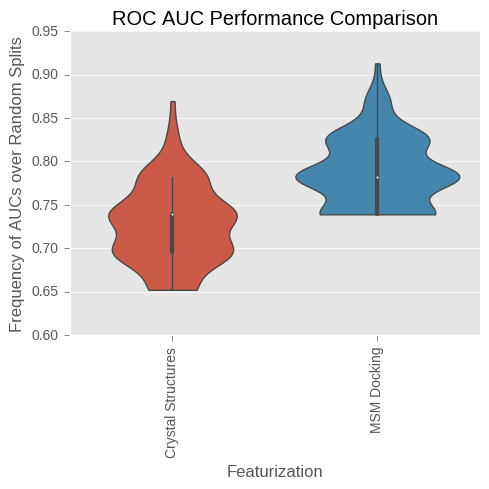

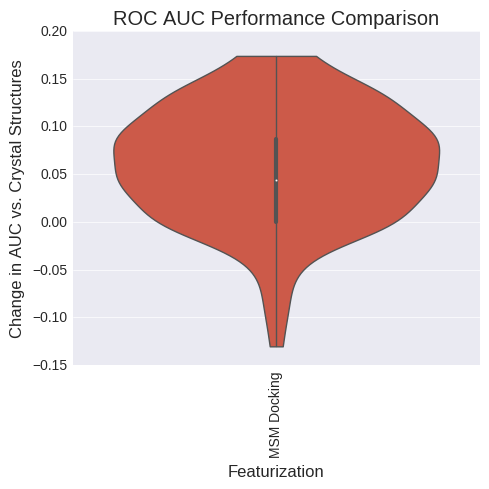

analyzing Recall:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.882353          0.000000   
MSM Docking           1.000000          0.117647   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.920198871465, 0.998824854573)  


ValueError: list.remove(x): x not in list

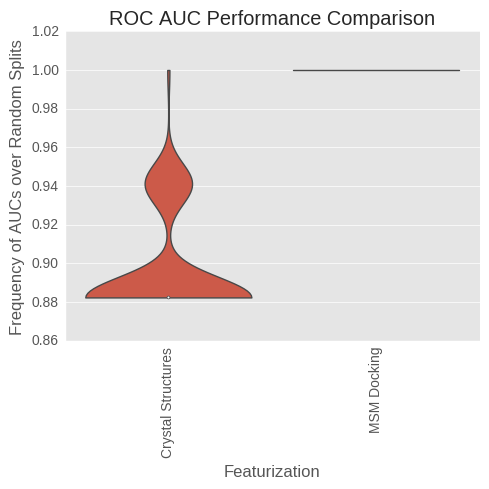

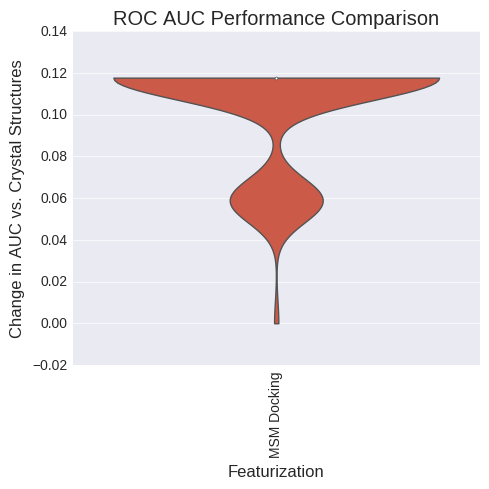

analyzing precision:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.761905          0.000000   
MSM Docking           0.772727          0.014262   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.422754769098, 0.67102316213)  


ValueError: list.remove(x): x not in list

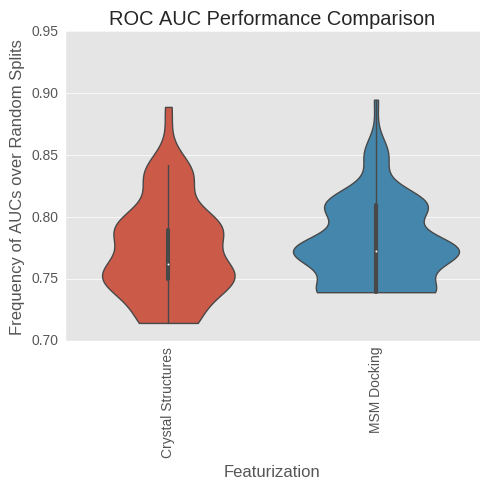

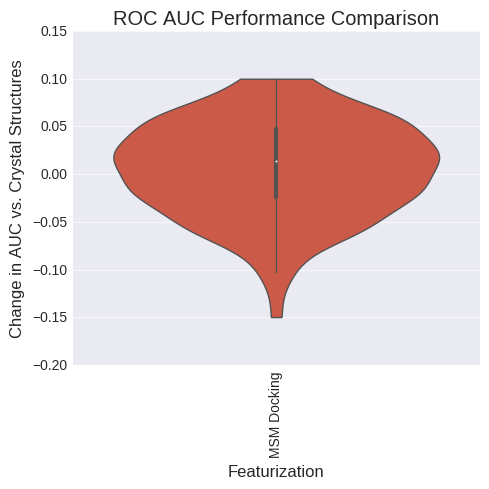

analyzing fdr:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.238095          0.000000   
MSM Docking           0.227273         -0.014262   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.32897683787, 0.577245230902)  


ValueError: list.remove(x): x not in list

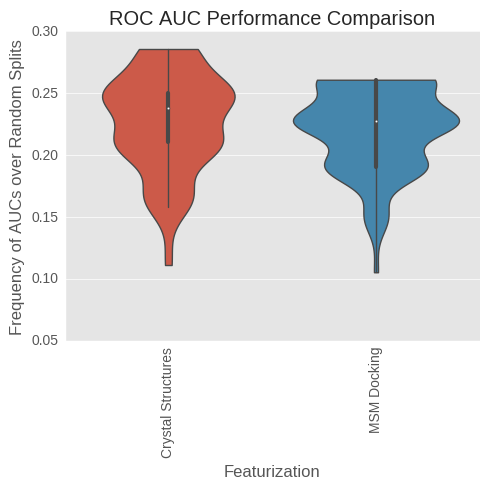

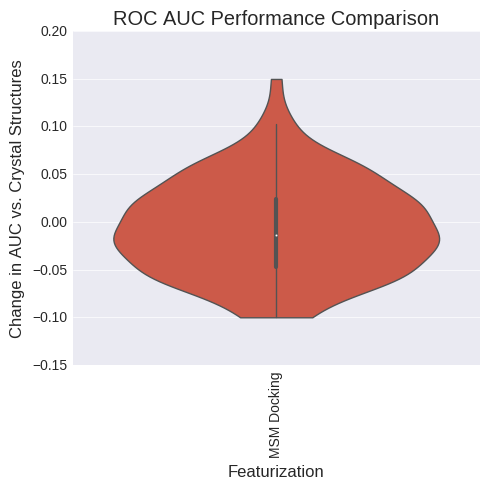

analyzing Recall:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.882353          0.000000   
MSM Docking           1.000000          0.117647   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.920198871465, 0.998824854573)  


ValueError: list.remove(x): x not in list

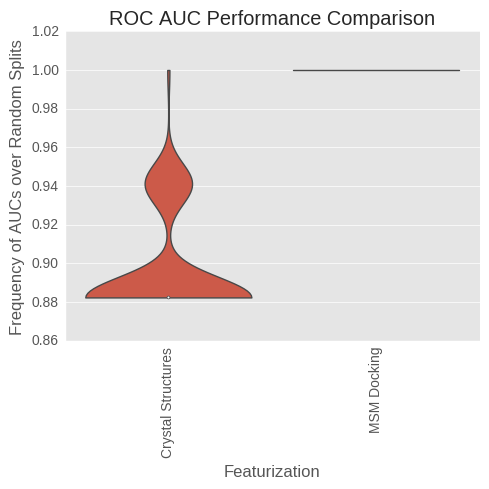

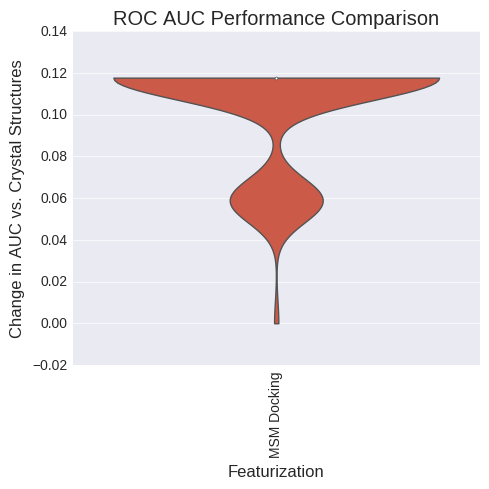

analyzing precision:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.761905          0.000000   
MSM Docking           0.772727          0.014262   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.422754769098, 0.67102316213)  


ValueError: list.remove(x): x not in list

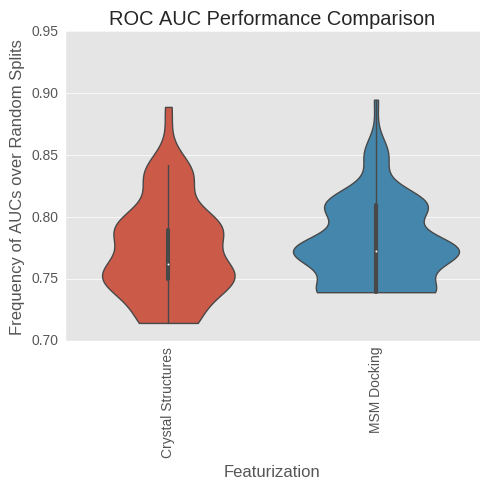

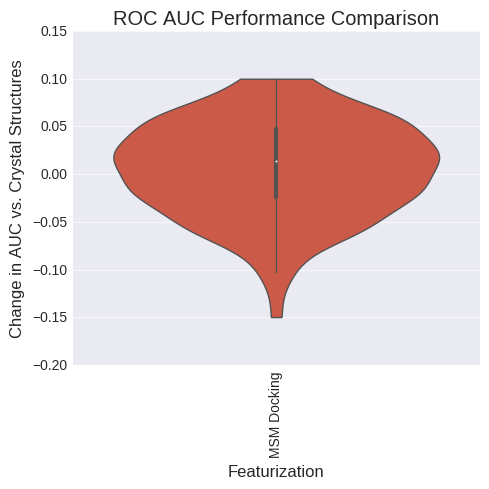

analyzing fdr:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.238095          0.000000   
MSM Docking           0.227273         -0.014262   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.32897683787, 0.577245230902)  


ValueError: list.remove(x): x not in list

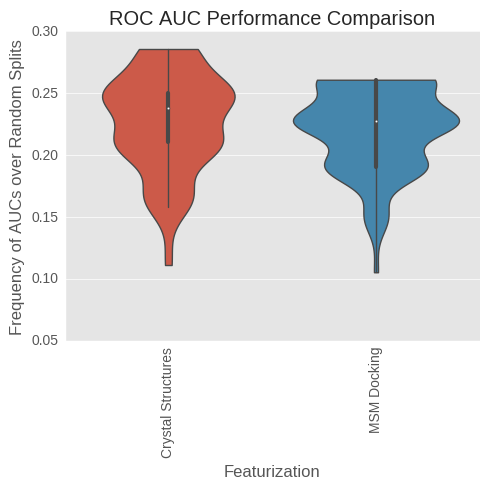

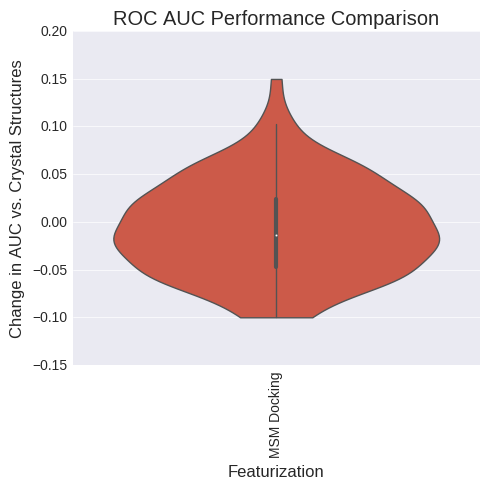

analyzing class B ROC AUC:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.779412          0.000000   
MSM Docking           0.906863          0.117647   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.771919554171, 0.940792723165)  


ValueError: list.remove(x): x not in list

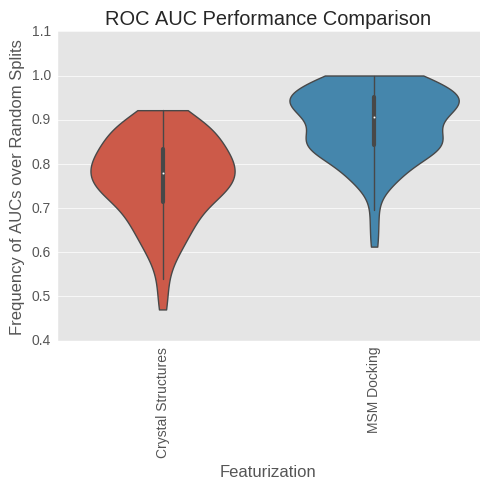

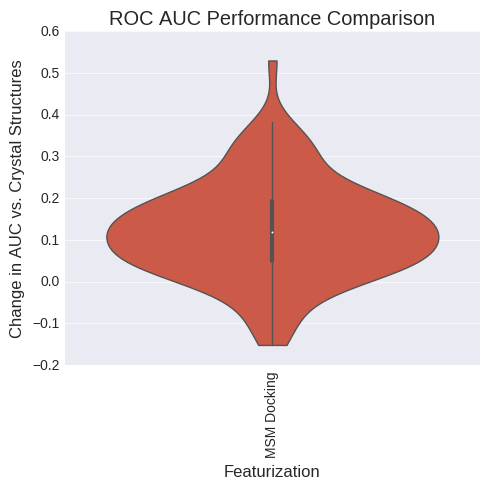

analyzing ROC AUC:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.779412          0.000000   
MSM Docking           0.906863          0.117647   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.771919554171, 0.940792723165)  


ValueError: list.remove(x): x not in list

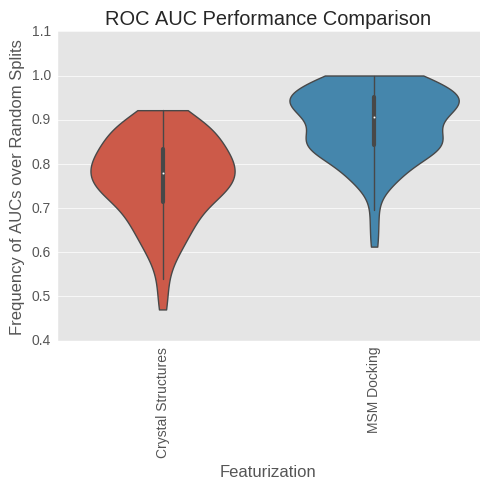

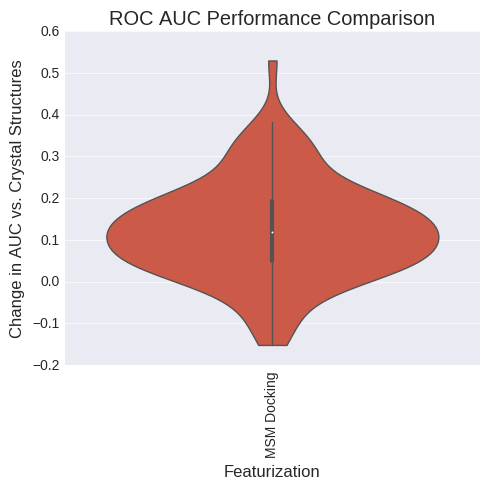

analyzing BedROC
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.998656          0.000000   
MSM Docking           0.999953          0.000608   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.551904359003, 0.785696193419)  


ValueError: list.remove(x): x not in list

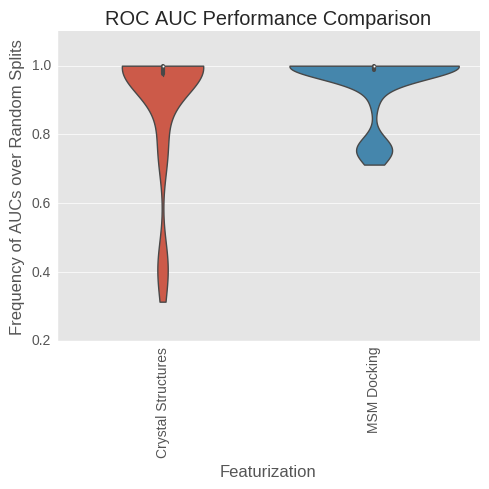

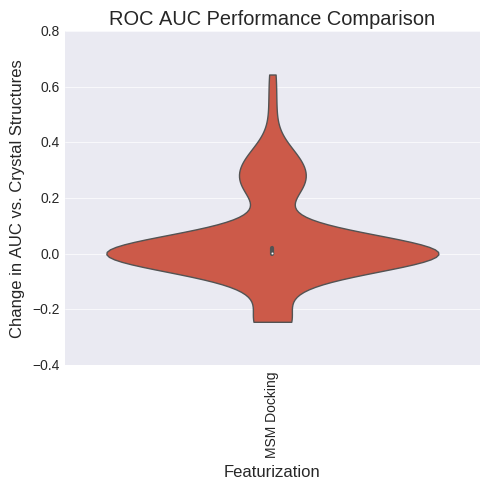

analyzing LogAUC
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.206584          0.000000   
MSM Docking           0.240924          0.028789   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.614639439838, 0.835494630058)  


ValueError: list.remove(x): x not in list

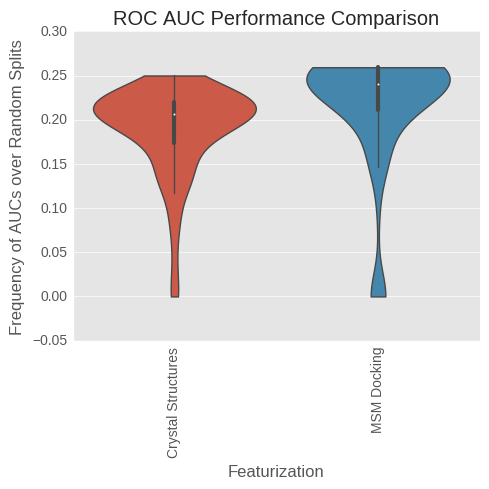

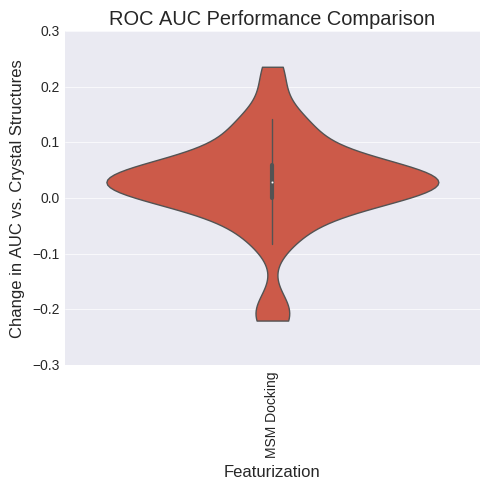

(3,)
(1, 3)


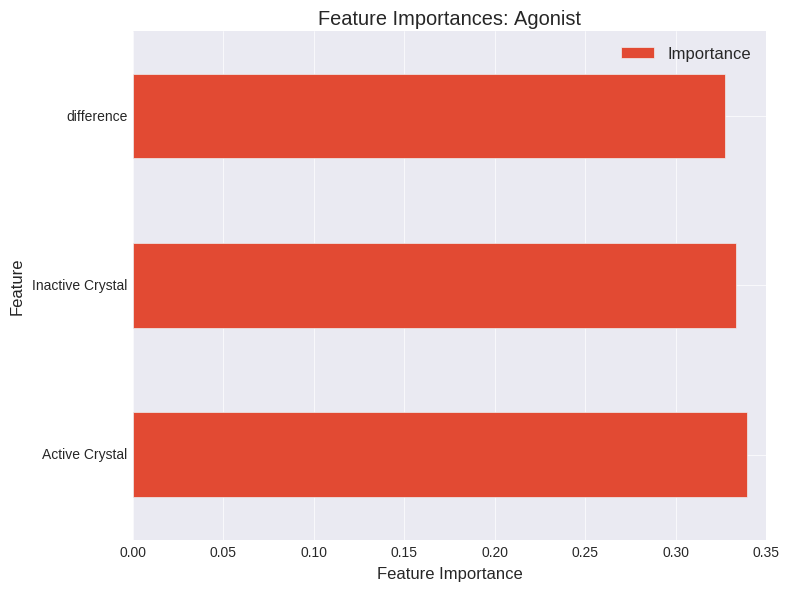

(55,)
(1, 55)


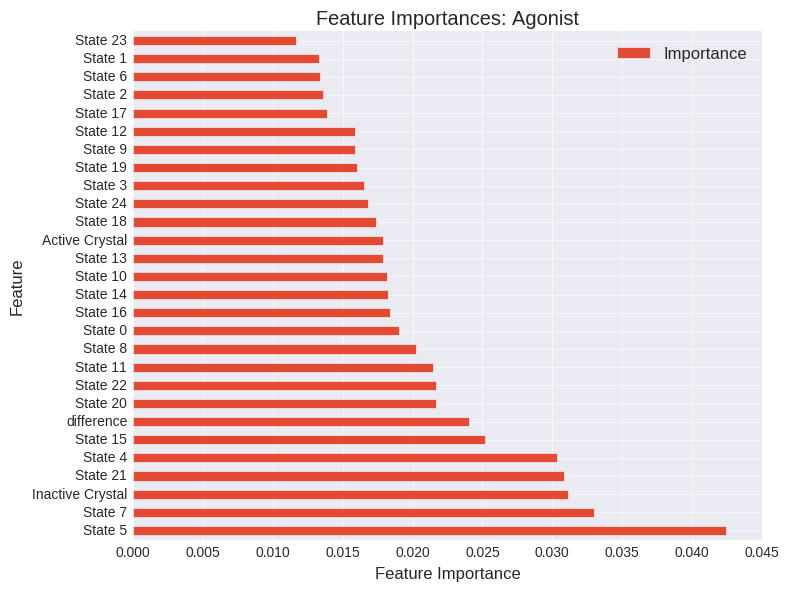

In [411]:
#Normalize False, axis0 True, RFR, methadone, 0.7, 0.5



importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Antagonist", "Agonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.iloc[indices].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False, fxn=np.median)

analyzing precision at full recall:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures     0.73913          0.000000   
MSM Docking            0.85000          0.070393   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.541656282852, 0.777188683324)  


ValueError: list.remove(x): x not in list

analyzing threshold at full recall:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.571851          0.000000   
MSM Docking           0.710315          0.110362   

                                  Sign Test 99% CI  
Crystal Structures                        (0, 0.0)  
MSM Docking         (0.6687668635, 0.875145137625)  


ValueError: list.remove(x): x not in list

analyzing Accuracy:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.739130          0.000000   
MSM Docking           0.782609          0.043478   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.403623710738, 0.652643047999)  


ValueError: list.remove(x): x not in list

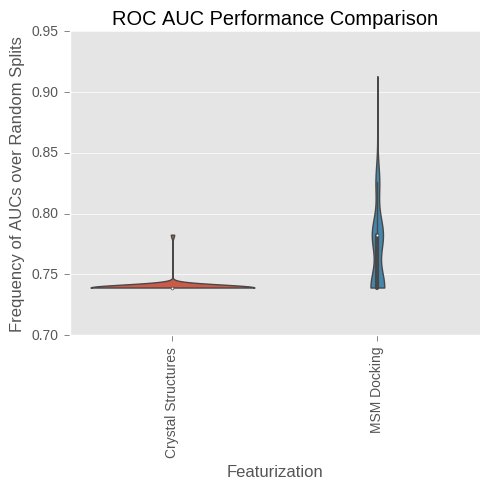

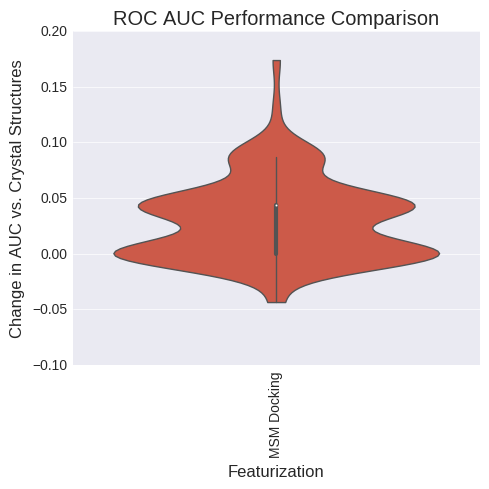

analyzing Recall:
(100, 2)
                    Median AUC  Median delta AUC        Sign Test 99% CI
Crystal Structures         1.0               0.0                (0, 0.0)
MSM Docking                1.0               0.0  (0.0, 0.0622206877158)


ValueError: list.remove(x): x not in list

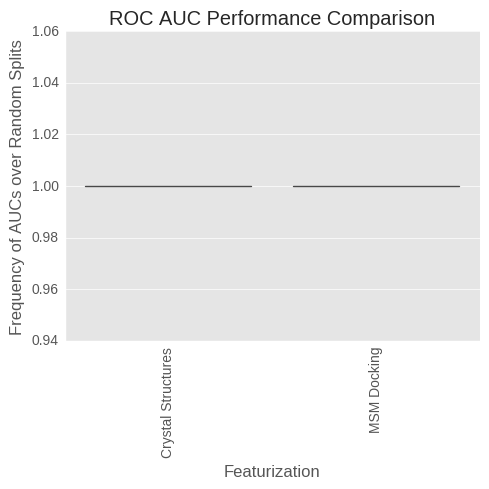

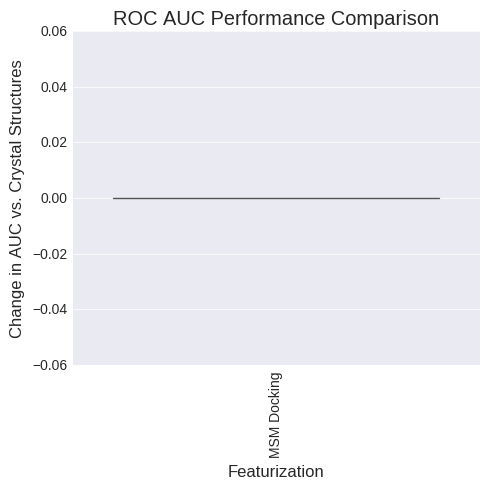

analyzing precision:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.739130          0.000000   
MSM Docking           0.772727          0.033597   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.403623710738, 0.652643047999)  


ValueError: list.remove(x): x not in list

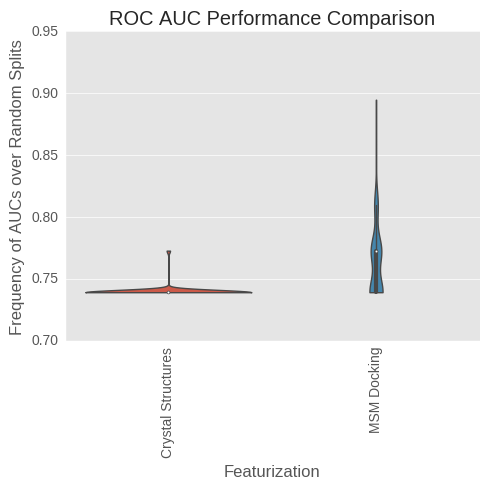

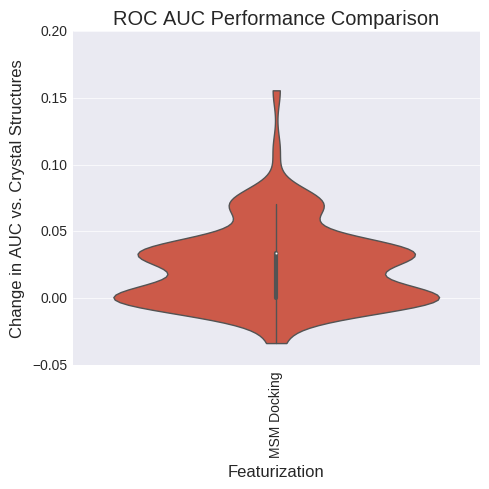

analyzing fdr:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.260870          0.000000   
MSM Docking           0.227273         -0.033597   

                                      Sign Test 99% CI  
Crystal Structures                            (0, 0.0)  
MSM Docking         (0.0039148772301, 0.0958169829771)  


ValueError: list.remove(x): x not in list

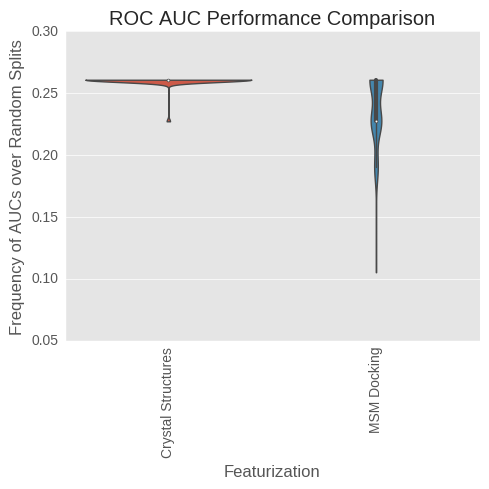

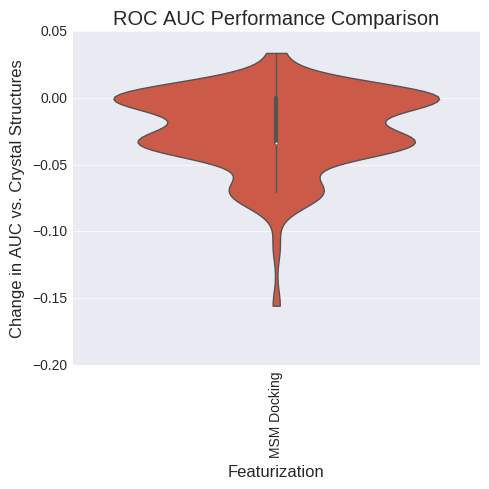

analyzing Recall:
(100, 2)
                    Median AUC  Median delta AUC        Sign Test 99% CI
Crystal Structures         1.0               0.0                (0, 0.0)
MSM Docking                1.0               0.0  (0.0, 0.0622206877158)


ValueError: list.remove(x): x not in list

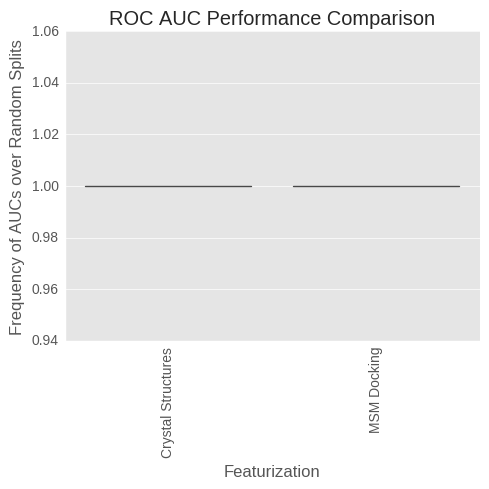

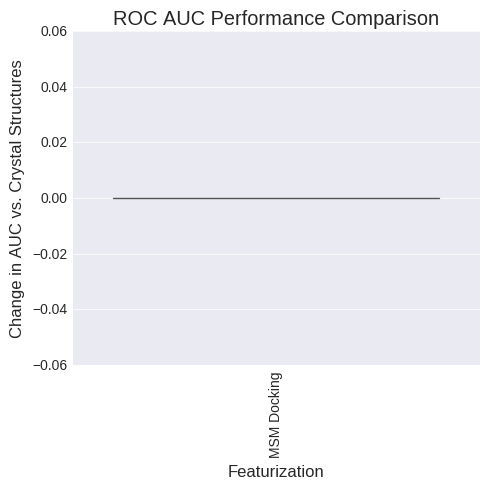

analyzing precision:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.739130          0.000000   
MSM Docking           0.772727          0.033597   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.403623710738, 0.652643047999)  


ValueError: list.remove(x): x not in list

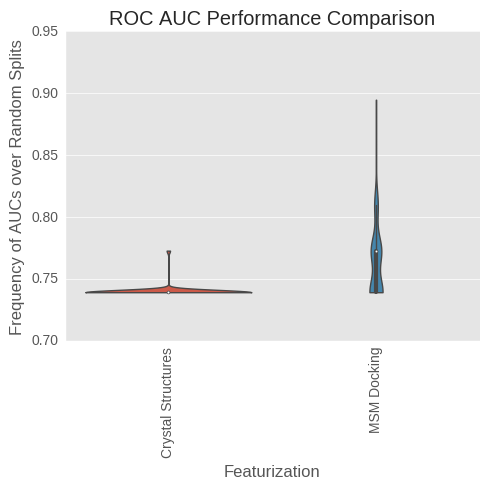

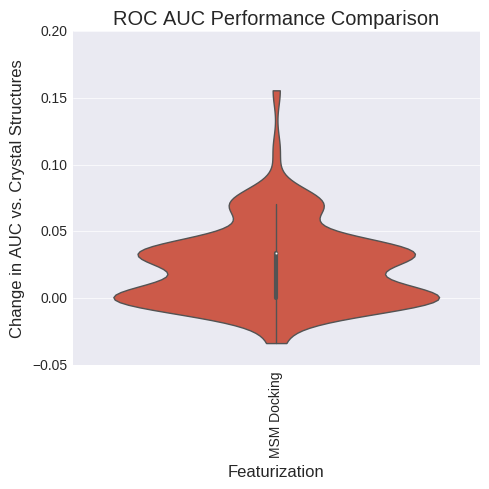

analyzing fdr:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.260870          0.000000   
MSM Docking           0.227273         -0.033597   

                                      Sign Test 99% CI  
Crystal Structures                            (0, 0.0)  
MSM Docking         (0.0039148772301, 0.0958169829771)  


ValueError: list.remove(x): x not in list

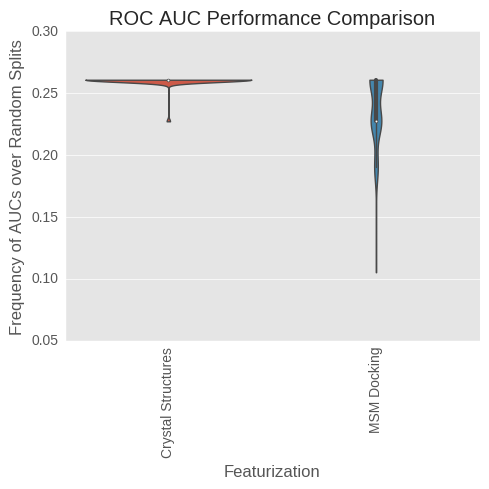

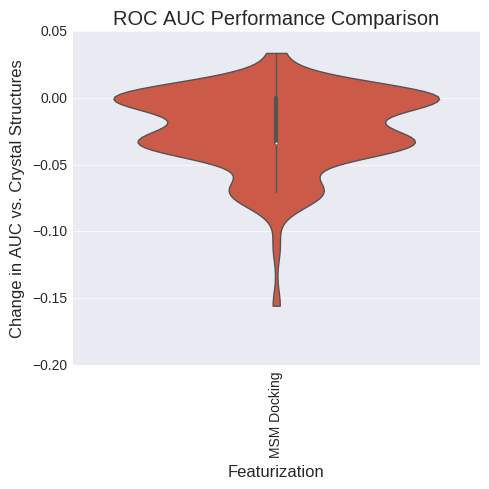

analyzing class B ROC AUC:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.127451          0.000000   
MSM Docking           0.843137          0.612745   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.748196379965, 0.92700472488)  


ValueError: list.remove(x): x not in list

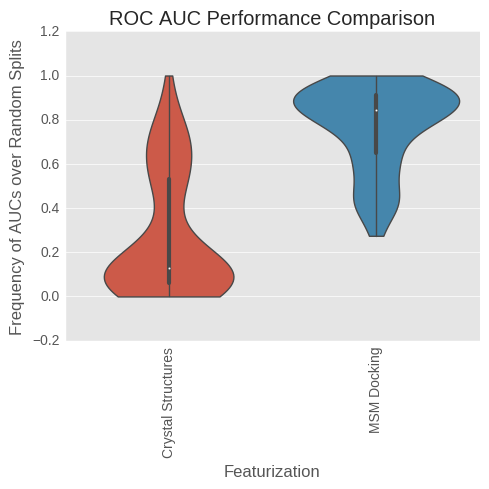

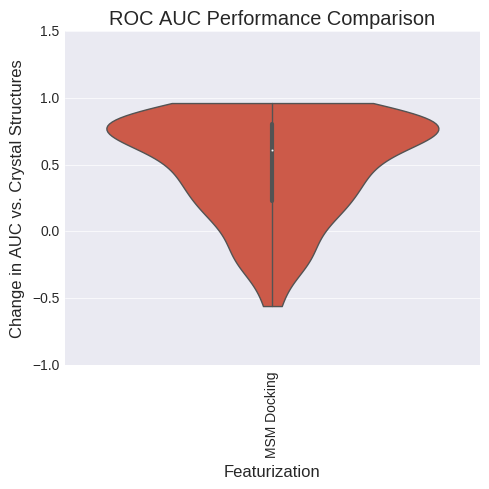

analyzing ROC AUC:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.127451          0.000000   
MSM Docking           0.843137          0.612745   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.748196379965, 0.92700472488)  


ValueError: list.remove(x): x not in list

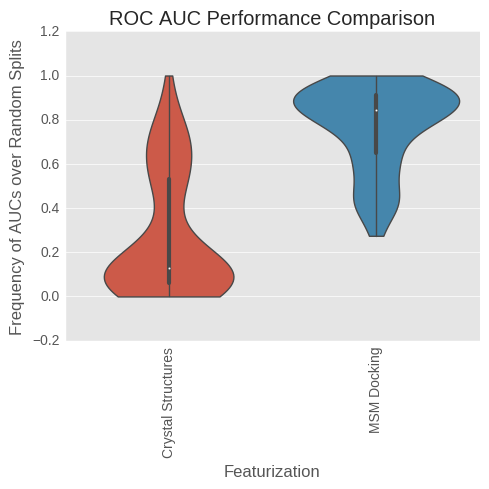

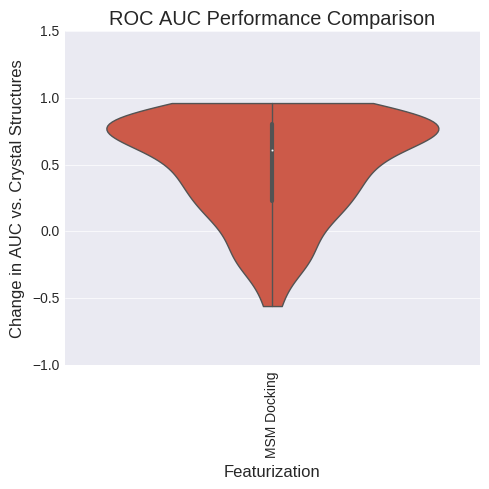

analyzing BedROC
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.047382          0.000000   
MSM Docking           0.996833          0.785998   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.808682796607, 0.960296239466)  


ValueError: list.remove(x): x not in list

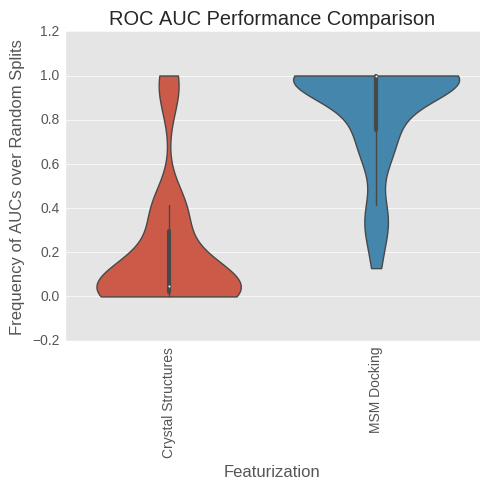

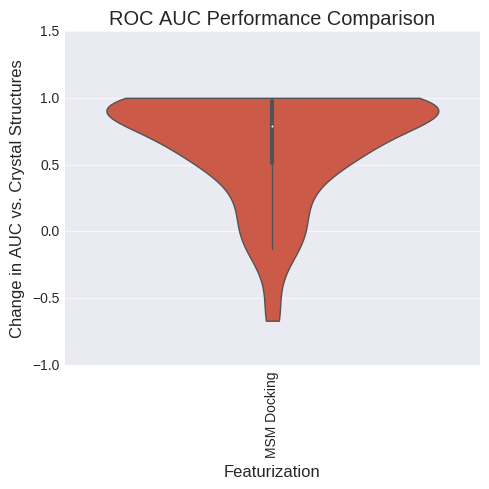

analyzing LogAUC
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.023368          0.000000   
MSM Docking           0.221741          0.139014   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.724983387855, 0.912706544499)  


ValueError: list.remove(x): x not in list

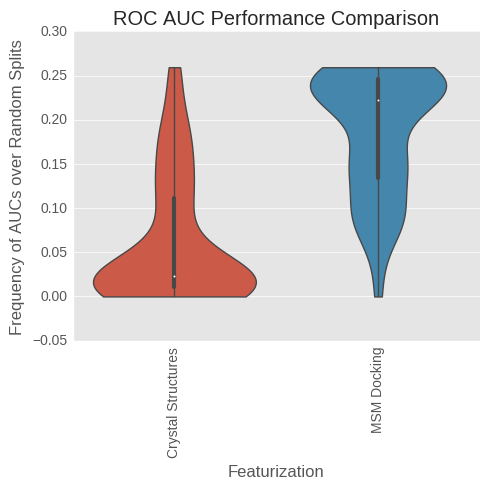

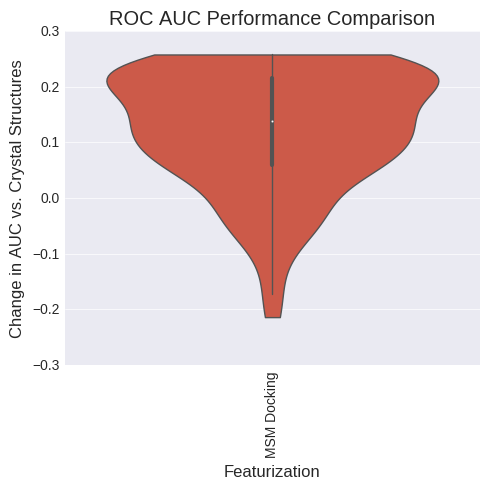

(1, 7)
(1, 7)


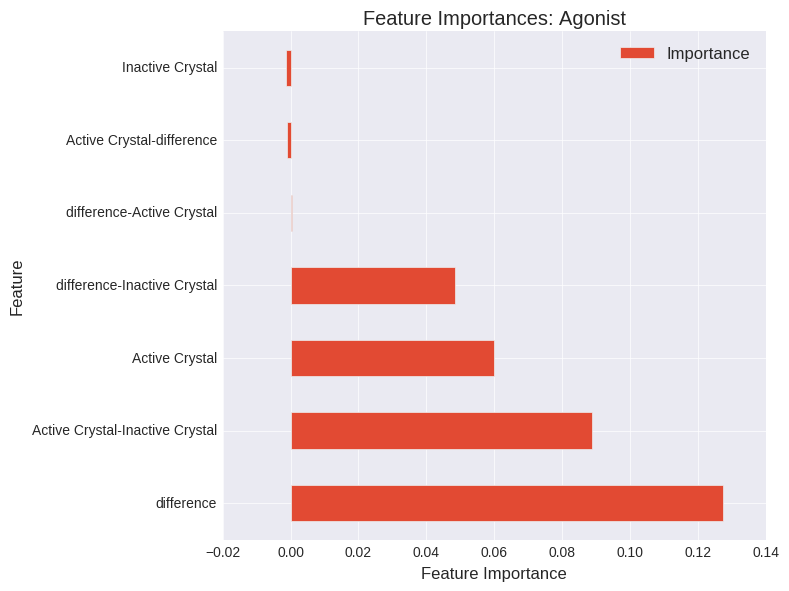

(1, 432)
(1, 432)


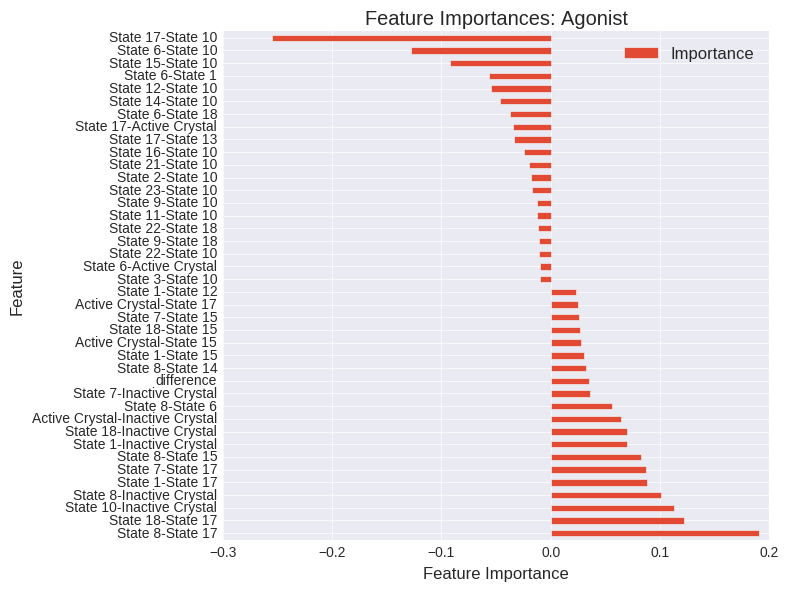

In [416]:
#Normalize False, axis0 True, RFR, methadone, 0.7, 0.5



importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Antagonist", "Agonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.iloc[indices].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False, fxn=np.median)

In [409]:
#Normalize False, axis0 True, RFR, fentanyl, 0.7, 0.5



importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Antagonist", "Agonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.iloc[indices].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False, fxn=np.median)

KeyError: 'two_class_nomethadone_logistic_cv_trials100_tanimoto0.7'

analyzing Recall:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures         1.0               0.0   
MSM Docking                1.0               0.0   

                                          Sign Test 99% CI  
Crystal Structures                                (0, 0.0)  
MSM Docking         (-4.33680868994e-19, 0.00659116490341)  


ValueError: list.remove(x): x not in list

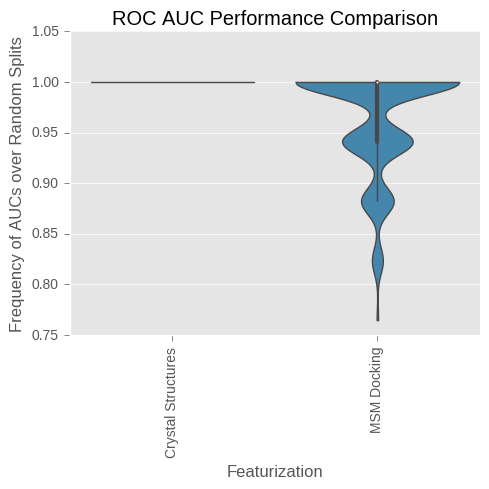

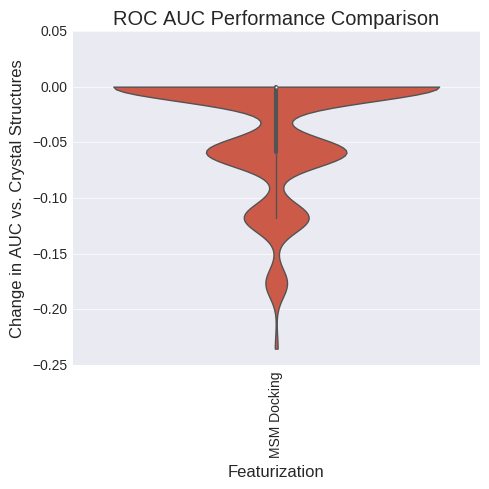

analyzing TPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.739130          0.000000   
MSM Docking           0.809524          0.070393   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.831511478554, 0.887716518056)  


ValueError: list.remove(x): x not in list

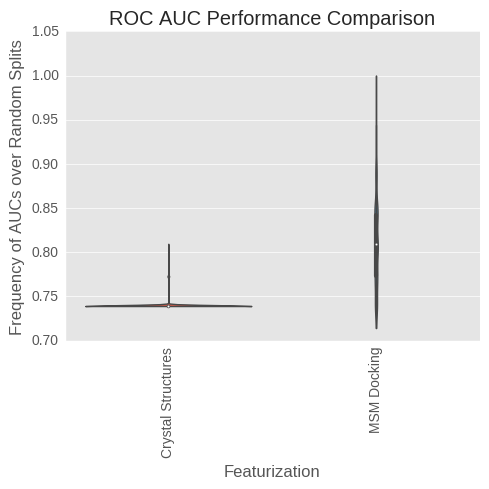

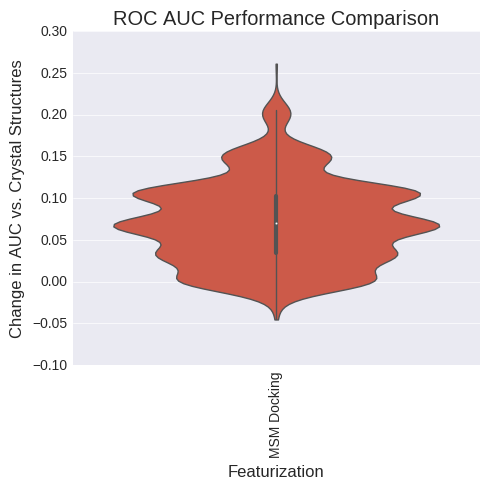

analyzing FPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.260870          0.000000   
MSM Docking           0.190476         -0.070393   

                                       Sign Test 99% CI  
Crystal Structures                             (0, 0.0)  
MSM Docking         (0.00782350679074, 0.0285699231656)  


ValueError: list.remove(x): x not in list

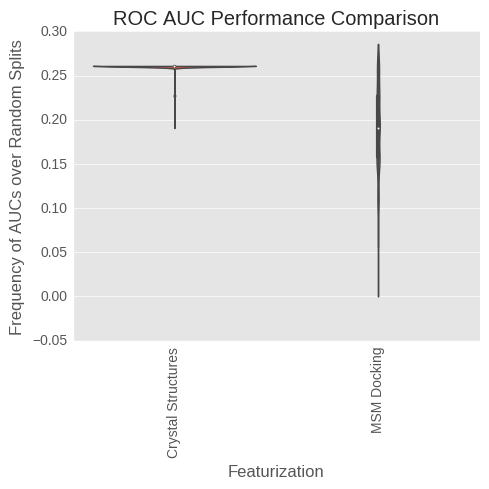

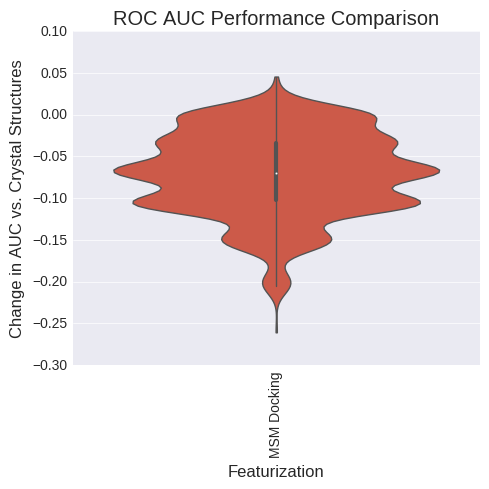

analyzing ROC AUC:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.715686          0.000000   
MSM Docking           0.754902          0.029412   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.531352711078, 0.611698161176)  


ValueError: list.remove(x): x not in list

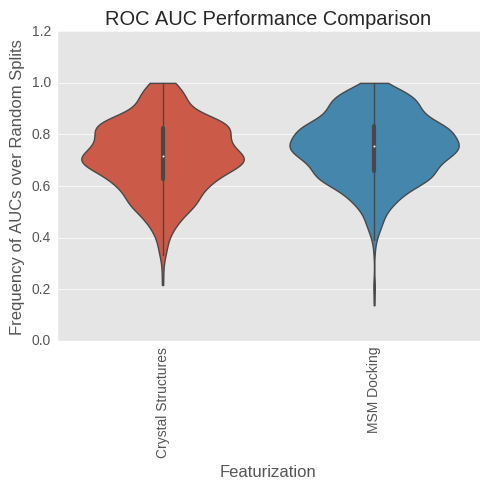

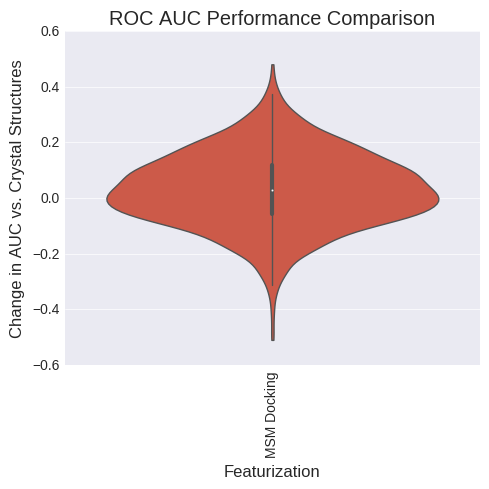

analyzing BedROC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.854399          0.000000   
MSM Docking           0.947197          0.020305   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.583849332349, 0.662516058755)  


ValueError: list.remove(x): x not in list

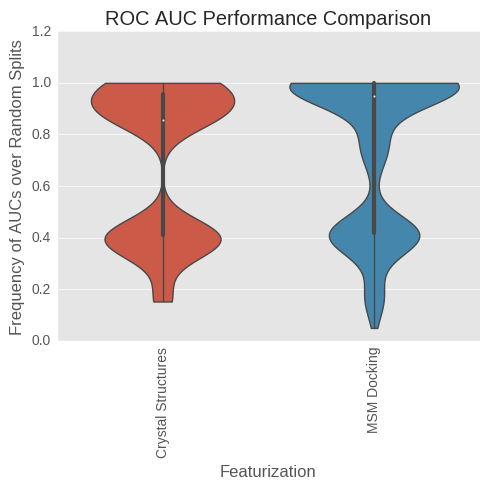

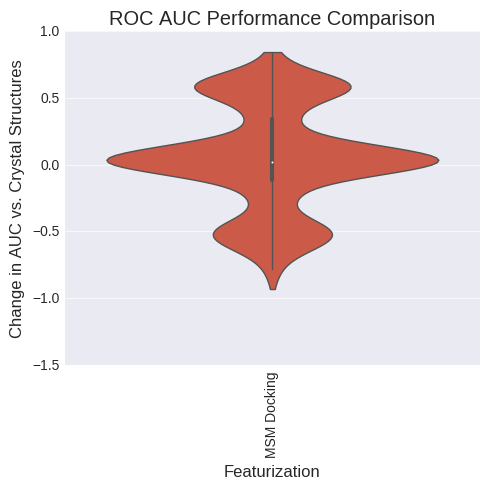

analyzing LogAUC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.180645          0.000000   
MSM Docking           0.198627          0.007682   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.50427405069, 0.585132744469)  


ValueError: list.remove(x): x not in list

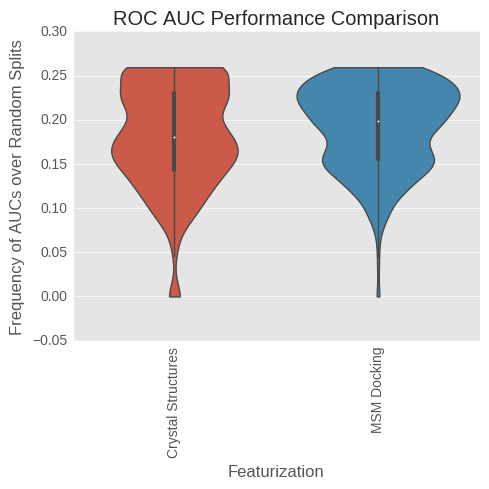

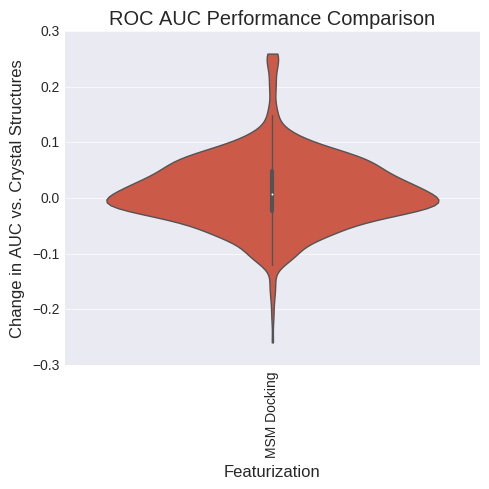

(1, 3)
(1, 3)


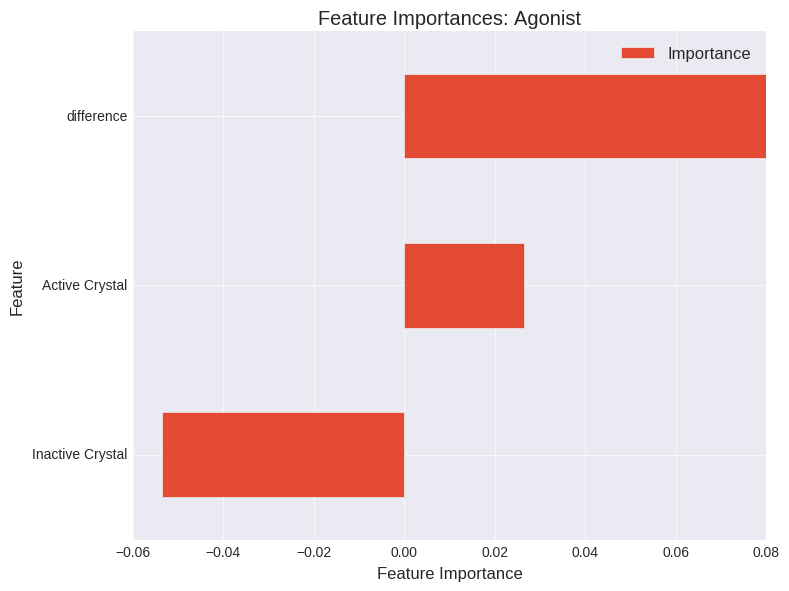

(1, 205)
(1, 205)


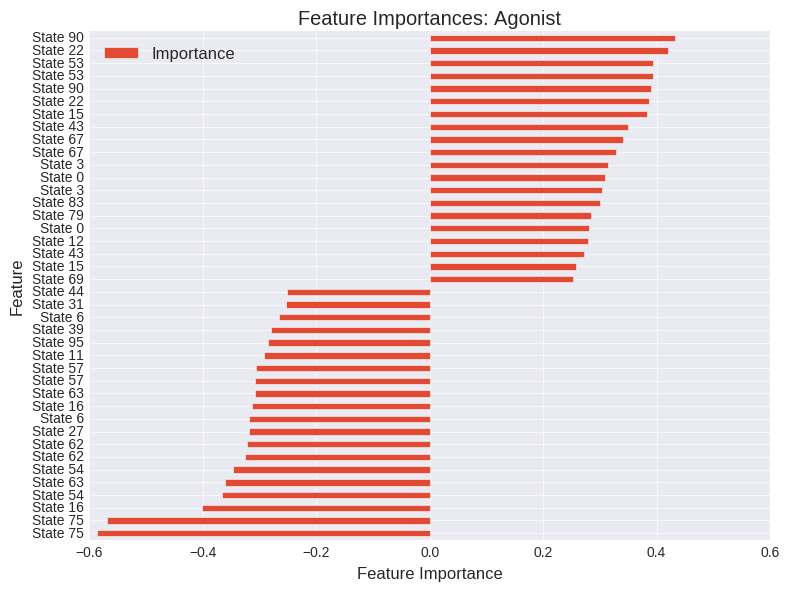

In [559]:
#Normalize False, axis0 True, LR, fentanyl, 0.7, 0.5



importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Antagonist", "Agonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.iloc[indices].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False, fxn=np.median)

analyzing Recall:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures      0.9415            0.0000   
MSM Docking             1.0000            0.0585   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.967571463606, 0.990074653427)  


ValueError: list.remove(x): x not in list

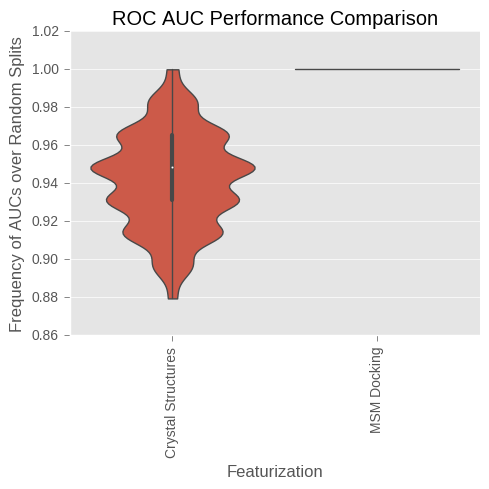

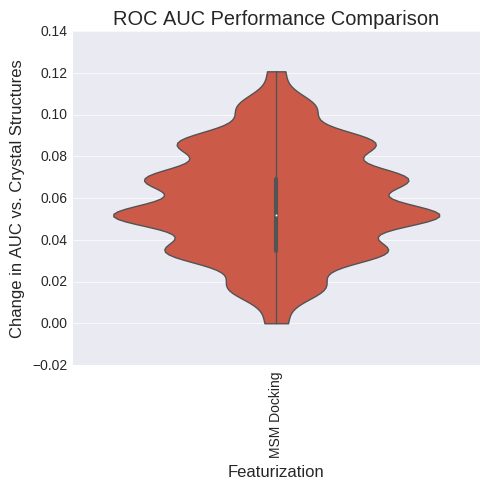

analyzing TPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.821041          0.000000   
MSM Docking           0.806588         -0.014453   

                                  Sign Test 99% CI  
Crystal Structures                        (0, 0.0)  
MSM Docking         (0.1388350005, 0.199554715326)  


ValueError: list.remove(x): x not in list

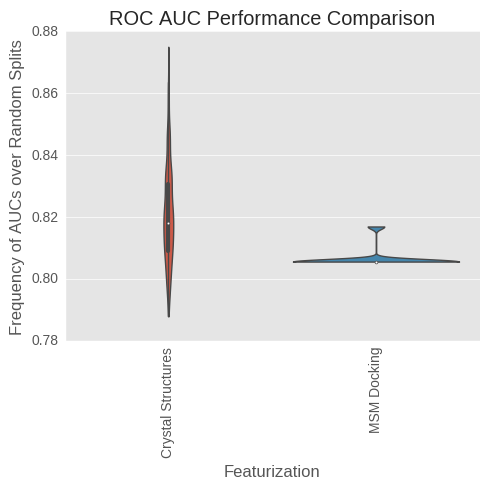

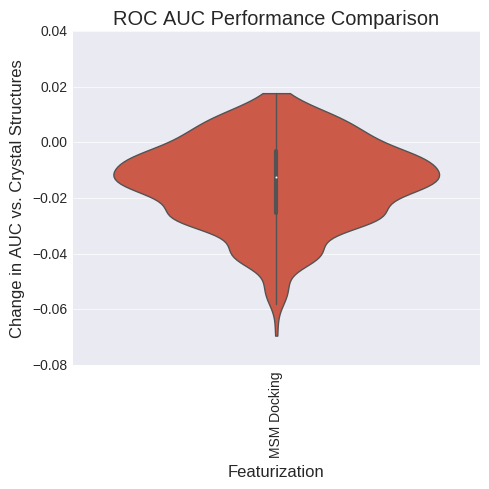

analyzing FPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.178959          0.000000   
MSM Docking           0.193412          0.014453   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.797251326324, 0.85839850484)  


ValueError: list.remove(x): x not in list

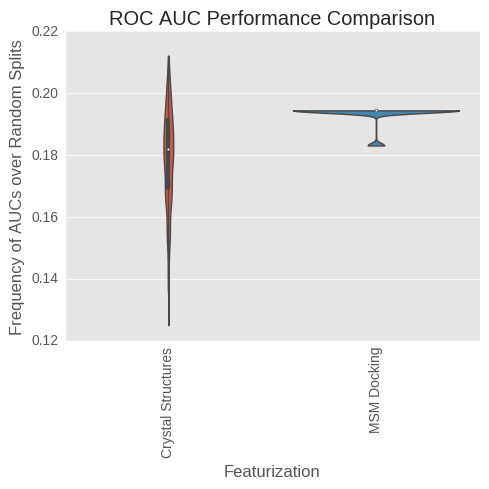

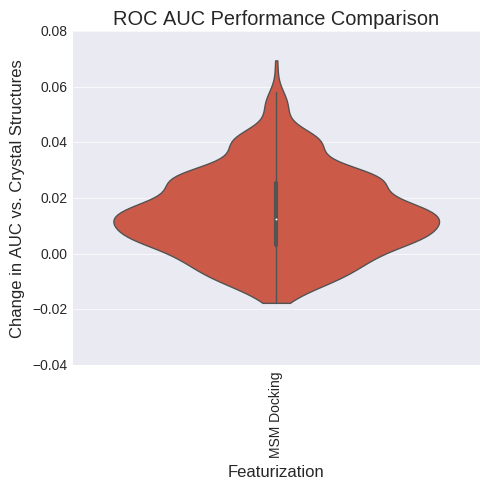

analyzing ROC AUC:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.718036          0.000000   
MSM Docking           0.836924          0.118888   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.915322916861, 0.954903222684)  


ValueError: list.remove(x): x not in list

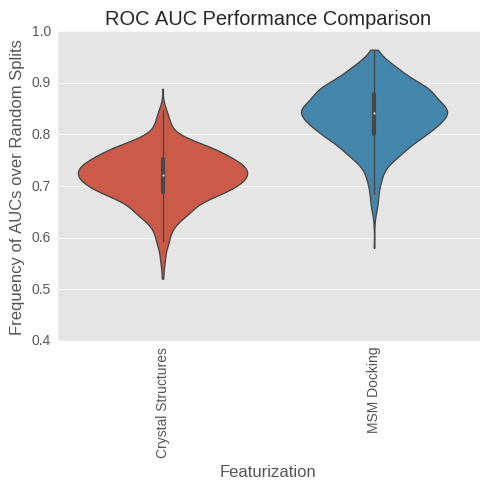

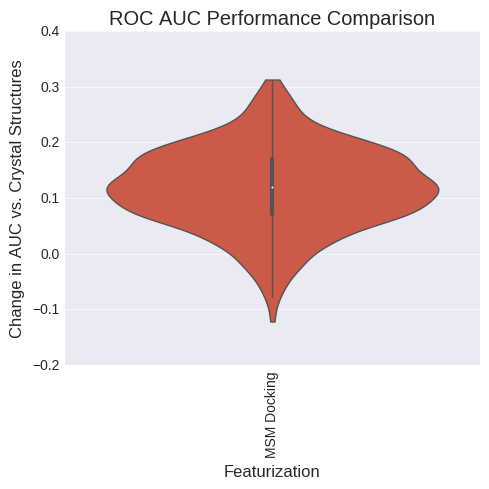

analyzing BedROC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.963296          0.000000   
MSM Docking           0.958758         -0.004538   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.501272694622, 0.582173647526)  


ValueError: list.remove(x): x not in list

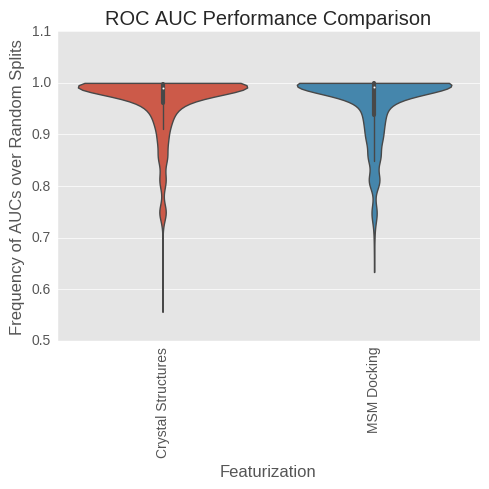

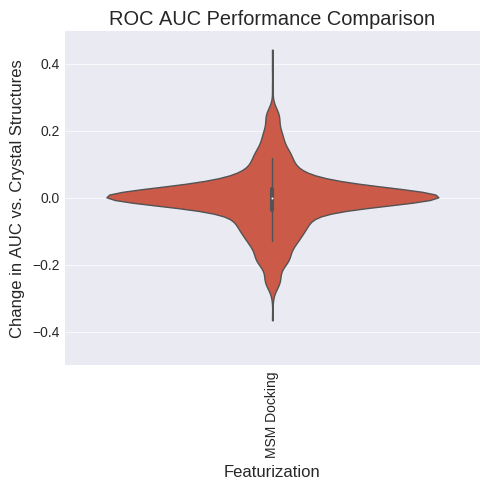

analyzing LogAUC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.232810          0.000000   
MSM Docking           0.290314          0.057504   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.848820965884, 0.902196113449)  


ValueError: list.remove(x): x not in list

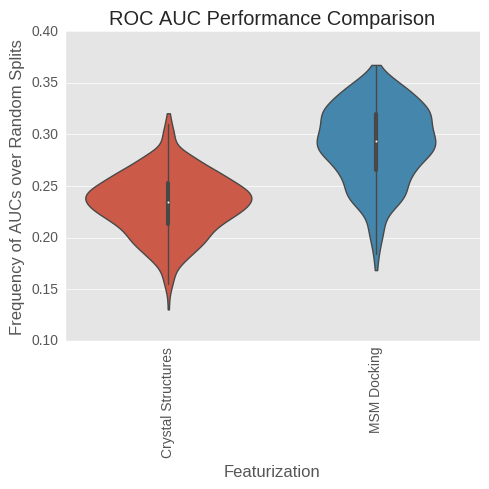

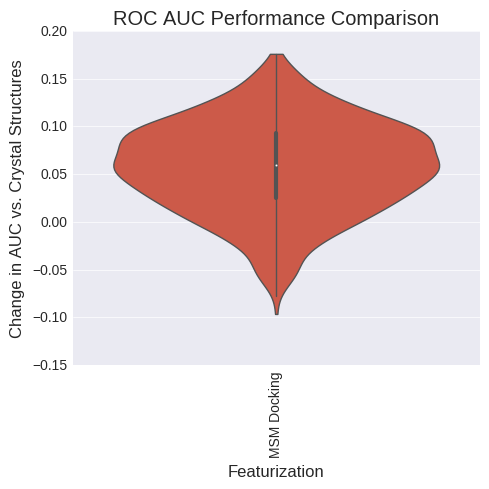

(3,)
(1, 3)


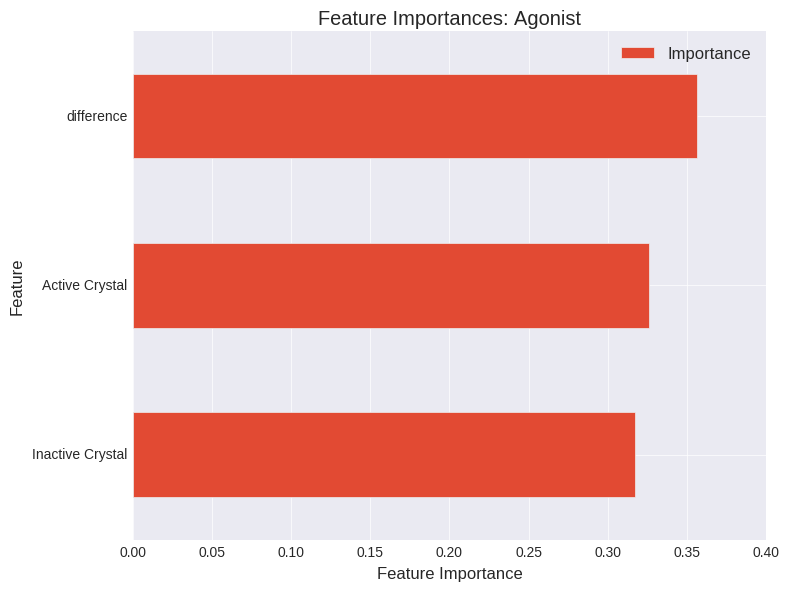

(205,)
(1, 205)


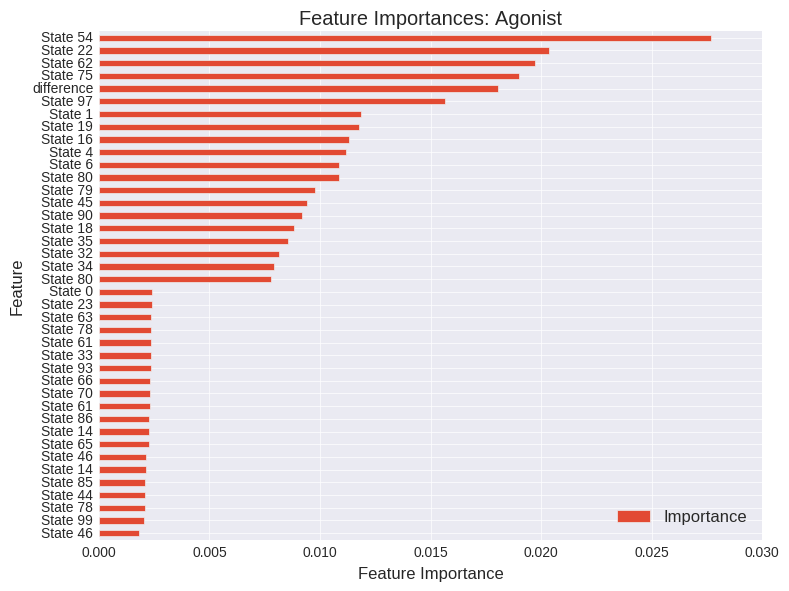

In [360]:
#Normalize False, axis0 True, RFR, fentanyl, 0.6, 0.5



importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Antagonist", "Agonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.iloc[indices].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)

analyzing Recall:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.997552          0.000000   
MSM Docking           0.977172         -0.020379   

                                      Sign Test 99% CI  
Crystal Structures                            (0, 0.0)  
MSM Docking         (0.0400320439005, 0.0778209105337)  


ValueError: list.remove(x): x not in list

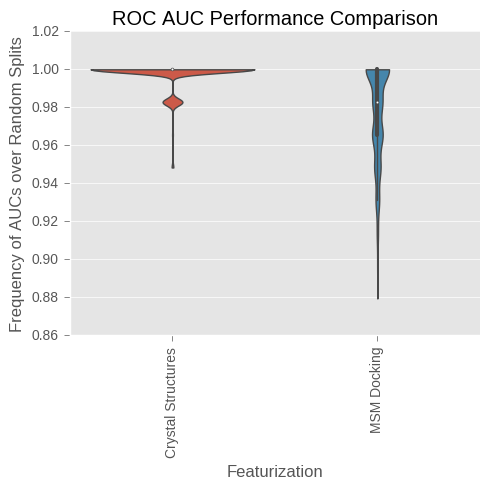

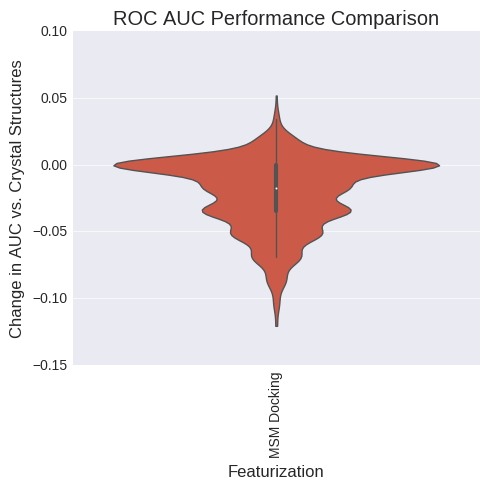

analyzing TPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.805792          0.000000   
MSM Docking           0.841909          0.036118   

                                  Sign Test 99% CI  
Crystal Structures                        (0, 0.0)  
MSM Docking         (0.7038096611, 0.775013397417)  


ValueError: list.remove(x): x not in list

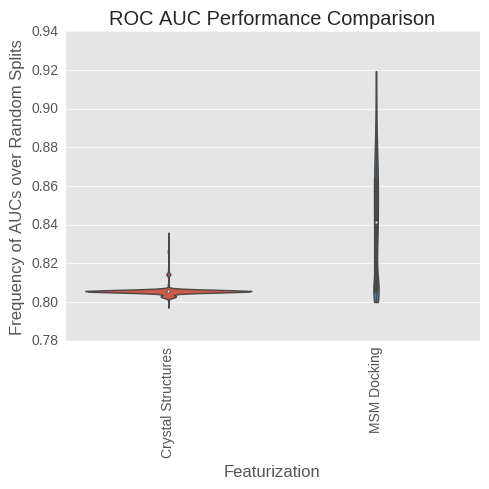

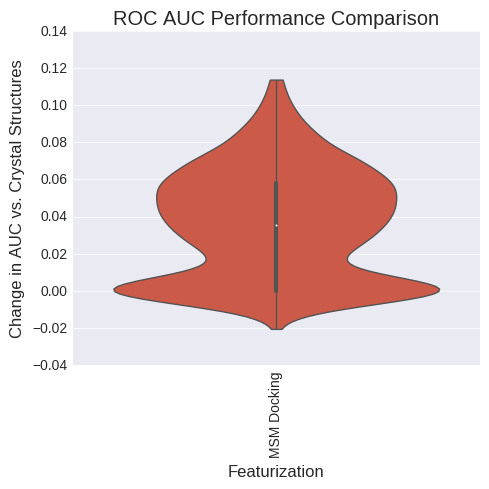

analyzing FPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.194208          0.000000   
MSM Docking           0.158091         -0.036118   

                                       Sign Test 99% CI  
Crystal Structures                             (0, 0.0)  
MSM Docking         (0.00580954161478, 0.0246234353309)  


ValueError: list.remove(x): x not in list

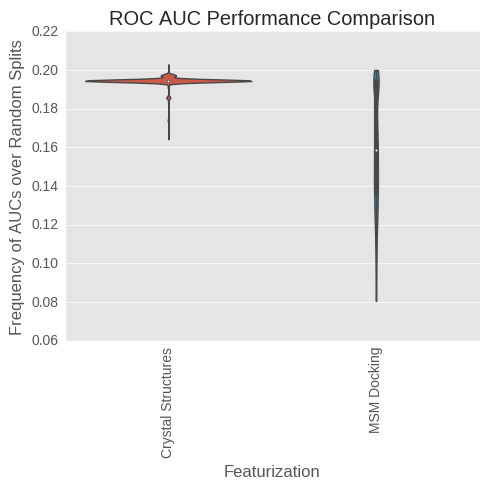

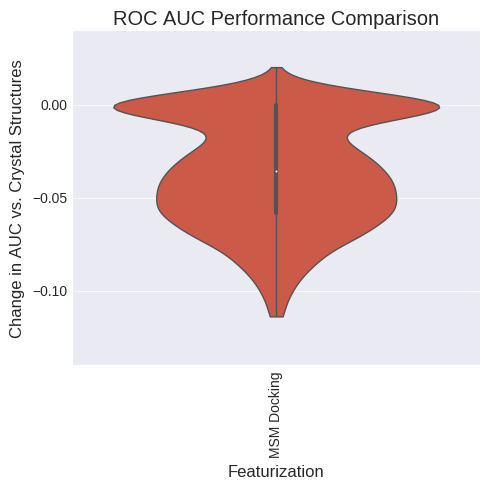

analyzing ROC AUC:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.554367          0.000000   
MSM Docking           0.765241          0.210874   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.946703228737, 0.977166987903)  


ValueError: list.remove(x): x not in list

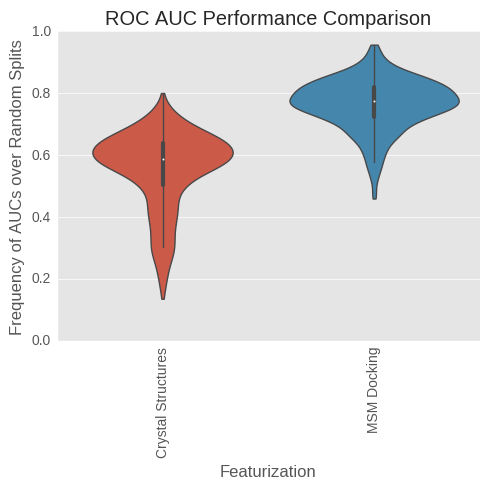

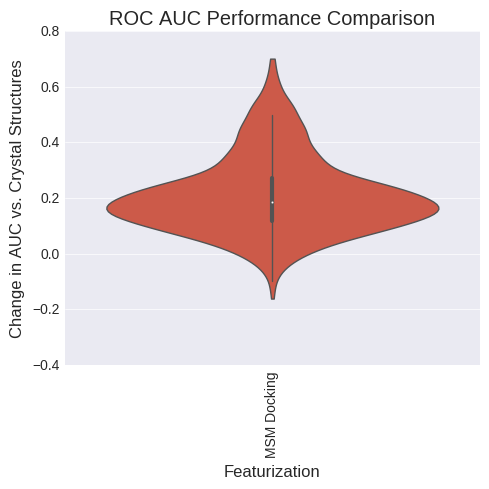

analyzing BedROC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.643574          0.000000   
MSM Docking           0.815801          0.172228   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.743425178453, 0.810896951531)  


ValueError: list.remove(x): x not in list

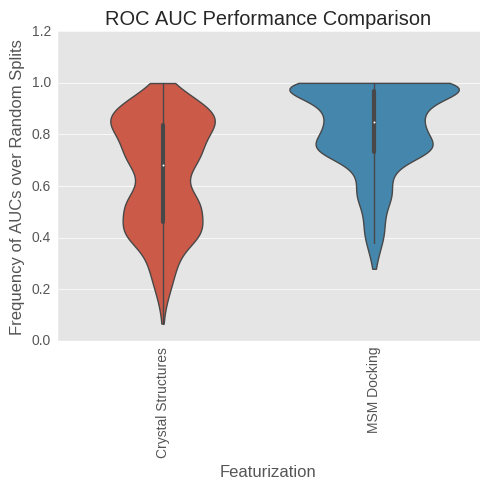

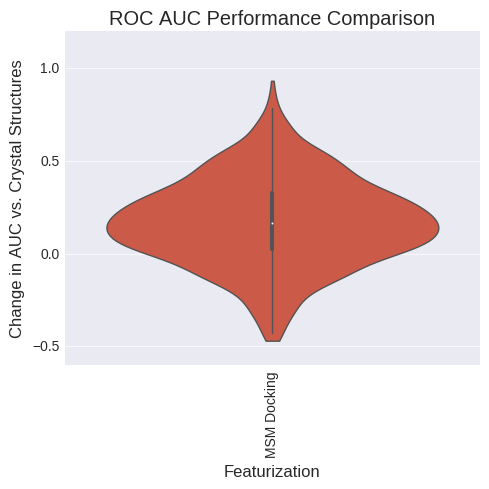

analyzing LogAUC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.142566          0.000000   
MSM Docking           0.241748          0.099182   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.929093027309, 0.964974924277)  


ValueError: list.remove(x): x not in list

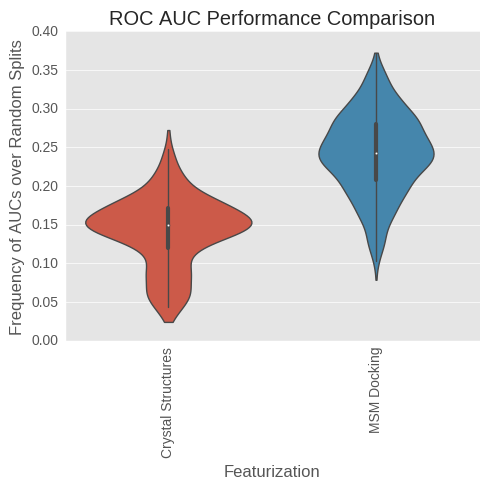

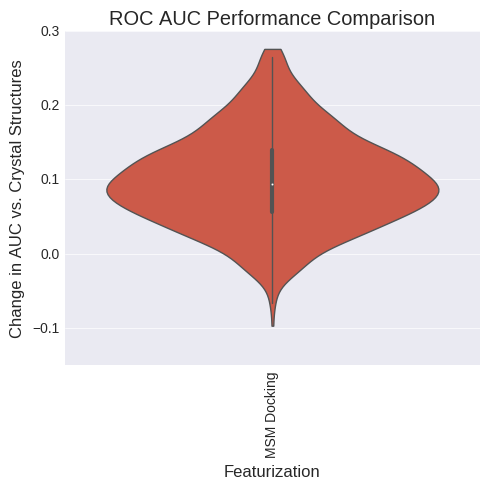

(1, 3)
(1, 3)


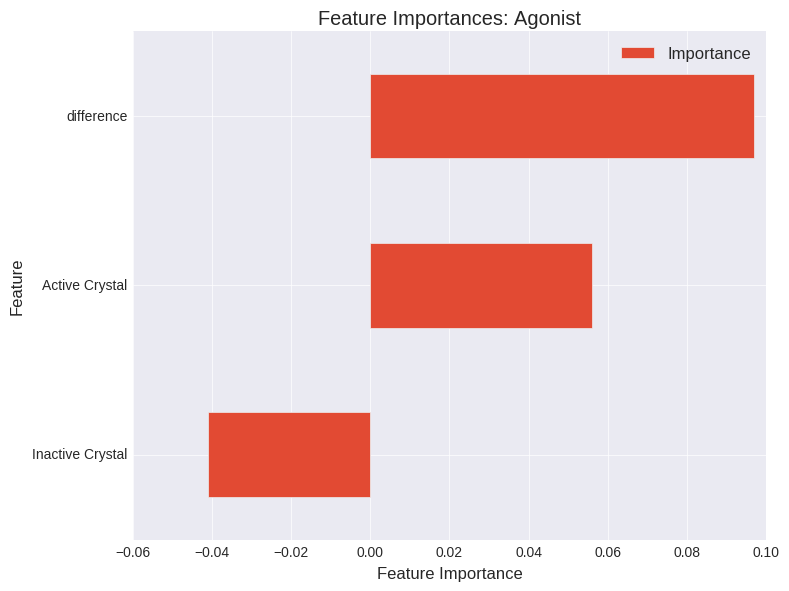

(1, 205)
(1, 205)


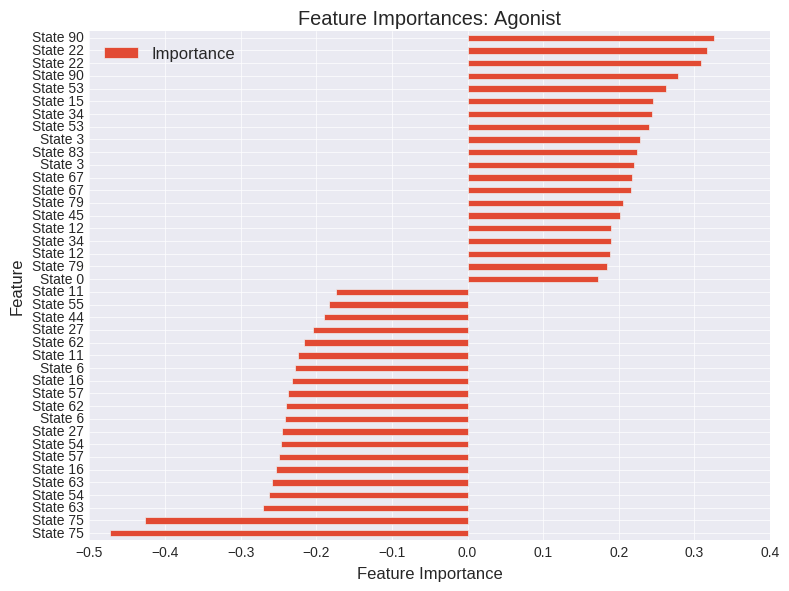

In [362]:
#Normalize False, axis0 True, LR, fentanyl, 0.6, 0.5



importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Antagonist", "Agonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.iloc[indices].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)

In [253]:
fent_ligands = ["18-Methoxycoronaridine", "7-Acetoxymitragynine", "7-Hydroxymitragynine", "Akuammidine","Akuammine", "Coronaridine", "Eseroline", "Hodgkinsine", "Ibogaine", "Mitragynine", "Mitragynine pseudoindoxyl", "Noribogaine", "Pericine", "Pseudoakuammigine"]
fent_ligands = [n for n in ligand_df.index.values.tolist() if n in fent_ligands or (new_ligand_df.loc[n]["fp"] | new_ligand_df.loc["Eseroline"]["fp"]) > .8]
antagonists = [n for n in ligand_df.loc[ligand_df.label == 0.].index.values.tolist() if n not in fent_ligands]
other_agonists = [n for n in ligand_df.loc[ligand_df.label == 1.].index.values.tolist() if n not in fent_ligands and (new_ligand_df.loc[n]["fp"] | new_ligand_df.loc["Eseroline"]["fp"]) < .6]

In [265]:
fent_ligands = ["18-Methoxycoronaridine", "7-Acetoxymitragynine", "7-Hydroxymitragynine", "Akuammidine","Akuammine", "Coronaridine", "Eseroline", "Hodgkinsine", "Ibogaine", "Mitragynine", "Mitragynine pseudoindoxyl", "Noribogaine", "Pericine", "Pseudoakuammigine"]
fent_ligands = [n for n in ligand_df.index.values.tolist() if n in fent_ligands or (new_ligand_df.loc[n]["fp"] | new_ligand_df.loc["Eseroline"]["fp"]) > .8]

fent_agonists = [n for n in ligand_df.loc[ligand_df.label == 1.].index.values.tolist() if n in fent_ligands]
antagonists = [n for n in ligand_df.loc[ligand_df.label == 0.].index.values.tolist() if n not in fent_ligands]
other_agonists = [n for n in ligand_df.loc[ligand_df.label == 1.].index.values.tolist() if n not in fent_ligands and (new_ligand_df.loc[n]["fp"] | new_ligand_df.loc["Eseroline"]["fp"]) < .5]

In [167]:
fent_ligands = [n for n in ligand_df.index.values.tolist() if "fent" in n.lower()]# or (new_ligand_df.loc[n]["fp"] | new_ligand_df.loc["Fentanyl"]["fp"]) > .7]
fent_ligands = [n for n in ligand_df.index.values.tolist() if "fent" in n.lower() or (new_ligand_df.loc[n]["fp"] | new_ligand_df.loc["Fentanyl"]["fp"]) > .6]
len(fent_ligands)


54

In [112]:
#pd.DataFrame(results_dict[save_name]['Crystal Structures'][0].predict_proba(C_test), columns=["proba", "probb"], index=test_ligands).sort("probb", ascending=False, inplace=False)

In [153]:
full_ligand_df.columns

Index(['Edits', 'Unnamed: 0', 'Unnamed: 4', 'Unnamed: 5', 'Unnamed: 7',
       'action', 'ligand', 'name', 'smiles', 'fp'],
      dtype='object')

In [134]:
def add_difference_columns(df):
    new_df = copy.deepcopy(df)
    for i, col_i in enumerate(df.columns):
        print(i)
        for j, col_j in enumerate(df.columns):
           if j <= i: continue
    ##        if "crystal" in col_j.lower() or "crystal" in col_i.lower(): continue
           new_df["%s-%s" %(col_j, col_i)] = new_df[col_j].subtract(new_df[col_i])
    for i, col_i in enumerate(df.columns):
        if col_i != "Active Crystal":
            new_df["Active Crystal-%s" %col_i] = new_df["Active Crystal"].subtract(new_df[col_i])
    return(new_df)

X_df = copy.deepcopy(full_docking_df)
#X_df["Active Crystal-Inactive Crystal"] = X_df["Active Crystal"].subtract(X_df["Inactive Crystal"])
X_df = add_difference_columns(X_df)
#X_df = X_df[[n for n in X_df.columns if "difference" not in n]]
X_df = X_df.dropna().reset_index().drop_duplicates(subset='index', keep='first').set_index('index')
C_df = X_df[[n for n in X_df.columns.values.tolist() if "State" not in n]]

if not os.path.exists("%s/x_df.pkl" %analysis_dir):
    with open("%s/x_df.pkl" %analysis_dir, "wb") as f:
        pickle.dump(X_df, f, protocol=2)

ligand_df = copy.deepcopy(full_ligand_df[[c for c in full_ligand_df.columns.values if "fp" not in c.lower()]]).drop_duplicates(subset=['name'], keep='first')
ligand_df.index = [n.lower() for n in ligand_df.index.values]
print(full_ligand_df.shape)
print(ligand_df.shape)

keep_ligands = [n for n in ligand_df.index.values if "cid" not in n]
ligand_df = ligand_df.loc[keep_ligands]

x = ligand_df["Edits"].dropna().index
ligand_df["action"].loc[x] = ligand_df.loc[x]["Edits"]
#print(ligand_df["action"])

keep_ligands = ligand_df["Edits"].dropna().index.values.tolist() #+ [n for n in ligand_df.index.values if "cid" in n]
ligand_df = ligand_df.loc[keep_ligands]

#ligand_df = pd.concat([ligand_df, sk_ligand_df], axis=0)

ligand_df = ligand_df.loc[[n for n in ligand_df.index.values if n in full_docking_df.index.values]]

mols = [pybel.readstring("smi", x) for x in ligand_df.smiles]
fps = [x.calcfp(fptype='FP4') for x in mols] # Calculate their fingerprints
ligand_df["fp"] = fps


similarity_matrix = np.zeros((len(mols), len(mols)))
remove_ligands = []
print("original ligands: %d" %ligand_df.shape[0])

for i in range(0, len(mols)):
    for j in range(i, len(mols)):
        if i == j:
            continue            
        similarity_matrix[i][j] = fps[i] | fps[j]
        if similarity_matrix[i][j] > 0.9:
            continue
            remove_ligands.append(j)

ligand_df = ligand_df.iloc[[i for i in range(0, len(mols)) if i not in remove_ligands]]
#print("kept ligands: %d" %ligand_df.shape[0])


classes = ligand_df["action"].values.tolist()
class_labels = []
indices = []
n_antagonists = 0
n_agonists = 0
non_existing_ligands = []
for i, label in enumerate(classes):
        if "antagonist" == label.lower():# or "neutral" in label.lower() or "negative" in label.lower():
                class_labels.append(0.)
                indices.append(i)
                n_antagonists += 1
        elif "agonist" == label.lower():# or "positive" in label.lower():
                class_labels.append(1.)
                indices.append(i)
                n_agonists += 1
        else:
                non_existing_ligands.append(ligand_df.index.values[i])

print("n_antagonists: %d" %n_antagonists)
print("n_agonists: %d" %n_agonists)


ligand_df = ligand_df.iloc[indices]
ligand_df["label"] = class_labels

inds = list(range(0, ligand_df.shape[0]))
random.shuffle(inds)
test_ligand_df = ligand_df.iloc[inds[:15]]
train_ligand_df = ligand_df.iloc[inds[15:]]
ligand_df = train_ligand_df

model_agonists = ligand_df.index.values

y = ligand_df["label"].values.reshape((-1,1))
y_df = pd.DataFrame(y, index=ligand_df.index).loc[model_agonists]
y = y_df.values

n_trials = 0
train_test_split_prop = 0.9
model_type = "rfr"
def normalize_per_ligand(df):
    new_df = copy.deepcopy(df)
    n_df = new_df.ix[:, [i for i in range(0, new_df.shape[1]) if "difference" not in new_df.columns.values[i].lower()]]
    n_df = pd.DataFrame(preprocessing.scale(n_df.values, axis=1), index=n_df.index, columns=n_df.columns.values.tolist())
    new_df = pd.concat([new_df, n_df], axis=1)
    return(new_df)

normalize = False
normalize_axis0 = False
if normalize_axis0:
    double_features = 2
    new_df = normalize_per_ligand(X_df)
else: 
    new_df = X_df
    double_features = 1
n_estimators = 1000

features = [C_df.loc[model_agonists], new_df.loc[model_agonists]]#, all_features_df]#, all_features]
feature_names = ["Crystal Structures", "MSM Docking"]
print([f.shape for f in features])
save_name = "agonist_%s_trials%d_split%s_normalize%s_normalize-axis0%s_n-estimators%d_precision%s" %(model_type, n_trials, str(train_test_split_prop), str(normalize), str(normalize_axis0), n_estimators, precision)

if not os.path.exists("%s/%s_new_df.pkl" %(analysis_dir, save_name)):
    with open("%s/%s_new_df.pkl" %(analysis_dir, save_name), "wb") as f:
        pickle.dump(new_df, f, protocol=2)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
(2171, 10)
(2159, 9)
original ligands: 260
n_antagonists: 27
n_agonists: 153
[(165, 3), (165, 403)]


In [557]:
ligand_df["smiles"]

compd01                             C=CCN1CC[C@@]23[C@@]4(C1Cc1c3c(OC2C(=O)CC4)c(cc1)O)O\tMicrosoft Excel - Machine Learning_MP binding data set-V8_ MWs\n
7-pet                                                                                                                                                     
acetorphine                                                                                                                                               
acetyldihydrocodeine                                                                                                                                      
acetylfentanyl                                                                                                                                            
acetylpropionylmorphine                                                                                                                                   
acrylfentanyl                                                         

In [560]:
ligand_df.loc[[n for n in full_ligand_df.index if "compd" in n]]

,DOR,Edits,KOR,MOR,Mol. Wt.,Molecular Structure,Opiates/Opioids,Unnamed: 0,Unnamed: 4,Unnamed: 5,Unnamed: 7,action,ligand,name,smiles
compd01,NaN,NaN,NaN,4.23,327.1471,NaN,Naloxone,NaN,NaN,NaN,antagonist,antagonist,naloxone,NaN,C=CCN1CC[C@@]23[C@@]4(C1Cc1c3c(OC2C(=O)CC4)c(cc1)O)O\tMicrosoft Excel - Machine Learning_MP binding data set-V8_ MWs\n
compd02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
compd03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
compd04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
compd05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
compd06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
compd12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
compd13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
compd14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
compd15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [492]:
ligand_df.loc["compd"]

AttributeError: 'Series' object has no attribute 'columns'

In [135]:
results_dict[save_name] = generate_or_load_model(features, y, feature_names,
                                                 n_trials, train_test_split_prop, False,
                                                 model_type, "%s/%s.pkl" %(analysis_dir, save_name),
                                                 redo=True, worker_pool=None, parallel=True, n_estimators=n_estimators, 
                                                 max_depth=None, criterion='gini',
                                                 normalize=normalize, normalize_axis0=False)

Aobut to fit model(s).
Fitting models over all data...
Fitting models over split train data...
Finished fitting models


In [136]:
y_true = test_ligand_df["label"].sort("label", inplace=False, ascending=True)
y_pred = pd.DataFrame(results_dict[save_name]["MSM Docking"][0].predict_proba(new_df.loc[y_true.index.values.tolist()].values), index=y_true.index, columns=["antagonist", "agonist"])
auc = roc_auc_score(y_true.values.reshape((-1,1)), y_pred.values[:,1])
print(auc)
#roc_df = pd.DataFrame(rocs, columns=["aucs"], index=new_df.columns.values).sort("aucs", inplace=False)
#roc_df

0.961538461538


In [112]:
y_pred.sort("antagonist", inplace=False)

,antagonist,agonist
etoxeridine,0.069,0.931
methyldihydromorphine,0.088,0.912
c-8813,0.104,0.896
chloromorphide,0.127,0.873
mitragynine_pseudoindoxyl,0.139,0.861
mt-45,0.140,0.860
chloroxymorphamine,0.151,0.849
pzm21,0.153,0.847
dimenoxadol,0.196,0.804
levallorphan,0.224,0.776


In [113]:
model = results_dict[save_name]['MSM Docking'][0]
y_proba =model.predict_proba(new_df.values)
test_df = pd.DataFrame(y_proba, index=new_df.index, columns=["antagonist", "agonist"]).sort("agonist", ascending=False, inplace=False)
test_df.loc[[n for n in test_df.index if "compd11" in n]]

,antagonist,agonist
index,,
compd111,0.243,0.757
compd115,0.251,0.749
compd110,0.269,0.731
compd112,0.269,0.731
compd114,0.280,0.720
compd113,0.283,0.717
compd11,0.311,0.689


In [114]:
pd.concat([y_pred, test_df.loc[[n for n in test_df.index if "compd11" in n and n != "compd11"]]], axis=0).sort("antagonist")

,antagonist,agonist
etoxeridine,0.069,0.931
methyldihydromorphine,0.088,0.912
c-8813,0.104,0.896
chloromorphide,0.127,0.873
mitragynine_pseudoindoxyl,0.139,0.861
mt-45,0.140,0.860
chloroxymorphamine,0.151,0.849
pzm21,0.153,0.847
dimenoxadol,0.196,0.804
levallorphan,0.224,0.776


In [41]:
y_true = test_ligand_df["label"].sort("label", inplace=False, ascending=True)
rocs = [roc_auc_score(y_true.values.reshape((-1,1)), new_df.loc[y_true.index.values.tolist()][col].values) for col in new_df.columns]
roc_df = pd.DataFrame(rocs, columns=["aucs"], index=new_df.columns.values).sort("aucs", inplace=False)
roc_df

,aucs
State 17-State 14,0.180556
State 17,0.194444
State 23-State 20,0.197917
State 17-Active Crystal,0.197917
State 24-State 16,0.201389
State 17-State 10,0.204861
State 17-State 16,0.204861
State 24-State 10,0.211806
State 9-State 20,0.229167
State 9-State 2,0.243056


In [297]:
y_true.values.shape

(222,)

In [295]:
ligand_df

,name,action,ligand,label
piritramide,Piritramide,agonist,Piritramide,1.0
ibntxa,IBNtxA,agonist,IBNtxA,1.0
bw373u86,BW373U86,agonist,BW373U86,1.0
mirfentanil,Mirfentanil,agonist,Mirfentanil,1.0
oxymorphazone,Oxymorphazone,agonist,Oxymorphazone,1.0
levophenacylmorphan,Levophenacylmorphan,agonist,Levophenacylmorphan,1.0
eseroline,Eseroline,agonist,Eseroline,1.0
epicatechin,Epicatechin,antagonist,Epicatechin,0.0
racemorphan,Racemorphan,agonist,Racemorphan,1.0
semorphone,Semorphone,agonist,Semorphone,1.0


In [290]:
full_ligand_df.iloc[:10]

,name,action,ligand
name,,,
3-HO-PCP,3-HO-PCP,agonist,3-HO-PCP
7-PET,7-PET,agonist,7-PET
Acetorphine,Acetorphine,agonist,Acetorphine
Acetoxyketobemidone,Acetoxyketobemidone,agonist,Acetoxyketobemidone
Acetyldihydrocodeine,Acetyldihydrocodeine,agonist,Acetyldihydrocodeine
Acetylfentanyl,Acetylfentanyl,agonist,Acetylfentanyl
Acetylmethadol,Acetylmethadol,agonist,Acetylmethadol
Acetylmorphone,Acetylmorphone,agonist,Acetylmorphone
Acetylpropionylmorphine,Acetylpropionylmorphine,agonist,Acetylpropionylmorphine


In [351]:
C_df.iloc[0]

Inactive Crystal                   4.93
Active Crystal                     5.04
Active Crystal-Inactive Crystal    0.11
Name: 1-iodomorphine, dtype: float64

In [352]:
ligand_df["action"]

7-pet                                  Agonist
acetylfentanyl                         agonist
acetylmethadol                         agonist
acrylfentanyl                          agonist
ah-7921                                agonist
alfentanil                             agonist
alimadol                               agonist
3-allylfentanyl                        agonist
allylnorpethidine                      agonist
allylprodine                           agonist
alphacetylmethadol                     agonist
alphamethadol                          agonist
alphamethylthiofentanyl                agonist
anileridine                            agonist
azaprocin                              agonist
azidomorphine                          agonist
bdpc                                   agonist
benzethidine                           agonist
betacetylmethadol                      agonist
betahydroxyfentanyl                    agonist
betahydroxythiofentanyl                agonist
betamethadol 

In [342]:
"%s/%s_new_df.pkl" %(analysis_dir, save_name)

'/home/enf/md_simulations/MOR/h8_reimaged/sparse-tICA_t50_n_components10all_residues_4dkl_5c1m_under_cutoff6A-CA-py3-far_regularization_wolf_autoShrinkage0pt01-backup/analysis_n_clusters100_random/agonist_rfr_trials100_split0.9_normalizeFalse_normalize-axis0True_n-estimators1000_precisionXP_new_df.pkl'

In [29]:
#results_dict = {}

In [57]:
new_df.loc[[n for n in new_df.index if "dadle" in n or ("cid" not in n.lower() and "chembl" not in n.lower() and "_" != n[0] and "compd11" in n)]].sort("State 17-State 10", inplace=False)["State 17-State 10"]

index
compd11    -0.25
compd112    0.28
compd115    0.33
compd111    0.56
compd110    0.61
compd113    0.96
compd114    1.18
dadle       1.50
Name: State 17-State 10, dtype: float64

In [34]:
plt.scatter(new_df.loc[y_true.index.values.tolist()]["State 23-State 10"].values, y_true.values.reshape((-1,1)))

NameError: name 'y_true' is not defined

In [345]:
features[0].shape

(268, 3)

analyzing precision at full recall:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.842413          0.000000   
MSM Docking           0.879017          0.036605   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.521325733492, 0.760008060193)  


ValueError: list.remove(x): x not in list

analyzing threshold at full recall:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures     0.33399           0.00000   
MSM Docking            0.55802           0.22403   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.796249261528, 0.953974188299)  


ValueError: list.remove(x): x not in list

analyzing Accuracy:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.818148          0.000000   
MSM Docking           0.852593          0.034444   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.481298653499, 0.725012795204)  


ValueError: list.remove(x): x not in list

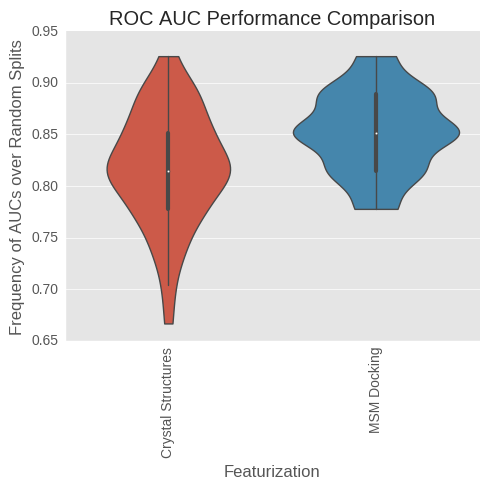

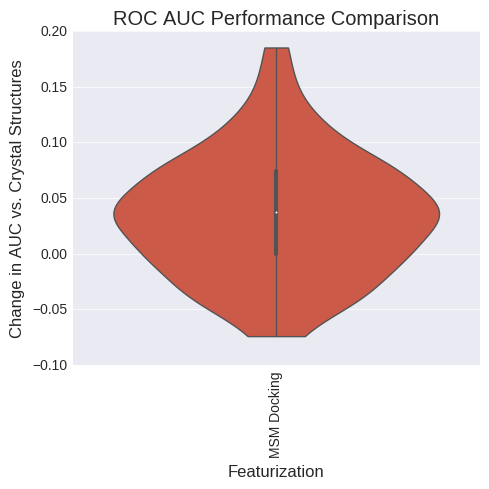

analyzing Recall:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.930909          0.000000   
MSM Docking           0.987727          0.056818   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.58299521186, 0.810872099299)  


ValueError: list.remove(x): x not in list

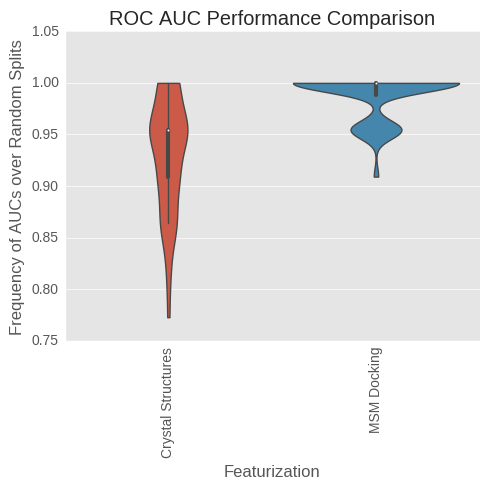

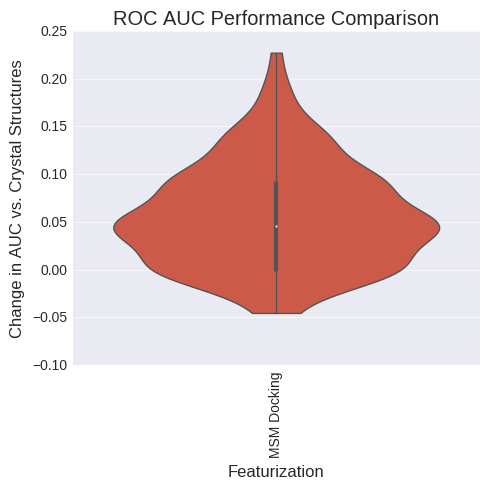

analyzing precision:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.859035           0.00000   
MSM Docking           0.855265          -0.00377   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.365925226154, 0.615319187601)  


ValueError: list.remove(x): x not in list

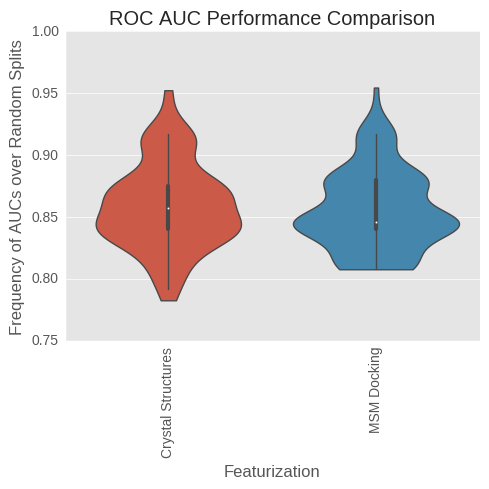

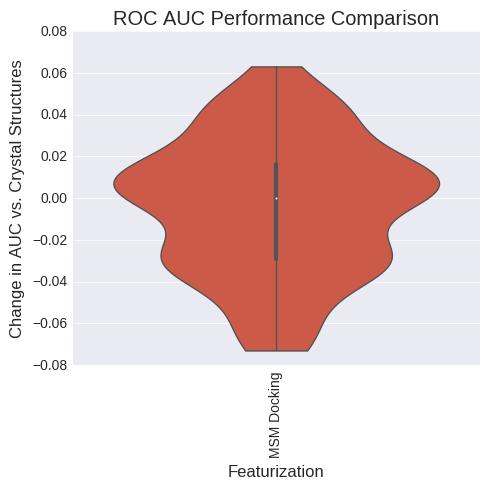

analyzing fdr:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.140965           0.00000   
MSM Docking           0.144735           0.00377   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.283863255474, 0.528580882069)  


ValueError: list.remove(x): x not in list

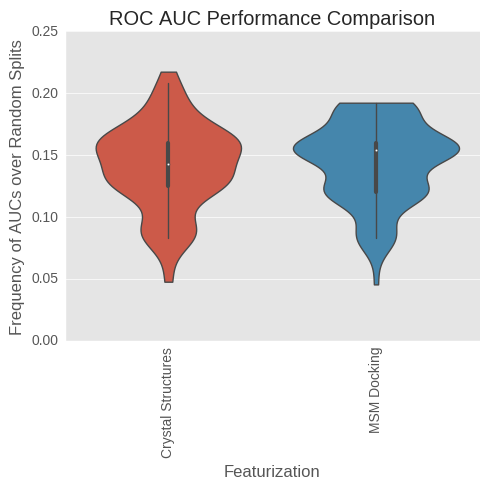

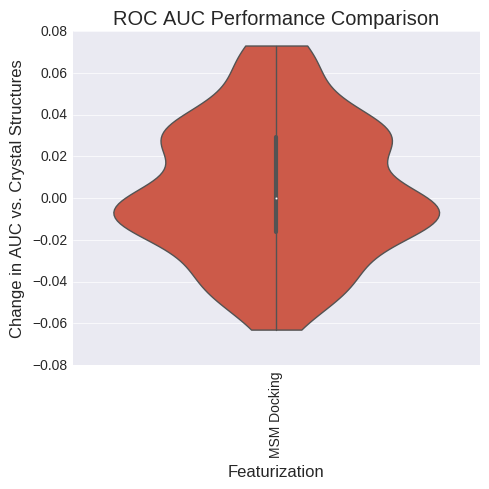

analyzing Recall:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.930909          0.000000   
MSM Docking           0.987727          0.056818   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.58299521186, 0.810872099299)  


ValueError: list.remove(x): x not in list

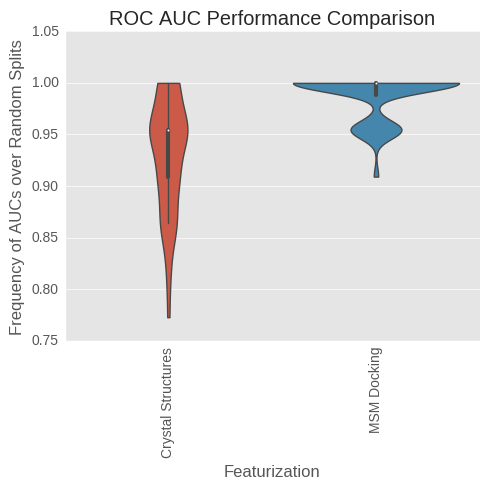

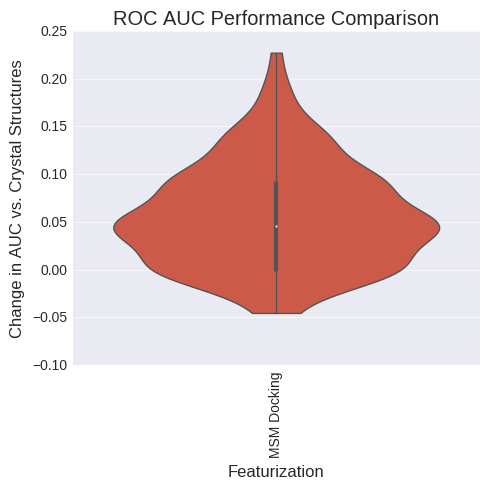

analyzing precision:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.859035           0.00000   
MSM Docking           0.855265          -0.00377   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.365925226154, 0.615319187601)  


ValueError: list.remove(x): x not in list

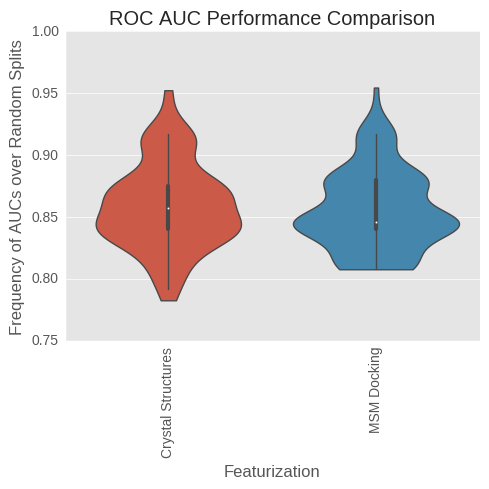

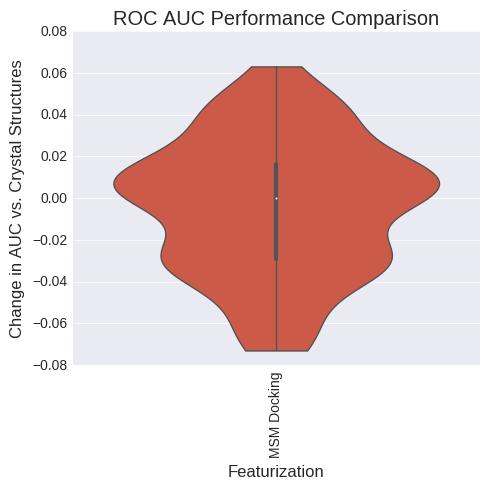

analyzing fdr:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.140965           0.00000   
MSM Docking           0.144735           0.00377   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.283863255474, 0.528580882069)  


ValueError: list.remove(x): x not in list

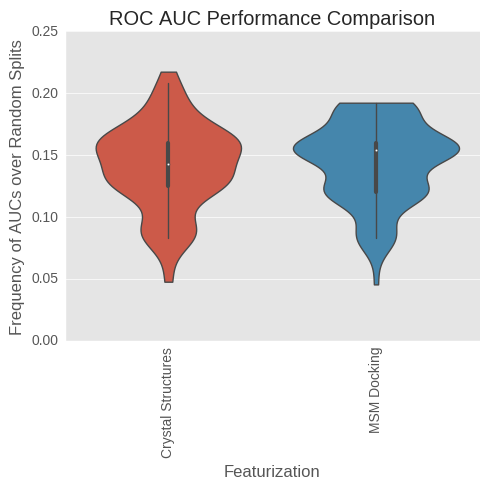

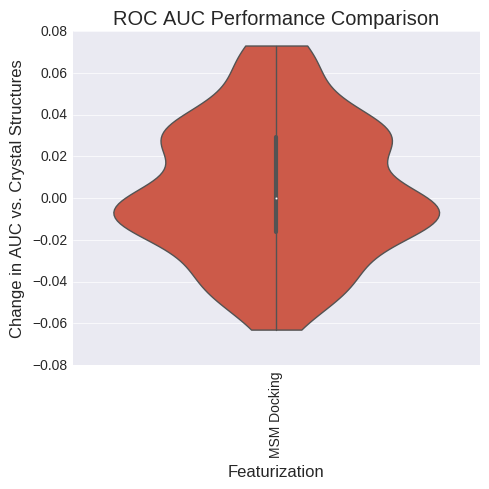

analyzing class B ROC AUC:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.734773          0.000000   
MSM Docking           0.864500          0.129727   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.808682796607, 0.960296239466)  


ValueError: list.remove(x): x not in list

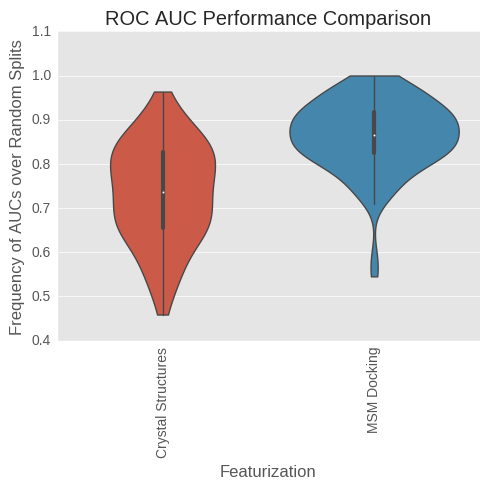

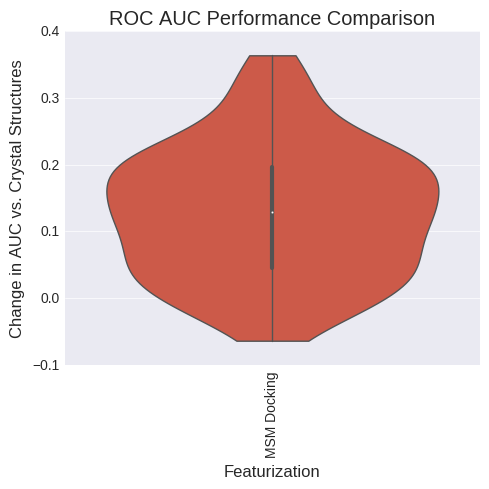

analyzing ROC AUC:
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.734773          0.000000   
MSM Docking           0.864500          0.129727   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.808682796607, 0.960296239466)  


ValueError: list.remove(x): x not in list

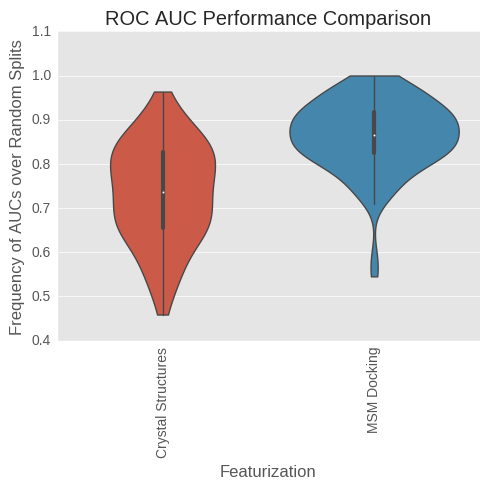

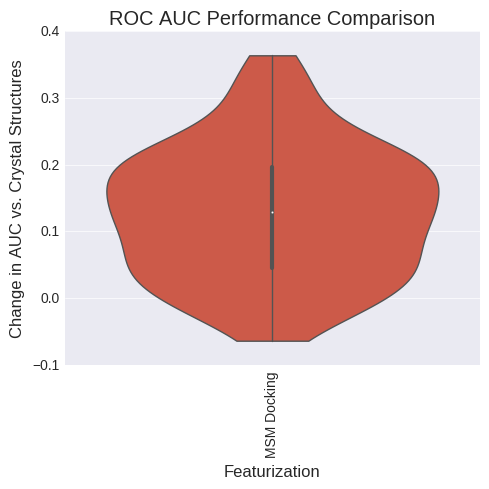

analyzing BedROC
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.951587          0.000000   
MSM Docking           0.994365          0.042778   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.748196379965, 0.92700472488)  


ValueError: list.remove(x): x not in list

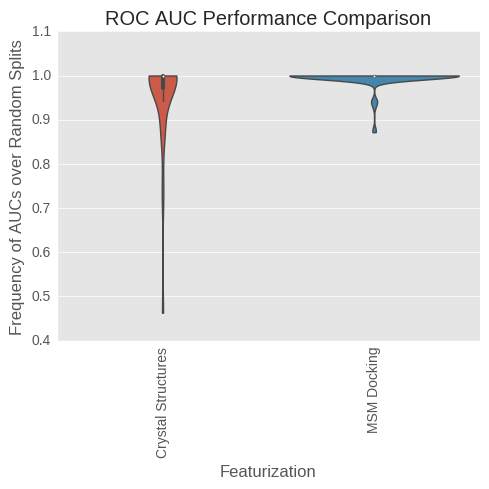

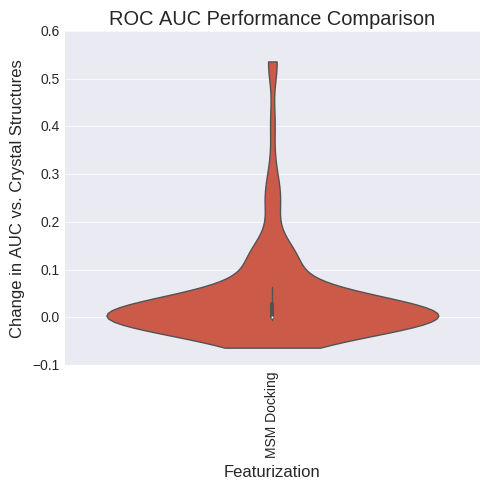

analyzing LogAUC
(100, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.172918          0.000000   
MSM Docking           0.195501          0.022583   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.625319476661, 0.843570179482)  


ValueError: list.remove(x): x not in list

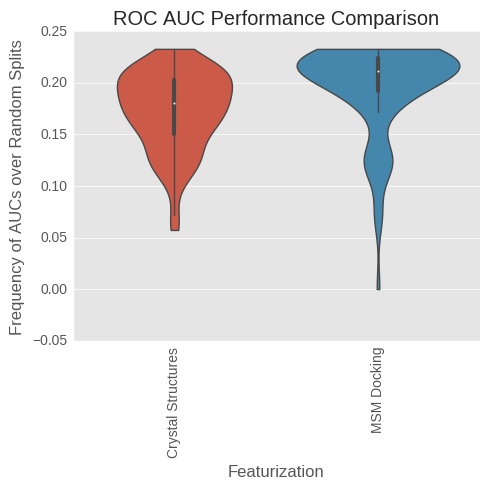

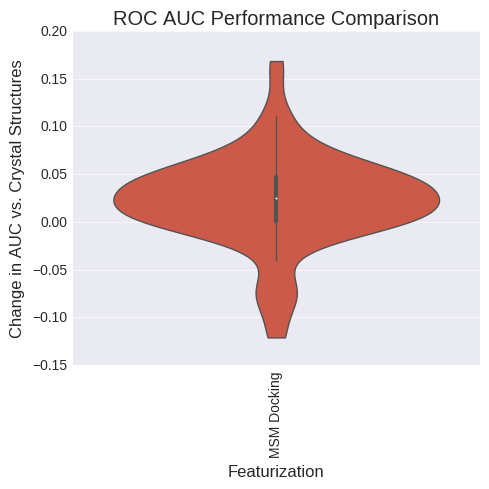

(3,)
(1, 3)


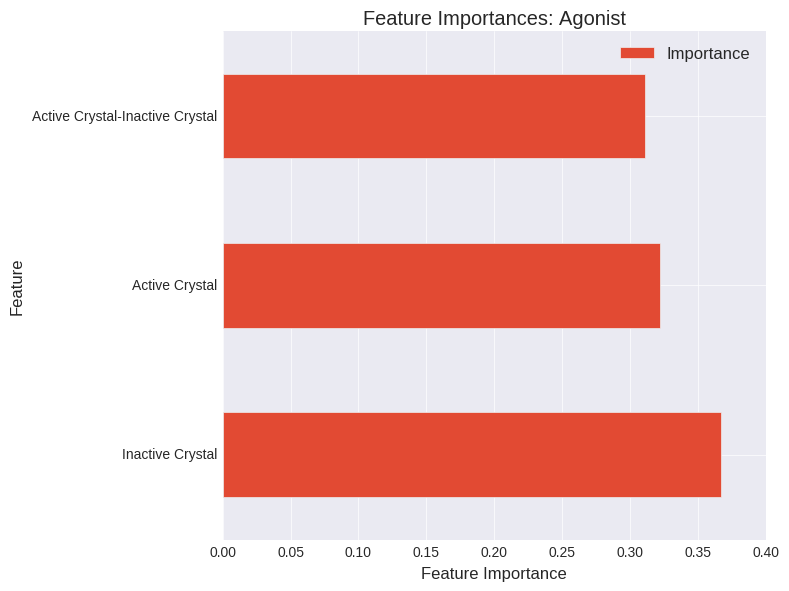

(56,)
(1, 56)


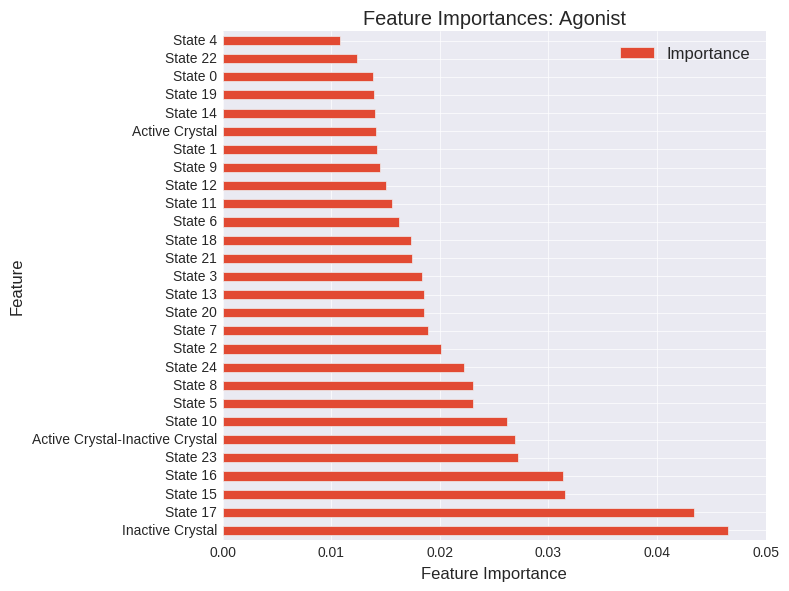

In [346]:
#Normalize False, axis0 True, RFR; unrefined wikipedia
importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], ligand_df.index.values, analysis_dir,
                                                                ["Antagonist", "Agonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([new_df.iloc[indices].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False, fxn=np.mean)

In [266]:
analysis_dir

'/home/enf/md_simulations/MOR/h8_reimaged/sparse-tICA_t50_n_components10all_residues_4dkl_5c1m_under_cutoff6A-CA-py3-far_regularization_wolf_autoShrinkage0pt01-backup/analysis_n_clusters100_random'

In [267]:
save_name

'agonist_rfr_trials100_split0.9_normalizeFalse_normalize-axis0False_n-estimators1000_precisionXP'

In [221]:
roc_auc_score(test_ligand_df["label"].values, test_df.loc[test_ligand_df.index.values.tolist()].values[:,1])

NameError: name 'test_ligand_df' is not defined

In [370]:
new_df.index.values.tolist()

['1-iodomorphine',
 '14-cinnamoyloxycodeinone',
 '14-ethoxymetopon',
 '14-hydroxydihydrocodeine',
 '14-methoxydihydromorphinone',
 '14-methoxymetopon',
 '14-phenylpropoxymetopon',
 '3-allylfentanyl',
 '3-methylbutyrfentanyl',
 '3-methylfentanyl',
 '3-methylthiofentanyl',
 '4-1',
 '4-10',
 '4-11',
 '4-12',
 '4-13',
 '4-14',
 '4-15',
 '4-16',
 '4-17',
 '4-18',
 '4-19',
 '4-2',
 '4-20',
 '4-21',
 '4-22',
 '4-23',
 '4-24',
 '4-25',
 '4-26',
 '4-27',
 '4-28',
 '4-29',
 '4-3',
 '4-30',
 '4-31',
 '4-32',
 '4-33',
 '4-34',
 '4-35',
 '4-36',
 '4-37',
 '4-38',
 '4-39',
 '4-4',
 '4-40',
 '4-41',
 '4-42',
 '4-43',
 '4-44',
 '4-45',
 '4-46',
 '4-47',
 '4-48',
 '4-49',
 '4-5',
 '4-50',
 '4-51',
 '4-52',
 '4-53',
 '4-54',
 '4-6',
 '4-7',
 '4-8',
 '4-9',
 '4-fluorobutyrfentanyl',
 '4-fluoropethidine',
 '4-methoxybutyrfentanyl',
 '4-phenylfentanyl',
 '6-methylenedihydrodesoxymorphine',
 '6-monoacetylmorphine',
 '6beta-naltrexol-d4',
 '7-hydroxymitragynine',
 '7-pet',
 '8-carboxamidocyclazocine',
 'acet

In [367]:
test_ligand_df["label"]

ic-26                         1.0
n-methylcarfentanil           1.0
dimepheptanol                 1.0
anileridine                   1.0
metopon                       1.0
dextromoramide                1.0
n-phenethylnordesomorphine    1.0
phenadoxone                   1.0
cyclofoxy                     0.0
alvimopan                     0.0
pepap                         1.0
ibntxa                        1.0
bezitramide                   1.0
meprodine                     1.0
beta-methylfentanyl           1.0
alimadol                      1.0
dermorphin                    1.0
properidine                   1.0
methyldesorphine              1.0
cebranopadol                  1.0
mt-45                         1.0
n-phenethylnormorphine        1.0
oxpheneridine                 1.0
furanylfentanyl               1.0
beta-funaltrexamine           0.0
brifentanil                   1.0
betacetylmethadol             1.0
oxilorphan                    0.0
3-methylfentanyl              1.0
isomethadone  

In [309]:
list(results_dict.keys())

['two_class_nomethadone_rfr_trials100_tanimoto0.7',
 'agonist_rfr_trials0_split0.9_normalizeFalse_normalize-axis0True_n-estimators1000_precisionXP',
 'agonist_rfr_trials100_split0.9_normalizeFalse_normalize-axis0False_n-estimators1000_precisionXP',
 'agonist_rfr_trials1000_split0.9_normalizeFalse_normalize-axis0True_n-estimators1000_precisionXP',
 'agonist_rfr_trials100_split0.9_normalizeFalse_normalize-axis0True_n-estimators1000_precisionXP']

In [73]:
from efficacy_scripts import *
smiles_list, compound_names, pc_smiles, pc_names = convert_sdfs_to_compounds(["/home/enf/htbc/sdfs/%s.sdf" %f for f in test_df.index.values], parallel=True, worker_pool=dview)
smiles_list = [s.strip() for s in smiles_list]
pc_smiles = [s.strip() for s in pc_smiles]
compound_names_df = pd.DataFrame(list(zip(smiles_list, compound_names, pc_smiles, pc_names)), index=test_df.index, columns=["smiles", "pubchem_name", "pubchem_smiles", "alternate_name"])
#for lig in p_bias_df.loc[[n for n in p_bias_df.index.values.tolist() if "_" == n[0]]].index.values[:100]:
#    for mol in pb.readfile("sdf", "/home/enf/htbc/sdfs/%s.sdf" %lig):
#        a = str(mol)
#        break
#    c = get_compounds(a, namespace='smiles')
    #print(c[0].synonyms)

Getting SMILES from SDFs...
Done. Now getting compound names from SMILES...
Done. returning compound names.


ValueError: too many values to unpack (expected 4)

In [2]:
test_df[["pubchem_name", "smiles", "alternate_smiles", "alternate_name"]] = compound_names_df.loc[test_df.index][["pubchem_name", "smiles", "pubchem_smiles", "alternate_name"]]
bret_pred_df = test_df.loc[[n for n in test_df.index.values if n in common_ligands]]
bret_pred_df["label"] = 0.
bret_pred_df["label"].loc[common_ligands] = y
from rdkit.ML.Scoring.Scoring import CalcAUC
CalcAUC(bret_pred_df.values[:,(0,1)], col=0)#, alpha=10)

NameError: name 'compound_names_df' is not defined

In [369]:
test_df.loc[[n for n in test_df.index.values if "compd0" in n or "compd11" in n]].sort("class B", ascending=False,inplace=False).iloc[:]

,class A,class B
index,,
compd11,0.098,0.902
compd06,0.174,0.826
compd111,0.212,0.788
compd05,0.243,0.757
compd110,0.256,0.744
compd113,0.268,0.732
compd112,0.325,0.675
compd07,0.396,0.604
compd09,0.412,0.588


In [124]:
full_docking_df.loc["n_benzyl_mitragynine"]

Inactive Crystal    6.66
Active Crystal      5.70
State 0             4.14
State 10            6.32
State 11            3.58
State 12            3.63
State 13            4.70
State 14            7.81
State 15            4.91
State 16            4.75
State 17            3.64
State 18            4.10
State 19            5.53
State 1             3.92
State 20            4.64
State 21            5.69
State 22            3.64
State 23            4.62
State 24            5.77
State 25            6.28
State 26            3.75
State 27            5.39
State 28            4.53
State 29            7.49
State 2             5.38
State 30            5.76
State 31            4.77
State 32            6.49
State 33            4.11
State 34            6.93
State 35            4.70
State 36            5.60
State 37            4.85
State 38            7.24
State 39            4.43
State 3             5.89
State 40            3.50
State 41            5.29
State 42            4.45
State 43            4.19


In [95]:
sorted(model_agonists)

['14-ethoxymetopon',
 '14-methoxydihydromorphinone',
 '14-methoxymetopon',
 '14-phenylpropoxymetopon',
 '3-allylfentanyl',
 '3-methylbutyrfentanyl',
 '3-methylfentanyl',
 '3-methylthiofentanyl',
 '4-fluorobutyrfentanyl',
 '4-fluoropethidine',
 '4-methoxybutyrfentanyl',
 '4-phenylfentanyl',
 '6-methylenedihydrodesoxymorphine',
 '6-monoacetylmorphine',
 '6beta-naltrexol-d4',
 '7-pet',
 'acetylfentanyl',
 'acetylmethadol',
 'acrylfentanyl',
 'ah-7921',
 'alfentanil',
 'alimadol',
 'allylnorpethidine',
 'allylprodine',
 'alpha-methylacetylfentanyl',
 'alphacetylmethadol',
 'alphamethadol',
 'alphamethylthiofentanyl',
 'alvimopan',
 'anileridine',
 'at-076',
 'axelopran',
 'azaprocin',
 'azidomorphine',
 'bdpc',
 'benzethidine',
 'beta-chlornaltrexamine',
 'beta-funaltrexamine',
 'beta-methylfentanyl',
 'betacetylmethadol',
 'betahydroxyfentanyl',
 'betahydroxythiofentanyl',
 'betamethadol',
 'bevenopran',
 'bezitramide',
 'brifentanil',
 'bromadoline',
 'butyrfentanyl',
 'c-8813',
 'carfen

In [76]:
test_df

,class A,class B
index,,
desmethylprodine,0.002,0.998
acrylfentanyl,0.003,0.997
alimadol,0.003,0.997
properidine,0.004,0.996
diampromide,0.005,0.995
r-30490,0.005,0.995
pethidine,0.006,0.994
phenampromide,0.006,0.994
ethoheptazine,0.006,0.994


Fitting models over all data...
Fitting models over split train data...
0
1
2
3
4
5
6
7
8
9
                    Median AUC  Median delta AUC       Sign Test 99% CI
Crystal Structures    0.500000          0.000000               (0, 0.0)
MSM Docking           0.725589          0.225589  (0.601145906695, 1.0)


ValueError: list.remove(x): x not in list

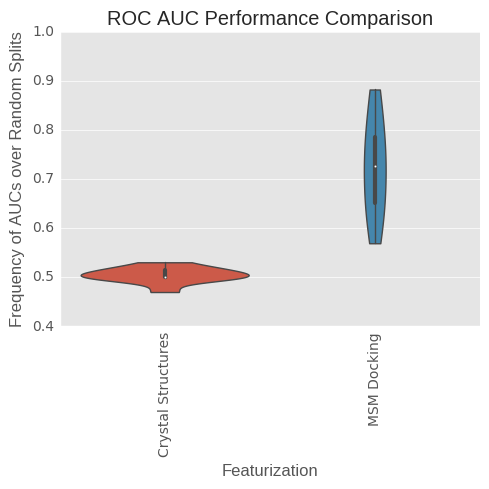

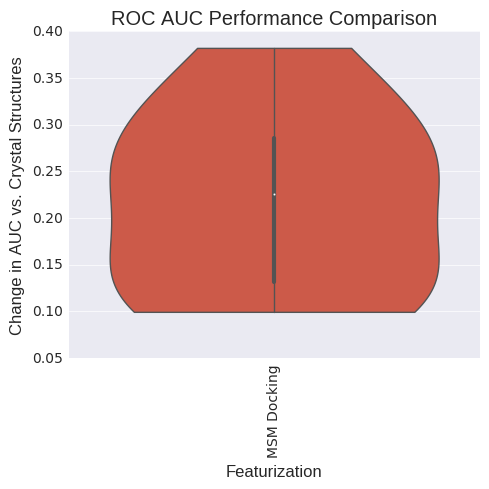

(1, 3)
(1, 3)


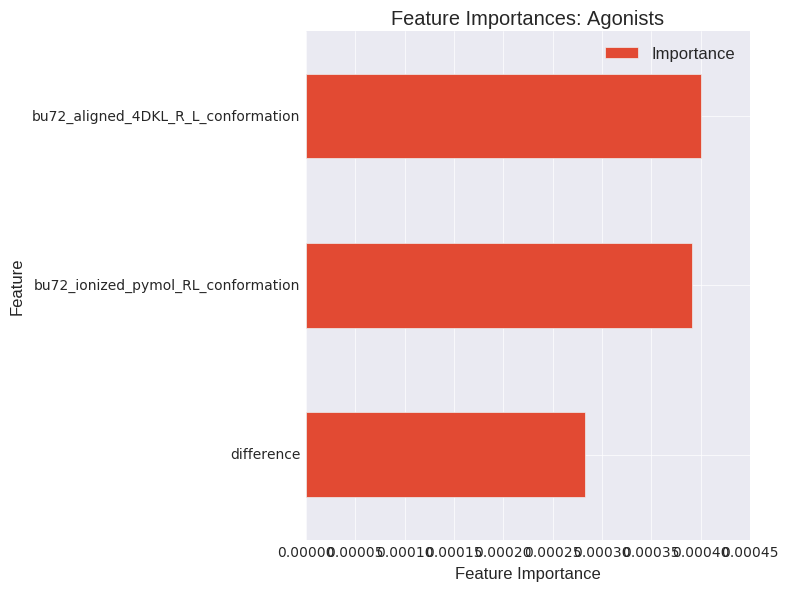

(1, 101)
(1, 101)


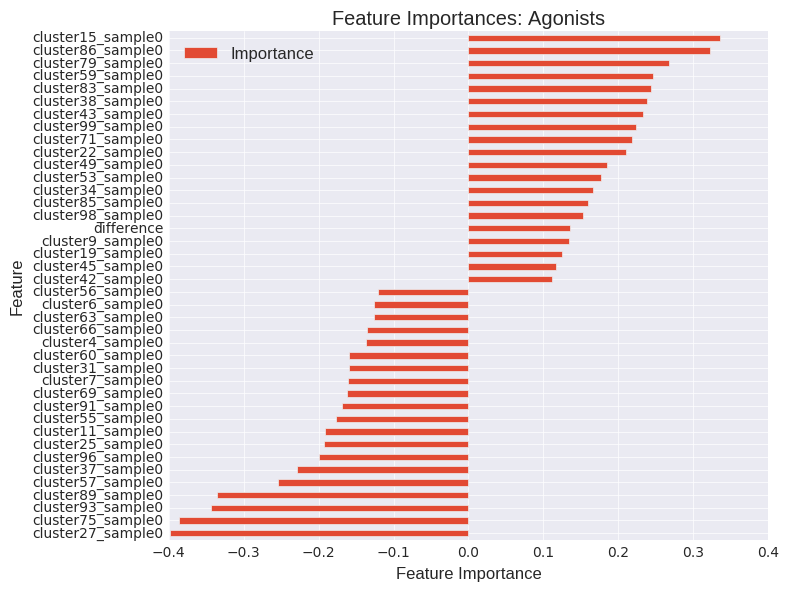

In [408]:
n_trials = 1000
train_test_split_prop = 0.8

ligand_df = copy.deepcopy(ori_ligand_df)
classes = ligand_df["action"].values.tolist()
class_labels = []
indices = []
for i, label in enumerate(classes):
        if "antagonist" in label.lower():# or "neutral" in label.lower() or "negative" in label.lower():
                class_labels.append(0.)
                indices.append(i)
        elif "agonist" in label.lower():# or "positive" in label.lower():
                class_labels.append(1.)
                indices.append(i)
ligand_df = ligand_df.iloc[indices]
ligand_df["label"] = class_labels
y = ligand_df["label"].values.reshape((-1,1))

model_type = "rfr"

save_name = "two_class_wiki_%s_trials%d_split%s.pkl" %(model_type, n_trials, str(train_test_split_prop))
results_dict[save_name] = generate_or_load_model(features, y, feature_names, n_trials, train_test_split_prop, False, model_type, "%s/%s.pkl" %(analysis_dir, save_name),redo=False)

analyze_multiclass_experiment(results_dict[save_name], 
                                                            ["Crystal Structures", "MSM Docking"],
                                                            [[n for n in docking_df.columns if "cluster" not in n], X_df.columns], common_ligands, analysis_dir,
                                                            ["Antagonists", "Agonists"], X, 
                                                            exp_title="Antagonist vs. Agonist, %s" %model_type, coef_name="Logistic Coefficient")


In [398]:
cluster15_sample0                     8.24
cluster78_sample0                     7.47
cluster99_sample0                     7.36
cluster17_sample0                     7.31
cluster33_sample0                     7.04
cluster3_sample0                      6.96
cluster25_sample0                     6.88
cluster31_sample0                     6.77
cluster16_sample0                     6.68
cluster50_sample0                     6.66

cluster90_sample0                     6.57
cluster12_sample0                     6.97
cluster79_sample0                     6.99
cluster48_sample0                     7.01
cluster41_sample0                     7.10
cluster75_sample0                     7.11
cluster87_sample0                     7.19
cluster59_sample0                     7.24
cluster49_sample0                     7.30
cluster16_sample0                     7.57

full_docking_df.iloc[:10]

,bu72_aligned_4DKL_R_L_conformation,bu72_ionized_pymol_RL_conformation,cluster0_sample0,cluster10_sample0,cluster11_sample0,cluster12_sample0,cluster13_sample0,cluster14_sample0,cluster15_sample0,cluster16_sample0,cluster17_sample0,cluster18_sample0,cluster19_sample0,cluster1_sample0,cluster20_sample0,cluster21_sample0,cluster22_sample0,cluster23_sample0,cluster24_sample0,cluster25_sample0,cluster26_sample0,cluster27_sample0,cluster28_sample0,cluster29_sample0,cluster2_sample0,cluster30_sample0,cluster31_sample0,cluster32_sample0,cluster33_sample0,cluster34_sample0,cluster35_sample0,cluster36_sample0,cluster37_sample0,cluster38_sample0,cluster39_sample0,cluster3_sample0,cluster40_sample0,cluster41_sample0,cluster42_sample0,cluster43_sample0,cluster44_sample0,cluster45_sample0,cluster46_sample0,cluster47_sample0,cluster48_sample0,cluster49_sample0,cluster4_sample0,cluster50_sample0,cluster51_sample0,cluster52_sample0,cluster53_sample0,cluster54_sample0,cluster55_sample0,cluster56_sample0,cluster57_sample0,cluster58_sample0,cluster59_sample0,cluster5_sample0,cluster60_sample0,cluster61_sample0,cluster62_sample0,cluster63_sample0,cluster64_sample0,cluster65_sample0,cluster66_sample0,cluster67_sample0,cluster68_sample0,cluster69_sample0,cluster6_sample0,cluster70_sample0,cluster71_sample0,cluster72_sample0,cluster73_sample0,cluster74_sample0,cluster75_sample0,cluster76_sample0,cluster77_sample0,cluster78_sample0,cluster79_sample0,cluster7_sample0,cluster80_sample0,cluster81_sample0,cluster82_sample0,cluster83_sample0,cluster84_sample0,cluster85_sample0,cluster86_sample0,cluster87_sample0,cluster88_sample0,cluster89_sample0,cluster8_sample0,cluster90_sample0,cluster91_sample0,cluster92_sample0,cluster93_sample0,cluster94_sample0,cluster95_sample0,cluster96_sample0,cluster97_sample0,cluster98_sample0,cluster99_sample0,cluster9_sample0
ADL5747,7.22,5.56,6.02,6.33,3.99,6.24,5.60,6.41,5.79,7.22,5.84,6.37,7.88,5.26,4.25,5.60,6.32,6.57,7.03,5.90,5.21,5.31,7.44,6.46,5.23,6.37,5.42,6.50,6.55,8.26,5.25,5.54,4.37,5.11,5.29,4.90,5.22,7.50,5.41,5.09,5.74,5.98,6.27,7.15,6.95,6.98,5.63,5.68,6.79,4.96,5.76,6.13,4.19,7.23,4.39,5.15,5.23,6.80,6.39,5.04,6.14,3.51,5.29,5.38,6.07,6.31,8.02,6.83,5.51,5.77,5.00,5.21,5.46,6.13,7.49,5.05,5.83,4.81,6.21,6.68,6.22,6.92,6.59,6.15,4.94,6.15,5.40,5.59,5.89,6.49,5.15,8.04,6.80,6.71,6.35,5.57,7.12,4.25,5.48,5.65,6.23,6.11
ADL5859,6.25,6.25,5.81,5.73,4.96,5.62,4.82,6.27,6.02,7.80,5.46,4.23,7.07,5.48,3.58,5.33,6.77,4.68,7.39,6.04,4.77,4.78,4.54,5.40,5.09,5.22,4.89,5.85,5.10,7.10,4.60,5.20,4.33,4.80,5.01,5.32,5.31,7.50,4.23,4.74,4.13,4.95,6.15,6.86,5.84,4.69,5.52,6.24,6.06,4.74,5.92,6.90,5.31,6.70,3.67,4.10,5.62,6.05,6.76,5.55,4.89,3.86,6.05,4.97,3.91,5.85,7.02,5.24,4.35,6.69,5.08,4.71,5.36,5.79,8.00,4.57,5.15,5.84,4.43,5.66,4.54,6.27,6.31,6.64,5.20,6.44,4.75,5.45,5.93,5.31,4.81,7.52,5.32,6.11,5.76,4.81,4.74,4.54,4.75,4.29,6.22,6.10
Acetorphine,0.00,0.00,4.51,6.21,4.19,3.40,3.95,0.00,3.64,4.18,6.65,4.59,7.09,4.21,3.88,4.81,3.12,7.13,5.01,5.33,4.34,4.70,4.59,6.37,4.72,5.77,4.90,5.48,4.98,4.03,5.62,4.36,2.86,6.55,3.91,5.08,4.01,3.39,4.71,3.82,4.24,2.89,3.92,4.15,6.57,5.34,5.54,7.31,3.82,4.58,4.36,4.15,4.65,4.99,3.67,3.75,5.19,5.99,5.37,3.71,6.25,4.80,4.59,4.18,3.88,3.77,4.24,3.73,5.42,2.73,3.00,4.60,4.55,4.41,4.04,7.39,3.94,4.75,5.22,4.48,3.25,4.04,4.66,6.18,3.64,5.04,5.64,4.43,5.61,6.34,4.39,6.14,4.94,5.80,5.12,4.37,5.74,3.50,5.64,5.28,6.15,5.51
Acetyldihydrocodeine,0.00,0.00,4.90,5.62,3.22,4.39,3.37,5.06,4.93,6.44,5.62,-0.00,5.71,3.66,3.22,3.45,5.37,4.21,4.12,6.14,3.16,4.89,4.69,4.30,5.05,3.67,3.76,5.56,3.98,3.73,4.50,4.45,2.87,5.65,4.46,4.58,4.62,3.62,4.26,4.51,3.47,3.16,3.97,5.29,5.40,3.93,4.24,5.12,3.73,3.95,4.54,4.42,6.14,4.21,3.12,4.06,5.02,4.67,4.57,4.07,5.54,3.43,4.46,3.99,4.28,3.57,3.13,3.67,4.97,3.74,4.79,5.49,5.00,4.82,4.97,4.26,3.86,3.86,5.23,4.09,4.74,4.58,3.78,5.46,4.38,4.76,5.77,5.65,4.93,4.47,4.71,3.29,4.80,4.44,4.18,4.80,5.80,3.68,4.39,3.91,5.67,3.84
Acetylfentanyl,0.00,0.00,4.56,5.83,4.20,7.30,4.25

In [52]:
docking_df.loc["PZM21"].sort(inplace=False, ascending=False)


cluster68_sample0                     8.51
cluster55_sample0                     8.07
cluster15_sample0                     7.67
cluster53_sample0                     7.66
cluster11_sample0                     7.55
cluster42_sample0                     7.49
cluster75_sample0                     7.48
cluster67_sample0                     7.48
cluster50_sample0                     7.45
cluster2_sample0                      7.39
cluster49_sample0                     7.38
cluster77_sample0                     7.37
cluster9_sample0                      7.33
cluster47_sample0                     7.30
cluster84_sample0                     7.23
cluster90_sample0                     7.23
cluster19_sample0                     7.20
cluster43_sample0                     7.15
cluster39_sample0                     7.13
cluster34_sample0                     7.10
bu72_ionized_pymol_RL_conformation    7.09
cluster82_sample0                     7.06
cluster38_sample0                     7.01
cluster69_s

In [362]:
docking_df.index

Index(['ethylketocyclazocine', 'DADLE', 'DSLET',
       '__sup_3__sup_H_diprenorphine', '_Leu_enkephalin', '_Met_enkephalin',
       'dihydromorphine', 'diprenorphine', 'etonitazene', 'etorphine',
       'fentanyl', 'morphine', 'nalmefene', 'nalorphine', 'normorphine',
       'quadazocine', 'BNTX', 'CTAP', 'naloxone', 'naltrexone', 'naltriben',
       'naltrindole', 'DAMGO', 'nalbuphine', 'buprenorphine', 'PL017',
       'codeine', 'CTOP', '__sup_3__sup_H_naloxone', 'naloxonazine',
       'sufentanil', 'methadone', 'hydrocodone', 'hydromorphone',
       'levallorphan', 'loperamide', 'pethidine', 'alvimopan', 'tapentadol',
       'methylnaltrexone', 'butorphanol', 'levorphanol', 'eluxadoline',
       'tramadol', 'cebranopadol', 'SR16835', 'SCH221510', 'BW373U86',
       'ADL5747', 'ADL5859', 'HS665', 'zyklophin', 'LY2456302'],
      dtype='object')

In [87]:
results_dict

NameError: name 'results_dict' is not defined

In [380]:
ligand_df.loc[ligand_df["Activity"].str.contains("Inactive")]


,AID,Panel ID,SID,CID,Activity,AC Value (micromolar),AC Name,BioAssay Name,GI,Target Name,Outcome Method,PubMed ID,GeneID,Target Count (active),Target Count (tested),ligand,index
0,588407,0,845205,647547.0,Inactive,19.958,EC50,Luminescence-based cell-based high throughput dose response assay for agonists of heterodimerization of the mu 1 (OPRM1) and delta 1 (OPRD1) opioid receptors,117940060,NaN,Confirmatory,NaN,4988,4.0,467.0,SID_845205,SID_845205
1,588407,0,848082,650506.0,Inactive,12.436,EC50,Luminescence-based cell-based high throughput dose response assay for agonists of heterodimerization of the mu 1 (OPRM1) and delta 1 (OPRD1) opioid receptors,117940060,NaN,Confirmatory,NaN,4988,3.0,507.0,SID_848082,SID_848082
2,588407,0,849197,6602574.0,Inactive,11.516,EC50,Luminescence-based cell-based high throughput dose response assay for agonists of heterodimerization of the mu 1 (OPRM1) and delta 1 (OPRD1) opioid receptors,117940060,NaN,Confirmatory,NaN,4988,4.0,511.0,SID_849197,SID_849197
3,588407,0,851044,653596.0,Inactive,12.871,EC50,Luminescence-based cell-based high throughput dose response assay for agonists of heterodimerization of the mu 1 (OPRM1) and delta 1 (OPRD1) opioid receptors,117940060,NaN,Confirmatory,NaN,4988,8.0,512.0,SID_851044,SID_851044
4,588407,0,862666,663898.0,Inactive,10.364,EC50,Luminescence-based cell-based high throughput dose response assay for agonists of heterodimerization of the mu 1 (OPRM1) and delta 1 (OPRD1) opioid receptors,117940060,NaN,Confirmatory,NaN,4988,13.0,511.0,SID_862666,SID_862666
5,588407,0,3711252,2997570.0,Inactive,42.542,EC50,Luminescence-based cell-based high throughput dose response assay for agonists of heterodimerization of the mu 1 (OPRM1) and delta 1 (OPRD1) opioid receptors,117940060,NaN,Confirmatory,NaN,4988,6.0,518.0,SID_3711252,SID_3711252
6,588407,0,3712895,5742486.0,Inactive,92.480,EC50,Luminescence-based cell-based high throughput dose response assay for agonists of heterodimerization of the mu 1 (OPRM1) and delta 1 (OPRD1) opioid receptors,117940060,NaN,Confirmatory,NaN,4988,14.0,507.0,SID_3712895,SID_3712895
7,588407,0,3717936,3000200.0,Inactive,17.301,EC50,Luminescence-based cell-based high throughput dose response assay for agonists of heterodimerization of the mu 1 (OPRM1) and delta 1 (OPRD1) opioid receptors,117940060,NaN,Confirmatory,NaN,4988,5.0,513.0,SID_3717936,SID_3717936
9,588407,0,4248730,3242770.0,Inactive,13.551,EC50,Luminescence-based cell-based high throughput dose response assay for agonists of heterodimerization of the mu 1 (OPRM1) and delta 1 (OPRD1) opioid receptors,117940060,NaN,Confirmatory,NaN,4988,7.0,501.0,SID_4248730,SID_4248730
12,588407,0,14721854,1454688.0,Inactive,14.977,EC50,Luminescence-based cell-based high throughput dose response assay for agonists of heterodimerization of the mu 1 (OPRM1) and delta 1 (OPRD1) opioid receptors,117940060,NaN,Confirmatory,NaN,4988,13.0,471.0,SID_14721854,SID_14721854


In [41]:
ligand_df.loc[(~ligand_df["BioAssay Name"].str.contains("arrestin")) & (~ligand_df["BioAssay Name"].str.contains("hetero"))].sort("AC Value (micromolar)", ascending=True, inplace=False)# [n for n in ligand_df["BioAssay Name"].values.tolist() if "dimer" not in n])

In [17]:
from pubchempy import get_compounds, Compound, Substance


In [18]:
Substance.from_sid(160674330).source_id

'CHEMBL2048416'

In [19]:
from chembl_webresource_client import CompoundResource
compounds = CompoundResource()
print(compounds.status())

# If you get 'False' instead, this could mean that your internet connection is broken, 
# your settings are pointing to the wrong server or the server itself is down. 

# get single compound by ChEMBL:
c = compounds.get('CHEMBL1')

# `c` is now a python dictionary:
print(c)

True
{'stdInChiKey': 'GHBOEFUAGSHXPO-XZOTUCIWSA-N', 'smiles': 'COc1ccc2[C@@H]3[C@H](COc2c1)C(C)(C)OC4=C3C(=O)C(=O)C5=C4OC(C)(C)[C@@H]6COc7cc(OC)ccc7[C@H]56', 'knownDrug': 'No', 'alogp': 3.63, 'molecularFormula': 'C32H32O8', 'numRo5Violations': 1, 'rotatableBonds': 2, 'chemblId': 'CHEMBL1', 'acdLogd': 7.67, 'passesRuleOfThree': 'No', 'molecularWeight': 544.59, 'acdLogp': 7.67}


In [20]:
c["smiles"]

'COc1ccc2[C@@H]3[C@H](COc2c1)C(C)(C)OC4=C3C(=O)C(=O)C5=C4OC(C)(C)[C@@H]6COc7cc(OC)ccc7[C@H]56'

In [21]:
binding_db = pd.read_table("/home/enf/md_simulations/MOR/docking/BindingDB_ChEMBL.tsv", error_bad_lines=False)

b'Skipping line 528: expected 49 fields, saw 61\nSkipping line 529: expected 49 fields, saw 61\nSkipping line 530: expected 49 fields, saw 61\nSkipping line 531: expected 49 fields, saw 61\nSkipping line 532: expected 49 fields, saw 61\nSkipping line 533: expected 49 fields, saw 61\nSkipping line 534: expected 49 fields, saw 61\nSkipping line 535: expected 49 fields, saw 61\nSkipping line 536: expected 49 fields, saw 61\nSkipping line 537: expected 49 fields, saw 61\nSkipping line 538: expected 49 fields, saw 61\nSkipping line 539: expected 49 fields, saw 61\nSkipping line 540: expected 49 fields, saw 61\nSkipping line 541: expected 49 fields, saw 61\nSkipping line 542: expected 49 fields, saw 61\nSkipping line 543: expected 49 fields, saw 61\nSkipping line 544: expected 49 fields, saw 61\nSkipping line 545: expected 49 fields, saw 61\nSkipping line 546: expected 49 fields, saw 61\nSkipping line 547: expected 49 fields, saw 61\nSkipping line 548: expected 49 fields, saw 61\nSkipping li

In [40]:
with open("/home/enf/md_simulations/MOR/docking/binding_db.pkl", "wb") as f:
    pickle.dump(binding_db, f, protocol=2)

In [ ]:
binding_db.index = binding_db["ChEMBL ID of Ligand"][]

In [35]:
from importlib import reload
import grids
reload(grids)
from grids import *

In [38]:
cid_df= prepare_ligands("", exts = [".mae"],
        n_ring_conf=1, n_stereoisomers=1,
        force_field=16, worker_pool=None,
        parallel=True, redo=False,
        smiles_df=None, cid_df=ligand_df.iloc[:50],
        binding_db=binding_db[['PubChem CID', 'PubChem SID',
        'ChEMBL ID of Ligand', 'Ligand SMILES']])

In [39]:
cid_df

,AID,Panel ID,SID,CID,Activity,AC Value (micromolar),AC Name,BioAssay Name,GI,Target Name,Outcome Method,PubMed ID,GeneID,Target Count (active),Target Count (tested),smiles,ligand
0,588407,0,845205,647547.0,Inactive,19.958,EC50,Luminescence-based cell-based high throughput ...,117940060,NaN,Confirmatory,NaN,4988,4.0,467.0,CC1=CC=CC2=C1NC(=O)C(=C2)C(C3=NN=NN3CC4=CC=CC=...,SID_845205
1,588407,0,848082,650506.0,Inactive,12.436,EC50,Luminescence-based cell-based high throughput ...,117940060,NaN,Confirmatory,NaN,4988,3.0,507.0,CC1=CC(=C(C=C1)C)CN2CCC(CC2)N3C4=C(C=C(C=C4)F)...,SID_848082
2,588407,0,849197,6602574.0,Inactive,11.516,EC50,Luminescence-based cell-based high throughput ...,117940060,NaN,Confirmatory,NaN,4988,4.0,511.0,CCC(=O)OC1(CC(N(CC1C)C)C)C2=CC(=CC=C2)C.Cl,SID_849197
3,588407,0,851044,653596.0,Inactive,12.871,EC50,Luminescence-based cell-based high throughput ...,117940060,NaN,Confirmatory,NaN,4988,8.0,512.0,C1CCC2(CC1)CCCN(C2)S(=O)(=O)C3=CC=C(C=C3)S(=O)...,SID_851044
4,588407,0,862666,663898.0,Inactive,10.364,EC50,Luminescence-based cell-based high throughput ...,117940060,NaN,Confirmatory,NaN,4988,13.0,511.0,C1CS(=O)(=O)CC1N(CC2=CC=CO2)C(=O)C3=C(C4=CC=CC...,SID_862666
5,588407,0,3711252,2997570.0,Inactive,42.542,EC50,Luminescence-based cell-based high throughput ...,117940060,NaN,Confirmatory,NaN,4988,6.0,518.0,CC1=CC(=O)OC2=C1C=CC(=C2)NC(=O)C3COC4=CC=CC=C4O3,SID_3711252
6,588407,0,3712895,5742486.0,Inactive,92.480,EC50,Luminescence-based cell-based high throughput ...,117940060,NaN,Confirmatory,NaN,4988,14.0,507.0,CCOC(=O)C1=C(NC(=C1C)C(=O)OCC(=O)C(=C2NC3=CC=C...,SID_3712895
7,588407,0,3717936,3000200.0,Inactive,17.301,EC50,Luminescence-based cell-based high throughput ...,117940060,NaN,Confirmatory,NaN,4988,5.0,513.0,CC1=CC(=CC=C1)OCCC(=O)NCC(C2=CC=CC=C2)N(C)C,SID_3717936
8,588407,0,4242652,3237480.0,Active,1.274,EC50,Luminescence-based cell-based high throughput ...,117940060,NaN,Confirmatory,NaN,4988,6.0,514.0,CN(C)C(CNC(=O)NC1CCCCC1)C2=CN=CC=C2,SID_4242652
9,588407,0,4248730,3242770.0,Inactive,13.551,EC50,Luminescence-based cell-based high throughput ...,117940060,NaN,Confirmatory,NaN,4988,7.0,501.0,CCCC(=O)NC(C)C(C1=CC=CS1)N2CCN(CC2)C3=CC=CC=C3,SID_4248730


In [ ]:
arrestin_df = ligand_df.loc[(~ligand_df["BioAssay Name"].str.contains("hetero")) & (~ligand_df["BioAssay Name"].str.contains("Counter"))]# & (ligand_df["BioAssay Name"].str.contains("GTP"))]
plt.hist(arrestin_df["AC Value (micromolar)"].dropna().values, bins=50)
plt.show()

In [ ]:
arrestin_df["AC Value (micromolar)"].dropna()

In [44]:
for name in list(set([n for n in ligand_df["BioAssay Name"].values.tolist() if "dimer" not in n])):
        print("%d, %s" %(ligand_df.loc[ligand_df["BioAssay Name"] == name].shape[0], name))

13, Stimulation of [35S]GTP-gamma-S, binding to recombinant human Opioid receptor mu 1 expressed in CHO cells
9, Agonist activity at human mu opioid receptor transfected in CHO cells assessed as stimulation of [35S]GTPgammaS binding after 60 mins by beta-plate liquid scintillation counting analysis
6, Agonist activity at human opioid gamma receptor expressed in CHO cells assessed as stimulation of [35S]GTP-gamma-S binding
23, Agonist activity at human delta opioid receptor expressed in CHO cells assessed as stimulation of [35S]GTP-gamma-S binding
4, Agonist activity at human MOR expressed in CHO cells assessed as inhibition of forskolin-induced cAMP accumulation after 30 mins by luminescence assay
12, Agonist activity at human MOP receptor expressed in CHO-K1 cells assessed as induction of [35S]GTPgammaS binding after 30 mins by liquid scintillation counting
6, Agonist activity at human recombinant mu opioid receptor expressed in CHO cell membranes after 60 mins by [35S]GTPgammaS bindi

In [ ]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *
n_trials = 1000

y = multi_binarizer(y_gpr, [0.2, 0.8])
gprot_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=True, model="logistic_cv")
with open("%s/gprot_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs.pkl" %analysis_dir, "wb") as f:
        pickle.dump(gprot_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs, f)

y = multi_binarizer(y_arr, [0.2, 0.8])
arr_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=True, model="logistic_cv")
with open("%s/arr_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs.pkl" %analysis_dir, "wb") as f:
        pickle.dump(arr_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs, f)


y = multi_binarizer(y_gpr, [0.2])
gprot_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=True, model="logistic_cv")
with open("%s/gprot_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs.pkl" %analysis_dir, "wb") as f:
        pickle.dump(gprot_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs, f)

y = multi_binarizer(y_arr, [0.2])
arr_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=True, model="logistic_cv")
with open("%s/arr_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs.pkl" %analysis_dir, "wb") as f:
        pickle.dump(arr_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs, f)



In [ ]:
np.median(np.array(a_vs_g_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs["test_roc_aucs"]), axis=0)


In [ ]:
arr_results_t100_single0pt2_split0pt9_rfr_2f_obs["feature_importances"][0]

In [ ]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *
analyze_multiclass_experiment(gprot_results_t100_single0pt2_split0pt9_logistic_cv_2f_obs, 
                                                            ["Crystal Structures", "MSM Docking"],
                                                            top_clusters.tolist() + null_features.columns.values.tolist(), common_agonists, analysis_dir,
                                                            ["GProtein Antagonists", "GProtein Agonists"], X_scaled, 
                                                            exp_title="GProtein Class", coef_name="Logistic Coefficient")


In [ ]:
all_features_df.columns.shape

In [ ]:
arr_results_t100_single0pt2_split0pt9_rfr_2f_obs["feature_importances"][0][2].shape

In [ ]:
all_features_df.columns.values.tolist()